# Measuring emission line fluxes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import lmfit
from lmfit import minimize, Parameters
from astropy.io import fits

import uncertainties.umath as uum
from uncertainties import ufloat
from uncertainties import unumpy as upy

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

from magE.directMethod import directT, run_all
from magE.functions import mergeSpec, gaussian, to_vel, FWHM, dV, save_catalog
from magE.plotutils import * 
from magE.constutils import *

PATH = '/home/benjamin/Documents/analogs/specs/final_spec/'
os.chdir(PATH)
os.getcwd()

'/home/benjamin/Documents/analogs/specs/final_spec'

In [2]:
# For intrinsic broadening
# J0023 merged specs in 5464

wcal_red = fits.open('/home/benjamin/Documents/pypeit23/redux_J0023/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')
wcal_blue = fits.open('/home/benjamin/Documents/pypeit23/redux_J0023/blue/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')

In [3]:
# read the data
import pandas as pd
galname = 'J0023'
j0023 = pd.read_csv(galname + '.csv')

wave = j0023['wave'].to_numpy()
flux = j0023['flux'].to_numpy()
err = j0023['noise'].to_numpy()
igal = np.argmax(np.array(galnames) == 'J0023')

class SpecPiece(object):
    
    def __init__(self, name, wavelength, flux, noise):
        self.name = name
        self.wavelength = wavelength
        self.flux = flux
        self.noise = noise

# Main lines

# [NII]6548 + Ha + [NII]6584
select = (wave > 6880) * (wave < 6950)
ha_nii = SpecPiece('ha+nii', wave[select], flux[select], err[select])

# Hb + [OIII]4959 + [OIII]5007
select = (wave > 5250) * (wave < 5300)
oiii_hei = SpecPiece('oiii+hei', wave[select], flux[select], err[select])


# Low ionization lines

# [OII]7319 + [OII]7330
select = (wave > 7690) * (wave < 7745)
oii_7320 = SpecPiece('oii7330', wave[select], flux[select], err[select])

# HeI7065
select = (wave > 7410) * (wave < 7475)
hei_7065 = SpecPiece('hei7065', wave[select], flux[select], err[select])

# HeI6678
select = (wave > 7000) * (wave < 7070)
hei_6678 = SpecPiece('hei6678', wave[select], flux[select], err[select])

# [SII]6716 + [SII]6731
select = (wave > 7060) * (wave < 7105)
sii = SpecPiece('sii', wave[select], flux[select], err[select])

# HeI5875
select = (wave > 6160) * (wave < 6220)
hei_5875 = SpecPiece('hei5875', wave[select], flux[select], err[select])

# [NII]5755
select = (wave > 6040) * (wave < 6080)
nii_5755 = SpecPiece('nii5755', wave[select], flux[select], err[select])

# Hb
select = (wave > 5100) * (wave < 5140)
hbeta = SpecPiece('hb', wave[select], flux[select], err[select])

# HeI4471
select = (wave > 4675) * (wave < 4745)
hei_4471 = SpecPiece('hei4471', wave[select], flux[select], err[select])

# Hg
select = (wave > 4560) * (wave < 4585)
hgamma = SpecPiece('hg', wave[select], flux[select], err[select])

# Hd
select = (wave > 4305) * (wave < 4335)
hdelta = SpecPiece('hd', wave[select], flux[select], err[select])

# [SII]4068 + [SII]4076
select = (wave > 4280) * (wave < 4300)
sii2 = SpecPiece('sii2', wave[select], flux[select], err[select])

# [OII]3726 + [OII]3729
select = (wave > 3910) * (wave < 3945)
oii_3727 = SpecPiece('oii3727', wave[select], flux[select], err[select])


# High ionization lines

# [SIII]9532
select = (wave > 10000) * (wave < 10080)
siii_9532 = SpecPiece('siiia', wave[select], flux[select], err[select])

# [SIII]9069
select = (wave > 9500) * (wave < 9610)
siii_9069 = SpecPiece('siiib', wave[select], flux[select], err[select])

# [Ar III]7135
select = (wave > 7480) * (wave < 7550)
ariii_7135 = SpecPiece('ariii_7135', wave[select], flux[select], err[select])

# [OI]6300 + [SIII]6312
select = (wave > 6610) * (wave < 6680)
oi_siii = SpecPiece('oi+siiic', wave[select], flux[select], err[select])

# [OIII]4959
select = (wave > 5205) * (wave < 5240)
oiii_4959 = SpecPiece('oiiib', wave[select], flux[select], err[select])

# [Ar IV]4740
select = (wave > 4980) * (wave < 5010)
ariv_7135 = SpecPiece('ariv_4740', wave[select], flux[select], err[select])

# HeII4686
select = (wave > 4910) * (wave < 4960)
heii_4686 = SpecPiece('heii4686', wave[select], flux[select], err[select])

# [Fe III]4658
select = (wave > 4880) * (wave < 4930)
feiii_4658 = SpecPiece('feiii_4658', wave[select], flux[select], err[select])

# [OIII]4363
select = (wave > 4580) * (wave < 4610)
oiii_4363 = SpecPiece('oiiic', wave[select], flux[select], err[select])

# [NeIII]3868
select = (wave > 4060) * (wave < 4090)
neiii_3868 = SpecPiece('neiiia', wave[select], flux[select], err[select])

Text(0.5, 0, 'Obs wavelength ($\\AA$)')

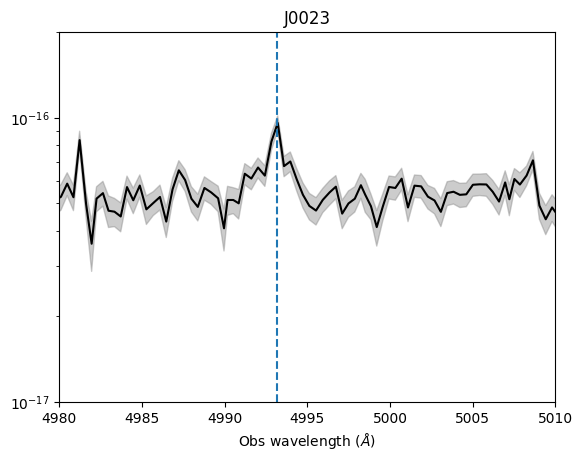

In [4]:
plt.plot(wave, flux, color='black')
plt.xlim(4980, 5010)
plt.axvline((1 + z_BN[igal])*wave_cat['[ArIV]4740'], ls='--')
plt.ylim(1e-17, 2e-16)
plt.fill_between(wave, flux - err, flux + err, color='gray', alpha=0.4)
plt.yscale('log')
plt.title('J0023')
plt.xlabel('Obs wavelength ($\AA$)')
#plt.savefig('/home/benjamin/Documents/analogs/HeIIJ0023.pdf', bbox_inches='tight')

----

# Two component model fit for [OIII] 4959

In [25]:
wcal_red.info()

Filename: /home/benjamin/Documents/pypeit23/redux_J0023/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SPAT_IDS      1 ImageHDU        26   (10,)   int64   
  2  SPAT_ID-492_WAVEFIT    1 BinTableHDU     40   1R x 6C   [91D, 91D, 91J, 2048D, 2048D, 108D]   
  3  SPAT_ID-492_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [91D, 91D, 1K, 91D, 5D, 91K]   
  4  SPAT_ID-563_WAVEFIT    1 BinTableHDU     40   1R x 6C   [105D, 105D, 105J, 2048D, 2048D, 118D]   
  5  SPAT_ID-563_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [105D, 105D, 1K, 105D, 5D, 105K]   
  6  SPAT_ID-629_WAVEFIT    1 BinTableHDU     40   1R x 6C   [99D, 99D, 99J, 2048D, 2048D, 111D]   
  7  SPAT_ID-629_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [99D, 99D, 1K, 99D, 5D, 99K]   
  8  SPAT_ID-690_WAVEFIT    1 BinTableHDU     40   1R x 6C   [103D, 103D, 103J, 2048D, 2048D, 132D]   
  9  SPAT_ID-690_PY

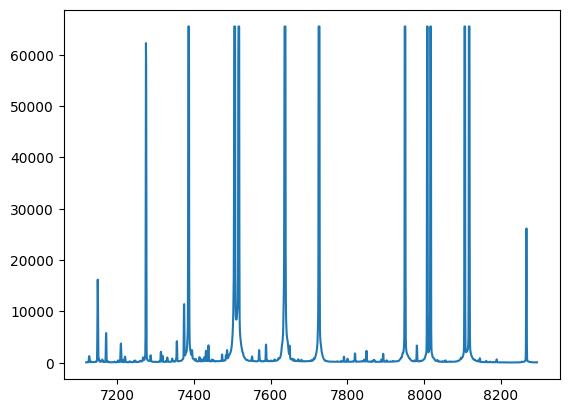

In [31]:
plt.plot(wcal_red[16].data['wave_soln'][0], wcal_red[23].data[:, 7])
#plt.xlim(6900, 6930)
#plt.ylim(0, 3500)

# [OIII]4959

### Arc lines

In [7]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4959 = [wave_cat['[OIII]4959']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4959']*(1 + z_BN[igal]) + 10]
mask_arc_4959 = (wcal_blue[12].data['wave_soln'][0] >= wlims_4959[0]) & (wcal_blue[12].data['wave_soln'][0] < wlims_4959[1])

# Arc spectra around the fitted line
x_arc_4959 = wcal_blue[12].data['wave_soln'][0][mask_arc_4959]
y_arc_4959 = wcal_blue[25].data[:, 5][mask_arc_4959]

100%|███████████████████████████████████████| 2500/2500 [00:29<00:00, 84.94it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 21.21767821 136.31003216  81.2091791   83.48976677  37.17272632
  76.33431074  72.02435668]


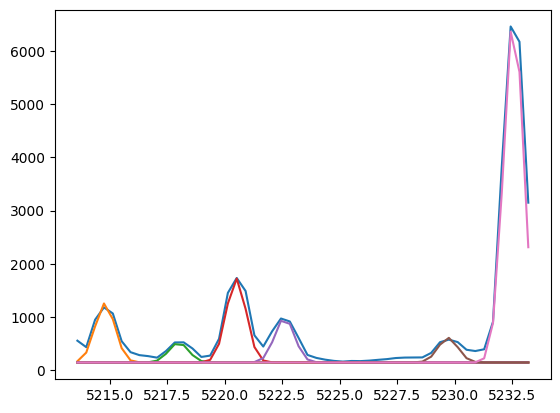

In [8]:
plt.plot(x_arc_4959, y_arc_4959)
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 1200, 5214.8, 0, 0.43))
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 400,    5218, 0, 0.43))
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 1700, 5220.5, 0, 0.43))
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 900, 5222.6, 0, 0.43))
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 500, 5229.7, 0, 0.43))
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, 7000, 5232.55, 0, 0.43))

params_arc_4959 = Parameters()
params_arc_4959.add('z', value=0.0, vary=False)
params_arc_4959.add('mu1', value=5214.8, vary=False)
params_arc_4959.add('mu2', value=5218, vary=False)
params_arc_4959.add('mu3', value=5220.5, vary=False)
params_arc_4959.add('mu4', value=5222.6, vary=False)
params_arc_4959.add('mu5', value=5229.7, vary=False)
params_arc_4959.add('mu6', value=5232.55, vary=False)
params_arc_4959.add('arc1', value=1200, min=0.)
params_arc_4959.add('arc2', value=400, min=0.)
params_arc_4959.add('arc3', value=1700, min=0.)
params_arc_4959.add('arc4', value=900, min=0.)
params_arc_4959.add('arc5', value=500, min=0.)
params_arc_4959.add('arc6', value=7000, min=0.)
params_arc_4959.add('sigma', value=0.43, min=0.)
params_arc_4959.add('bkg', value=150, vary=False)

def residual_arc_4959(params_arc_4959, x, data, uncertainty):
    
    z = params_arc_4959['z']
    mu1 = params_arc_4959['mu1']
    mu2 = params_arc_4959['mu2']
    mu3 = params_arc_4959['mu3']
    mu4 = params_arc_4959['mu4']
    mu5 = params_arc_4959['mu5']
    mu6 = params_arc_4959['mu6']
    flux1 = params_arc_4959['arc1']
    flux2 = params_arc_4959['arc2']
    flux3 = params_arc_4959['arc3']
    flux4 = params_arc_4959['arc4']
    flux5 = params_arc_4959['arc5']
    flux6 = params_arc_4959['arc6']
    sigma = params_arc_4959['sigma']
    bkg = params_arc_4959['bkg']
    
    x = x_arc_4959
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6
    return (model - y_arc_4959) / 10

np.random.seed(23)
out_arc_4959 = minimize(residual_arc_4959, params_arc_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

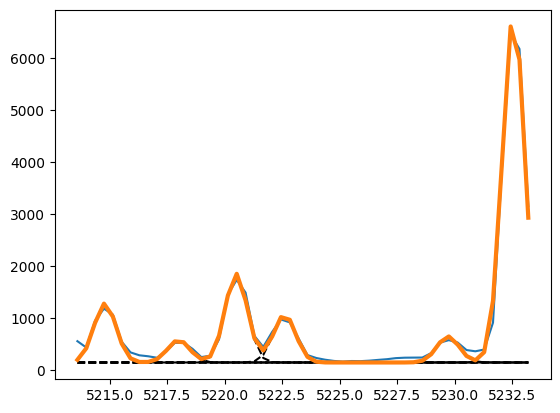

In [9]:
arc1_4959 = out_arc_4959.flatchain.arc1.mean()
arc2_4959 = out_arc_4959.flatchain.arc2.mean()
arc3_4959 = out_arc_4959.flatchain.arc3.mean()
arc4_4959 = out_arc_4959.flatchain.arc4.mean()
arc5_4959 = out_arc_4959.flatchain.arc5.mean()
arc6_4959 = out_arc_4959.flatchain.arc6.mean()
sigma_arc_4959 = out_arc_4959.flatchain.sigma.mean()

plt.plot(x_arc_4959, y_arc_4959)

plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc1_4959, 5214.8, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc2_4959, 5218, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc3_4959, 5220.5, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc4_4959, 5222.6, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc5_4959, 5229.7, 0, sigma_arc_4959), ls='--', color='black')
plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc6_4959, 5232.55, 0, sigma_arc_4959), ls='--', color='black')

plt.plot(x_arc_4959, 150 + gaussian(x_arc_4959, arc1_4959, 5214.8, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc2_4959, 5218, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc3_4959, 5220.5, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc4_4959, 5222.6, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc5_4959, 5229.7, 0, sigma_arc_4959) \
         + gaussian(x_arc_4959, arc6_4959, 5232.55, 0, sigma_arc_4959), lw=3
)

### Line fitting

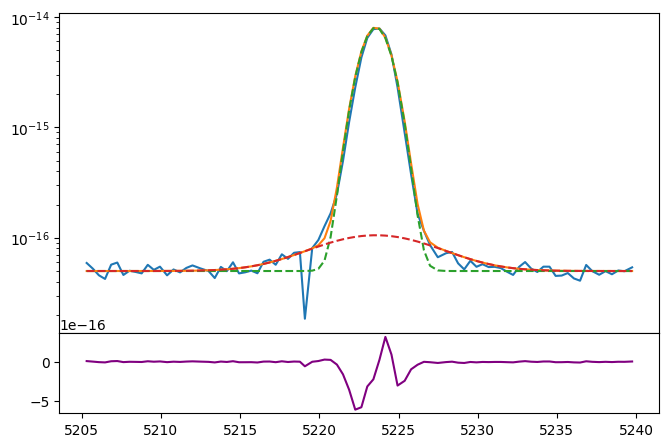

In [10]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4959.wavelength, oiii_4959.flux)
bkg = 5e-17

oiiib_nar = gaussian(oiii_4959.wavelength, 1800e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=0.9)
oiiib_brd = gaussian(oiii_4959.wavelength, 50e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=3.6)

ax.plot(oiii_4959.wavelength, bkg + oiiib_nar + oiiib_brd)
ax.plot(oiii_4959.wavelength, bkg + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_nar - oiiib_brd, color='purple')
ax.set_yscale('log')

In [11]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal])
params_oiii_4959.add('z_brd', value=z_BN[igal])
params_oiii_4959.add('sigma_nar', value=0.9, min=0.)
params_oiii_4959.add('sigma_brd', value=3.6, min=0.)
params_oiii_4959.add('Oiiib_nar', value=1800e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=50e-17, min=0.)
params_oiii_4959.add('bkg', value=5e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [12]:
np.random.seed(23)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 144.14it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [104.44659941  73.97470876 160.37010729 193.5692157  174.05077999
 216.38494294  73.21055107]


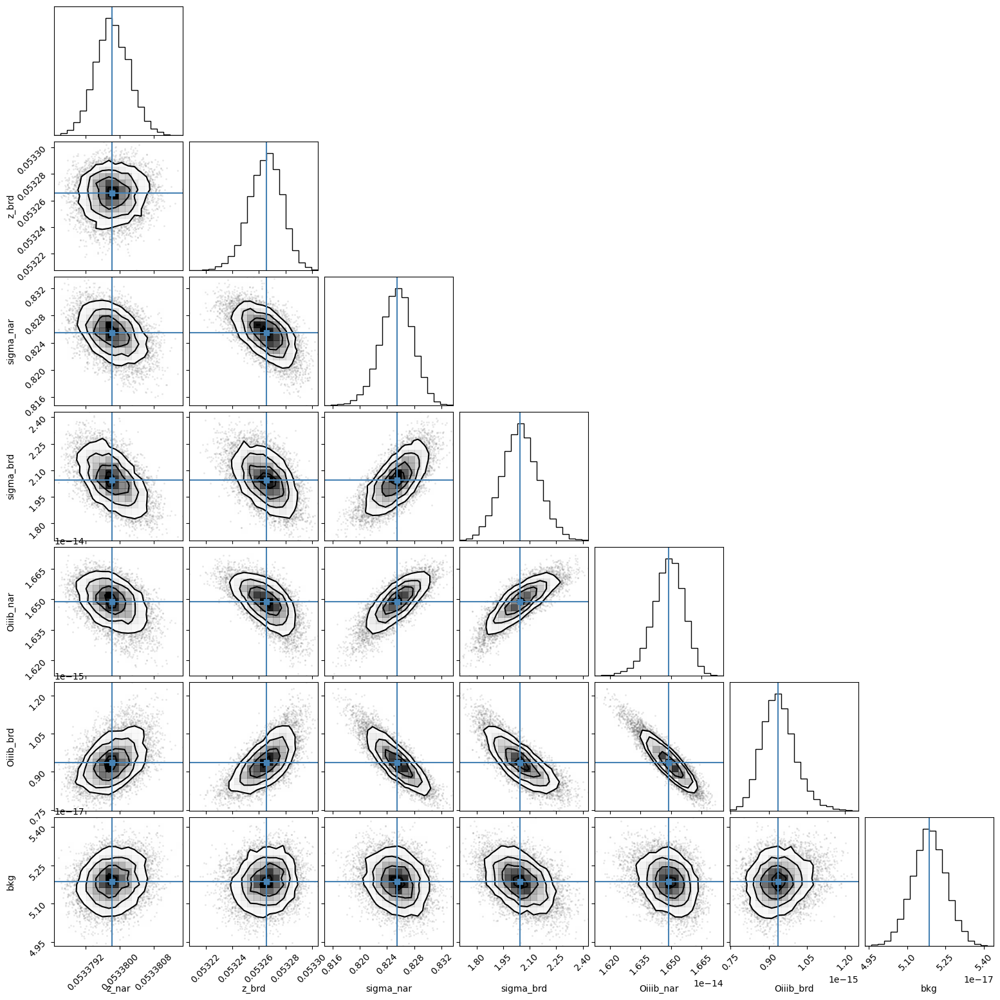

In [13]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [14]:
out_oiii_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05337982,3.9951e-07,(0.00%),0.05337,-inf,inf,True
z_brd,0.05326553,1.2258e-05,(0.02%),0.05337,-inf,inf,True
sigma_nar,0.82545829,0.00233624,(0.28%),0.9,0.00000000,inf,True
sigma_brd,2.04592291,0.10332853,(5.05%),3.6,0.00000000,inf,True
Oiiib_nar,1.6490e-14,7.4749e-17,(0.45%),1.8e-14,0.00000000,inf,True
Oiiib_brd,9.3602e-16,6.4326e-17,(6.87%),5e-16,0.00000000,inf,True
bkg,5.1865e-17,6.5924e-19,(1.27%),5e-17,0.00000000,inf,True


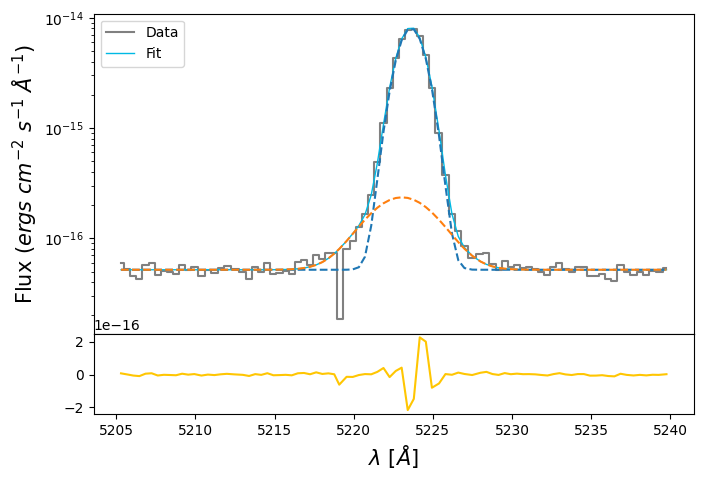

In [15]:
oiiib_nar_flux = out_oiii_4959.flatchain.Oiiib_nar.mean()
oiiib_nar_std = out_oiii_4959.flatchain.Oiiib_nar.std()

oiiib_brd_flux = out_oiii_4959.flatchain.Oiiib_brd.mean()
oiiib_brd_std = out_oiii_4959.flatchain.Oiiib_brd.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_nar_oiii_4959 = out_oiii_4959.flatchain.z_nar.mean()
z_nar_oiii_4959_std = out_oiii_4959.flatchain.z_nar.std()

z_brd_oiii_4959 = out_oiii_4959.flatchain.z_brd.mean()
z_brd_oiii_4959_std = out_oiii_4959.flatchain.z_brd.std()

sigma_nar_oiii_4959 = out_oiii_4959.flatchain.sigma_nar.mean()
sigma_nar_oiii_4959_std = out_oiii_4959.flatchain.sigma_nar.std()

sigma_brd_oiii_4959 = out_oiii_4959.flatchain.sigma_brd.mean()
sigma_brd_oiii_4959_std = out_oiii_4959.flatchain.sigma_brd.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [16]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_nar_intrinsic = upy.sqrt((ufloat(sigma_nar_oiii_4959, sigma_nar_oiii_4959_std)**2) - (sigma_arc_4959**2))
sigma_brd_intrinsic = upy.sqrt((ufloat(sigma_brd_oiii_4959, sigma_brd_oiii_4959_std)**2) - (sigma_arc_4959**2)) 

In [17]:
# EW
EW_OIII_4959_nar = ufloat(oiiib_nar_flux, oiiib_nar_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959_brd = ufloat(oiiib_brd_flux, oiiib_brd_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959 = (ufloat(oiiib_nar_flux, oiiib_nar_std) + ufloat(oiiib_brd_flux, oiiib_brd_std)) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959_nar = FWHM(sigma_nar_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))
FWHM_4959_brd = FWHM(sigma_brd_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std)))

# velocity shift
dV_4959 = dV(ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std),
             ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std))

# Ratio to fix velocity shifts between components
z_ratio = z_brd_oiii_4959 / z_nar_oiii_4959

# Ratio to distribute the flux between components in no detection
brd_to_nar = oiiib_brd_flux / oiiib_nar_flux

# Dispersion for the whole spectra
dLam = (np.max(wave) - np.min(wave)) / len(wave)

In [18]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))

Redshift of the narrow component: 0.0534+/-0.0000


In [19]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_nar_oiii_4959,
       'dV': dV_4959.nominal_value,
       'dV_err': dV_4959.std_dev,
       'FWHM_nar': FWHM_4959_nar.nominal_value,
       'FWHM_nar_err': FWHM_4959_nar.std_dev,
       'FWHM_brd': FWHM_4959_brd.nominal_value,
       'FWHM_brd_err': FWHM_4959_brd.std_dev
}

vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J0023, overwriting...
Done.


---------

# HeI 7065

### Arc lines

In [20]:
wave_cat['HeI7065']*(1 + z_BN[igal])

7442.259190299999

In [21]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7065 = [wave_cat['HeI7065']*(1 + z_BN[igal]) - 10, wave_cat['HeI7065']*(1 + z_BN[igal]) + 10]
mask_arc_7065 = (wcal_red[16].data['wave_soln'][0] >= wlims_7065[0]) & (wcal_red[16].data['wave_soln'][0] < wlims_7065[1])

# Arc spectra around the fitted line
x_arc_7065 = wcal_red[16].data['wave_soln'][0][mask_arc_7065]
y_arc_7065 = wcal_red[23].data[:, 7][mask_arc_7065]

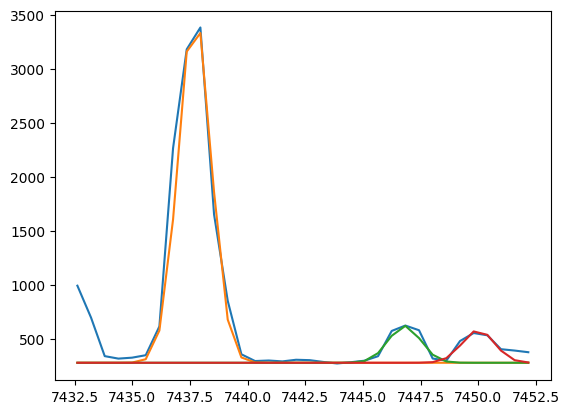

In [22]:
plt.plot(x_arc_7065, y_arc_7065)
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 5700, 7437.7, 0, 0.7))
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 600, 7446.8, 0, 0.7))
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 530, 7450.0, 0, 0.7))

100%|██████████████████████████████████████| 2500/2500 [00:22<00:00, 111.57it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [56.19097992 51.57473149 36.09821434 49.27706263]


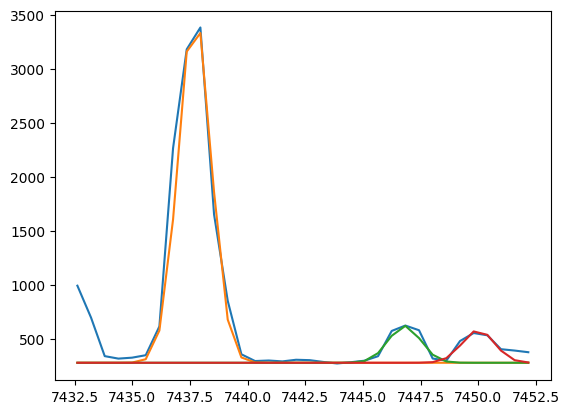

In [23]:
plt.plot(x_arc_7065, y_arc_7065)
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 5700, 7437.7, 0, 0.7))
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 600, 7446.8, 0, 0.7))
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, 530, 7450.0, 0, 0.7))

params_arc_7065 = Parameters()
params_arc_7065.add('z', value=0.0, vary=False)
params_arc_7065.add('mu1', value=7437.7, vary=False)
params_arc_7065.add('mu2', value=7446.8, vary=False)
params_arc_7065.add('mu3', value=7450.0, vary=False)
params_arc_7065.add('arc1', value=5700, min=0.)
params_arc_7065.add('arc2', value=600, min=0.)
params_arc_7065.add('arc3', value=530, min=0.)
params_arc_7065.add('sigma', value=0.7, min=0.)
params_arc_7065.add('bkg', value=280, vary=False)

def residual_arc_7065(params_arc_7065, x, data, uncertainty):
    
    z = params_arc_7065['z']
    mu1 = params_arc_7065['mu1']
    mu2 = params_arc_7065['mu2']
    mu3 = params_arc_7065['mu3']
    flux1 = params_arc_7065['arc1']
    flux2 = params_arc_7065['arc2']
    flux3 = params_arc_7065['arc3']
    sigma = params_arc_7065['sigma']
    bkg = params_arc_7065['bkg']
    
    x = x_arc_7065
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_7065) / 10

np.random.seed(23)
out_arc_7065 = minimize(residual_arc_7065, params_arc_7065, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [24]:
out_arc_7065.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7437.70000,,,7437.7,-inf,inf,False
mu2,7446.80000,,,7446.8,-inf,inf,False
mu3,7450.00000,,,7450.0,-inf,inf,False
arc1,6205.81928,15.2500521,(0.25%),5700,0.00000000,inf,True
arc2,680.490392,12.8446617,(1.89%),600,0.00000000,inf,True
arc3,563.667519,12.3553311,(2.19%),530,0.00000000,inf,True
sigma,0.76618841,0.00218802,(0.29%),0.7,0.00000000,inf,True
bkg,280.000000,,,280,-inf,inf,False


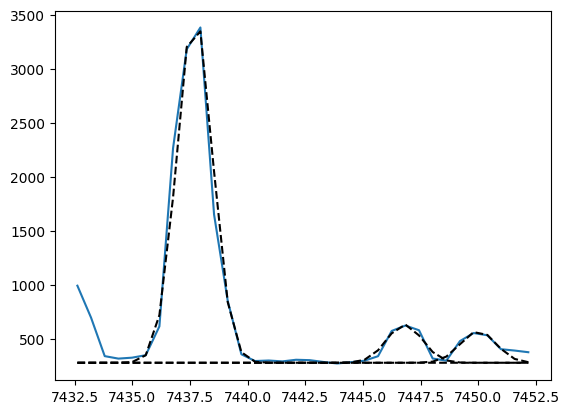

In [25]:
arc1_7065 = out_arc_7065.flatchain.arc1.mean()
arc2_7065 = out_arc_7065.flatchain.arc2.mean()
arc3_7065 = out_arc_7065.flatchain.arc3.mean()
sigma_arc_7065 = out_arc_7065.flatchain.sigma.mean()

plt.plot(x_arc_7065, y_arc_7065)

plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, arc1_7065, 7437.7, 0, sigma_arc_7065), ls='--', color='black')
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, arc2_7065, 7446.8, 0, sigma_arc_7065), ls='--', color='black')
plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, arc3_7065, 7450.0, 0, sigma_arc_7065), ls='--', color='black')

#plt.plot(x_arc_7065, 280 + gaussian(x_arc_7065, arc1_7065, 7437.7, 0, sigma_arc_7065) \
#         + gaussian(x_arc_7065, arc2_7065, 7446.8, 0, sigma_arc_7065),
#         + gaussian(x_arc_7065, arc3_7065, 7450.0, 0, sigma_arc_7065), lw=3
#)

### Line fitting

In [26]:
sigma_nar_7065 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7065**2))
sigma_brd_7065 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7065**2))

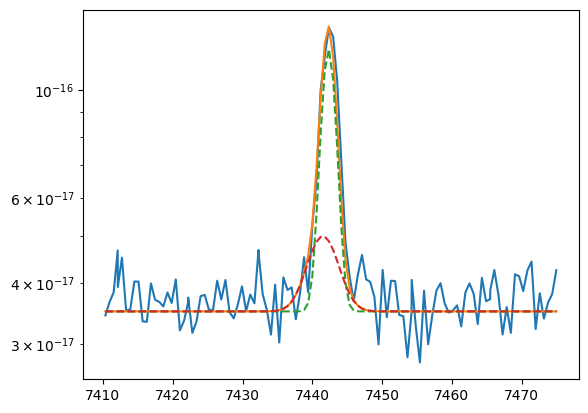

In [27]:
plt.plot(hei_7065.wavelength, hei_7065.flux)
bkg = 3.5e-17

hei7065_nar = gaussian(hei_7065.wavelength, 2.2e-16, wave_cat['HeI7065'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, 8e-17, wave_cat['HeI7065'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

plt.plot(hei_7065.wavelength, hei7065 + bkg)
plt.plot(hei_7065.wavelength, hei7065_nar + bkg, ls='--')
plt.plot(hei_7065.wavelength, hei7065_brd + bkg, ls='--')
plt.yscale('log')

In [28]:
params_7065 = Parameters()
params_7065.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_7065.add('z_ratio', value=z_ratio, vary=False)
params_7065.add('sigma_hei7065_nar', value=upy.nominal_values(sigma_nar_7065), vary=False)
params_7065.add('sigma_hei7065_brd', value=upy.nominal_values(sigma_brd_7065), vary=False)
params_7065.add('Hei7065_nar', value=2.2e-16, min=0.)
params_7065.add('Hei7065_brd', value=0.8e-16, min=0.)
params_7065.add('bkg', value=3.5e-17, min=0.)

def residual_hei7065(params_7065, x, data, uncertainty):
    
    z_nar = params_7065['z_nar']
    z_brd = params_7065['z_nar'] * params_7065['z_ratio']
    sigma_hei7065_nar = params_7065['sigma_hei7065_nar']
    sigma_hei7065_brd = params_7065['sigma_hei7065_brd']
    hei7065_nar_flux = params_7065['Hei7065_nar']
    hei7065_brd_flux = params_7065['Hei7065_brd']
    bkg = params_7065['bkg']
    
    x = hei_7065.wavelength
    model = gaussian(x, hei7065_nar_flux, wave_cat['HeI7065'], z_nar, sigma_hei7065_nar) + \
            gaussian(x, hei7065_brd_flux, wave_cat['HeI7065'], z_brd, sigma_hei7065_brd)
    return (model + bkg - hei_7065.flux) / hei_7065.noise

In [29]:
np.random.seed(23)
out_hei7065 = minimize(residual_hei7065, params_7065, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 116.72it/s]


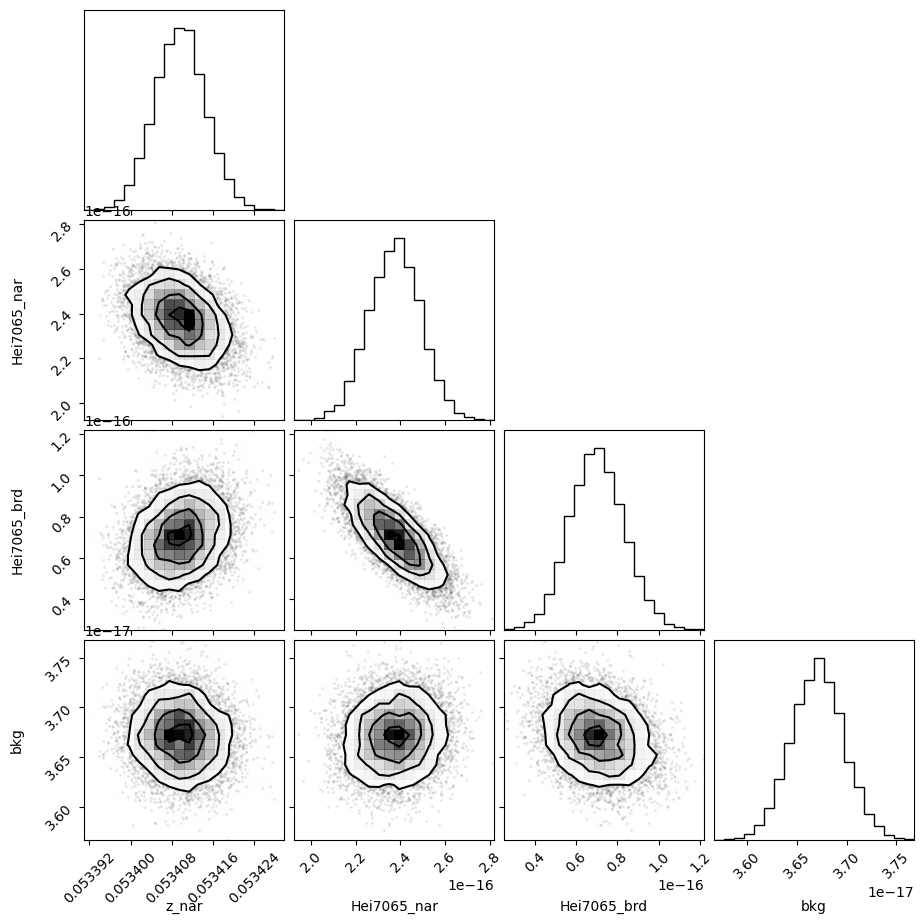

In [30]:
corner.corner(out_hei7065.flatchain, labels=out_hei7065.var_names);

In [31]:
out_hei7065.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05340964,4.8989e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_hei7065_nar,1.01822983,,,1.0182298298705428,-inf,inf,False
sigma_hei7065_brd,2.13219657,,,2.132196565226807,-inf,inf,False
Hei7065_nar,2.3765e-16,1.1477e-17,(4.83%),2.2e-16,0.00000000,inf,True
Hei7065_brd,6.9974e-17,1.3223e-17,(18.90%),8e-17,0.00000000,inf,True
bkg,3.6709e-17,2.6341e-19,(0.72%),3.5e-17,0.00000000,inf,True


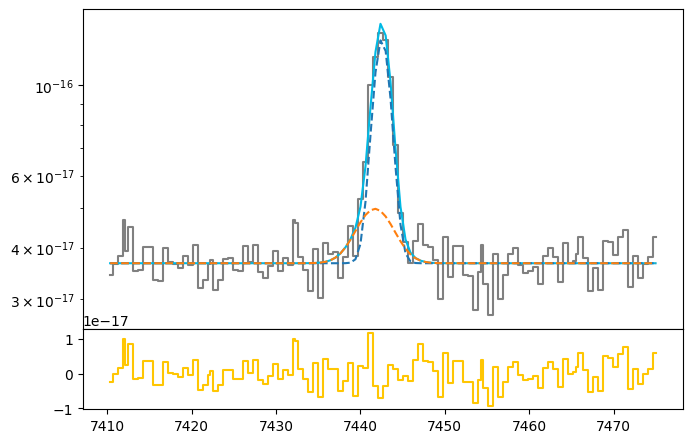

In [32]:
hei7065_nar_flux = out_hei7065.flatchain.Hei7065_nar.mean()
hei7065_nar_std = out_hei7065.flatchain.Hei7065_nar.std()

hei7065_brd_flux = out_hei7065.flatchain.Hei7065_brd.mean()
hei7065_brd_std = out_hei7065.flatchain.Hei7065_brd.std()

z_hei7065 = out_hei7065.flatchain.z_nar.mean()
z_hei7065_std = out_hei7065.flatchain.z_nar.std()

bkg_hei7065 = out_hei7065.flatchain.bkg.mean()
bkg_hei7065_std = out_hei7065.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_7065.wavelength, hei_7065.flux, color='gray', label='Data', where='mid')

hei7065_nar = gaussian(hei_7065.wavelength, hei7065_nar_flux, wave_cat['HeI7065'], z_hei7065, upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, hei7065_brd_flux, wave_cat['HeI7065'], z_hei7065 * z_ratio, upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065, color=c[0])
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_nar, ls='--')
ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_7065.wavelength, hei_7065.flux - bkg_hei7065 - hei7065, color=c[3], where='mid')

In [33]:
# EW
EW_hei7065_nar = ufloat(hei7065_nar_flux, hei7065_nar_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065_brd = ufloat(hei7065_brd_flux, hei7065_brd_std) / ufloat(bkg_hei7065, bkg_hei7065_std)
EW_hei7065 = (ufloat(hei7065_nar_flux, hei7065_nar_std) + ufloat(hei7065_brd_flux, hei7065_brd_std)) / ufloat(bkg_hei7065, bkg_hei7065_std)

# HeI 6678

### Arc lines

In [34]:
wave_cat['HeI6678']*(1 + z_BN[igal])

7034.56391887

In [35]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6678 = [wave_cat['HeI6678']*(1 + z_BN[igal]) - 10, wave_cat['HeI6678']*(1 + z_BN[igal]) + 10]
mask_arc_6678 = (wcal_red[14].data['wave_soln'][0] >= wlims_6678[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_6678[1])

# Arc spectra around the fitted line
x_arc_6678 = wcal_red[14].data['wave_soln'][0][mask_arc_6678]
y_arc_6678 = wcal_red[23].data[:, 6][mask_arc_6678]

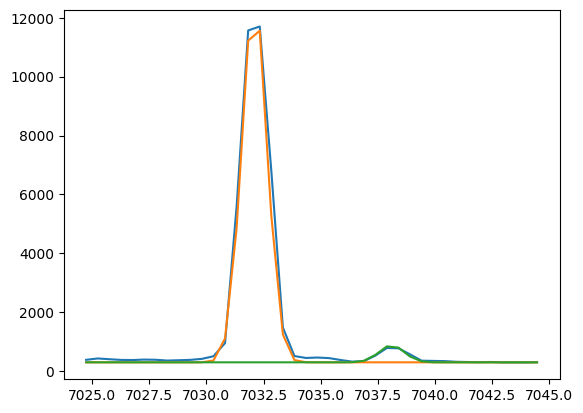

In [36]:
plt.plot(x_arc_6678, y_arc_6678)
plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, 17000, 7032.1, 0, 0.55))
plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, 800, 7038.1, 0, 0.55))

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 118.04it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [54.86201765 31.14508729 60.02173839]


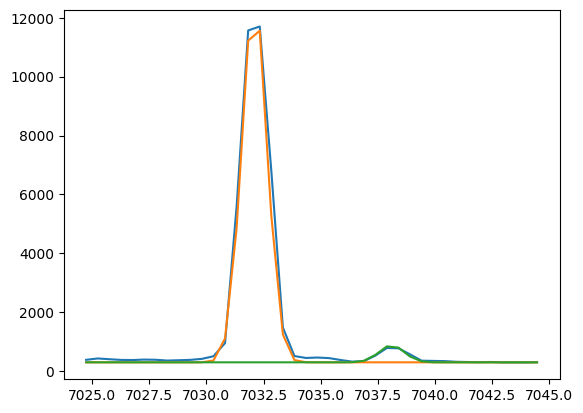

In [37]:
plt.plot(x_arc_6678, y_arc_6678)
plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, 17000, 7032.1, 0, 0.55))
plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, 800, 7038.1, 0, 0.55))

params_arc_6678 = Parameters()
params_arc_6678.add('z', value=0.0, vary=False)
params_arc_6678.add('mu1', value=7032.1, vary=False)
params_arc_6678.add('mu2', value=7038.1, vary=False)
params_arc_6678.add('arc1', value=17000, min=0.)
params_arc_6678.add('arc2', value=800, min=0.)
params_arc_6678.add('sigma', value=0.55, min=0.)
params_arc_6678.add('bkg', value=300, vary=False)

def residual_arc_6678(params_arc_6678, x, data, uncertainty):
    
    z = params_arc_6678['z']
    mu1 = params_arc_6678['mu1']
    mu2 = params_arc_6678['mu2']
    flux1 = params_arc_6678['arc1']
    flux2 = params_arc_6678['arc2']
    sigma = params_arc_6678['sigma']
    bkg = params_arc_6678['bkg']
    
    x = x_arc_6678
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_6678) / 10

np.random.seed(23)
out_arc_6678 = minimize(residual_arc_6678, params_arc_6678, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [38]:
out_arc_6678.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7032.10000,,,7032.1,-inf,inf,False
mu2,7038.10000,,,7038.1,-inf,inf,False
arc1,18765.7713,12.2731029,(0.07%),17000,0.00000000,inf,True
arc2,794.867192,10.4748309,(1.32%),800,0.00000000,inf,True
sigma,0.59843196,4.4622e-04,(0.07%),0.55,0.00000000,inf,True
bkg,300.000000,,,300,-inf,inf,False


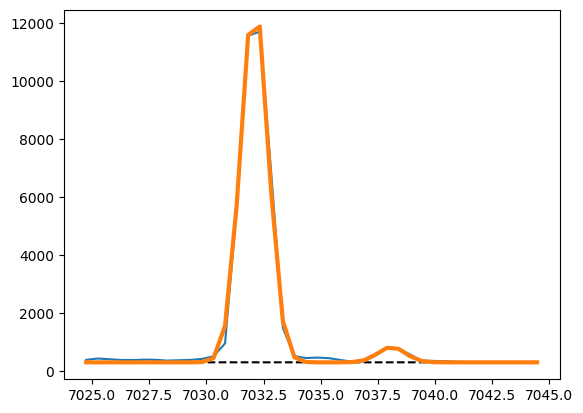

In [39]:
arc1_6678 = out_arc_6678.flatchain.arc1.mean()
arc2_6678 = out_arc_6678.flatchain.arc2.mean()
sigma_arc_6678 = out_arc_6678.flatchain.sigma.mean()

plt.plot(x_arc_6678, y_arc_6678)

plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, arc1_6678, 7032.1, 0, sigma_arc_6678), ls='--', color='black')
plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, arc2_6678, 7038.1, 0, sigma_arc_6678), ls='--', color='black')

plt.plot(x_arc_6678, 300 + gaussian(x_arc_6678, arc1_6678, 7032.1, 0, sigma_arc_6678) \
                         + gaussian(x_arc_6678, arc2_6678, 7038.1, 0, sigma_arc_6678), lw=3
)

### Line fitting

In [40]:
sigma_nar_6678 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6678**2))
sigma_brd_6678 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6678**2))

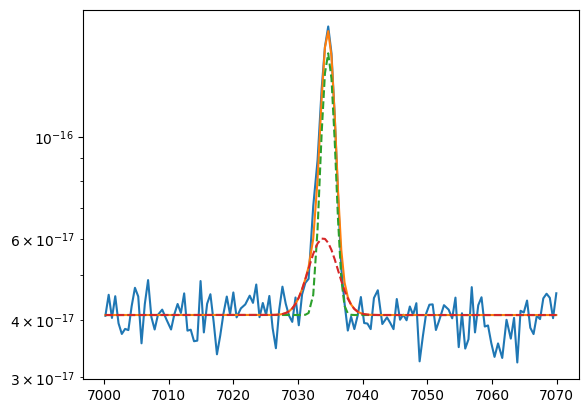

In [41]:
plt.plot(hei_6678.wavelength, hei_6678.flux)
bkg = 4.1e-17

hei6678_nar = gaussian(hei_6678.wavelength, 2.5e-16, wave_cat['HeI6678'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, 1e-16, wave_cat['HeI6678'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

plt.plot(hei_6678.wavelength, hei6678 + bkg)
plt.plot(hei_6678.wavelength, hei6678_nar + bkg, ls='--')
plt.plot(hei_6678.wavelength, hei6678_brd + bkg, ls='--')
plt.yscale('log')

In [42]:
params_6678 = Parameters()
params_6678.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_6678.add('z_ratio', value=z_ratio, vary=False)
params_6678.add('sigma_hei6678_nar', value=upy.nominal_values(sigma_nar_6678), vary=False)
params_6678.add('sigma_hei6678_brd', value=upy.nominal_values(sigma_brd_6678), vary=False)
params_6678.add('Hei6678_nar', value=2.5e-16, min=0.)
params_6678.add('Hei6678_brd', value=1.0e-16, min=0.)
params_6678.add('bkg', value=4.1e-17, min=0.)

def residual_hei6678(params_6678, x, data, uncertainty):
    
    z_nar = params_6678['z_nar']
    z_brd = params_6678['z_nar'] * params_6678['z_ratio']
    sigma_hei6678_nar = params_6678['sigma_hei6678_nar']
    sigma_hei6678_brd = params_6678['sigma_hei6678_brd']
    hei6678_nar_flux = params_6678['Hei6678_nar']
    hei6678_brd_flux = params_6678['Hei6678_brd']
    bkg = params_6678['bkg']
    
    x = hei_6678.wavelength
    model = gaussian(x, hei6678_nar_flux, wave_cat['HeI6678'], z_nar, sigma_hei6678_nar) + \
            gaussian(x, hei6678_brd_flux, wave_cat['HeI6678'], z_brd, sigma_hei6678_brd)
    return (model + bkg - hei_6678.flux) / hei_6678.noise

In [43]:
np.random.seed(23)
out_hei6678 = minimize(residual_hei6678, params_6678, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:23<00:00, 104.32it/s]


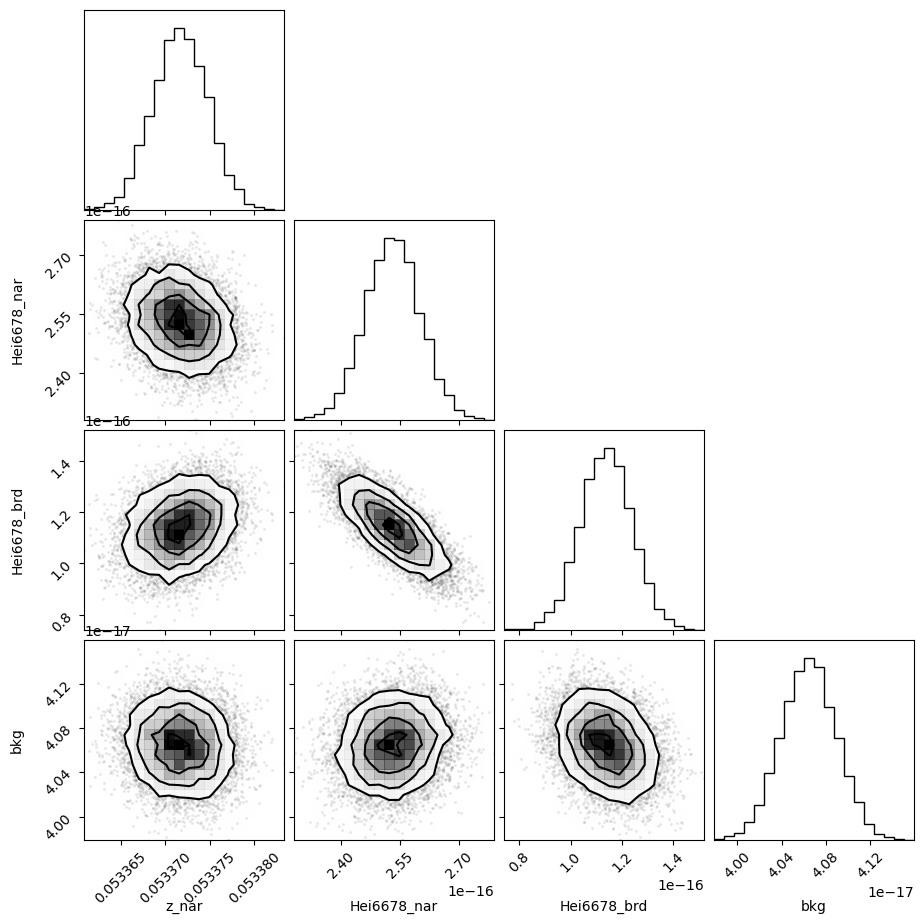

In [44]:
corner.corner(out_hei6678.flatchain, labels=out_hei6678.var_names);

In [45]:
out_hei6678.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05337172,3.0852e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_hei6678_nar,0.89879526,,,0.8987952589987469,-inf,inf,False
sigma_hei6678_brd,2.07781210,,,2.0778121002452132,-inf,inf,False
Hei6678_nar,2.5319e-16,6.9896e-18,(2.76%),2.5e-16,0.00000000,inf,True
Hei6678_brd,1.1399e-16,1.0047e-17,(8.81%),1e-16,0.00000000,inf,True
bkg,4.0648e-17,2.5090e-19,(0.62%),4.1e-17,0.00000000,inf,True


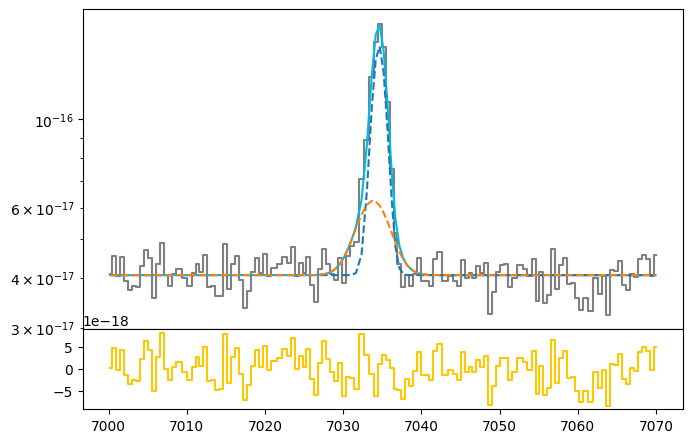

In [46]:
hei6678_nar_flux = out_hei6678.flatchain.Hei6678_nar.mean()
hei6678_nar_std = out_hei6678.flatchain.Hei6678_nar.std()

hei6678_brd_flux = out_hei6678.flatchain.Hei6678_brd.mean()
hei6678_brd_std = out_hei6678.flatchain.Hei6678_brd.std()

z_hei6678 = out_hei6678.flatchain.z_nar.mean()
z_hei6678_std = out_hei6678.flatchain.z_nar.std()

bkg_hei6678 = out_hei6678.flatchain.bkg.mean()
bkg_hei6678_std = out_hei6678.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_6678.wavelength, hei_6678.flux, color='gray', label='Data', where='mid')

hei6678_nar = gaussian(hei_6678.wavelength, hei6678_nar_flux, wave_cat['HeI6678'], z_hei6678, upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, hei6678_brd_flux, wave_cat['HeI6678'], z_hei6678 * z_ratio, upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678, color=c[0])
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_nar, ls='--')
ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_6678.wavelength, hei_6678.flux - bkg_hei6678 - hei6678, color=c[3], where='mid')

In [47]:
# EW
EW_hei6678_nar = ufloat(hei6678_nar_flux, hei6678_nar_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678_brd = ufloat(hei6678_brd_flux, hei6678_brd_std) / ufloat(bkg_hei6678, bkg_hei6678_std)
EW_hei6678 = (ufloat(hei6678_nar_flux, hei6678_nar_std) + ufloat(hei6678_brd_flux, hei6678_brd_std)) / ufloat(bkg_hei6678, bkg_hei6678_std)

# HeI 5875

### Arc lines

In [48]:
wave_cat['HeI5875']*(1 + z_BN[igal])

6189.202892769999

In [49]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5875 = [wave_cat['HeI5875']*(1 + z_BN[igal]) - 10, wave_cat['HeI5875']*(1 + z_BN[igal]) + 10]
mask_arc_5875 = (wcal_red[12].data['wave_soln'][0] >= wlims_5875[0]) & (wcal_red[12].data['wave_soln'][0] < wlims_5875[1])

# Arc spectra around the fitted line
x_arc_5875 = wcal_red[12].data['wave_soln'][0][mask_arc_5875]
y_arc_5875 = wcal_red[23].data[:, 5][mask_arc_5875]

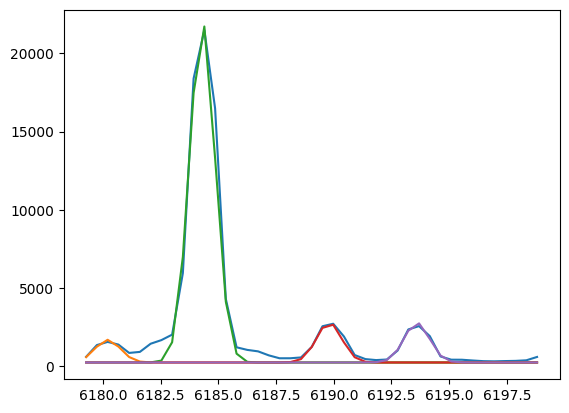

In [50]:
plt.plot(x_arc_5875, y_arc_5875)
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 2000, 6180.2, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 30000, 6184.3, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 3500, 6189.8, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 3500, 6193.6, 0, 0.55))

100%|███████████████████████████████████████| 2500/2500 [00:35<00:00, 69.84it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [42.15448472 54.2866179  91.71484899 50.15040948 53.59772332]


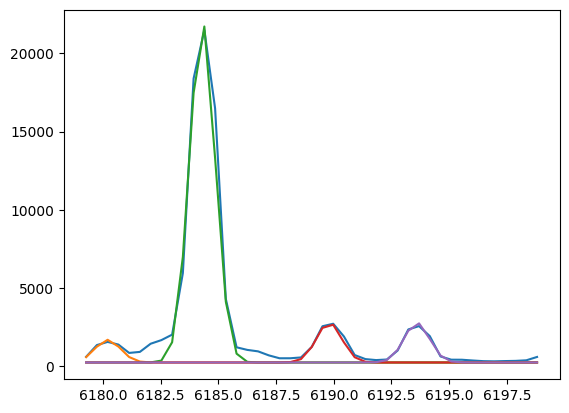

In [51]:
plt.plot(x_arc_5875, y_arc_5875)
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 2000, 6180.2, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 30000, 6184.3, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 3500, 6189.8, 0, 0.55))
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, 3500, 6193.6, 0, 0.55))

params_arc_5875 = Parameters()
params_arc_5875.add('z', value=0.0, vary=False)
params_arc_5875.add('mu1', value=6180.2, vary=False)
params_arc_5875.add('mu2', value=6184.3, vary=False)
params_arc_5875.add('mu3', value=6189.8, vary=False)
params_arc_5875.add('mu4', value=6193.6, vary=False)
params_arc_5875.add('arc1', value=2000, min=0.)
params_arc_5875.add('arc2', value=30000, min=0.)
params_arc_5875.add('arc3', value=3500, min=0.)
params_arc_5875.add('arc4', value=3500, min=0.)
params_arc_5875.add('sigma', value=0.55, min=0.)
params_arc_5875.add('bkg', value=240, vary=False)

def residual_arc_5875(params_arc_5875, x, data, uncertainty):
    
    z = params_arc_5875['z']
    mu1 = params_arc_5875['mu1']
    mu2 = params_arc_5875['mu2']
    mu3 = params_arc_5875['mu3']
    mu4 = params_arc_5875['mu4']
    flux1 = params_arc_5875['arc1']
    flux2 = params_arc_5875['arc2']
    flux3 = params_arc_5875['arc3']
    flux4 = params_arc_5875['arc4']
    sigma = params_arc_5875['sigma']
    bkg = params_arc_5875['bkg']
    
    x = x_arc_5875
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_5875) / 10


np.random.seed(23)
out_arc_5875 = minimize(residual_arc_5875, params_arc_5875, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [52]:
out_arc_5875.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,6180.20000,,,6180.2,-inf,inf,False
mu2,6184.30000,,,6184.3,-inf,inf,False
mu3,6189.80000,,,6189.8,-inf,inf,False
mu4,6193.60000,,,6193.6,-inf,inf,False
arc1,2132.21834,9.91834838,(0.47%),2000,0.00000000,inf,True
arc2,32045.9724,11.7285917,(0.04%),30000,0.00000000,inf,True
arc3,3824.55039,9.63724468,(0.25%),3500,0.00000000,inf,True
arc4,3556.22477,9.77571862,(0.27%),3500,0.00000000,inf,True
sigma,0.57150107,2.3618e-04,(0.04%),0.55,0.00000000,inf,True


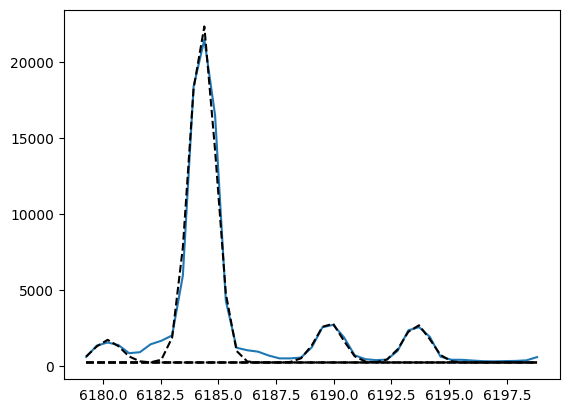

In [53]:
arc1_5875 = out_arc_5875.flatchain.arc1.mean()
arc2_5875 = out_arc_5875.flatchain.arc2.mean()
arc3_5875 = out_arc_5875.flatchain.arc3.mean()
arc4_5875 = out_arc_5875.flatchain.arc4.mean()
sigma_arc_5875 = out_arc_5875.flatchain.sigma.mean()

plt.plot(x_arc_5875, y_arc_5875)

plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc1_5875, 6180.2, 0, sigma_arc_5875), ls='--', color='black')
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc2_5875, 6184.3, 0, sigma_arc_5875), ls='--', color='black')
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc3_5875, 6189.8, 0, sigma_arc_5875), ls='--', color='black')
plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc4_5875, 6193.6, 0, sigma_arc_5875), ls='--', color='black')

#plt.plot(x_arc_5875, 240 + gaussian(x_arc_5875, arc1_5875, 6180.2, 0, sigma_arc_5875) \
#                         + gaussian(x_arc_5875, arc2_5875, 6184.3, 0, sigma_arc_5875),
#                         + gaussian(x_arc_5875, arc3_5875, 6189.8, 0, sigma_arc_5875),
#                         + gaussian(x_arc_5875, arc4_5875, 6193.6, 0, sigma_arc_5875), lw=3
#)

### Line fitting

In [54]:
sigma_nar_5875 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5875**2))
sigma_brd_5875 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5875**2))

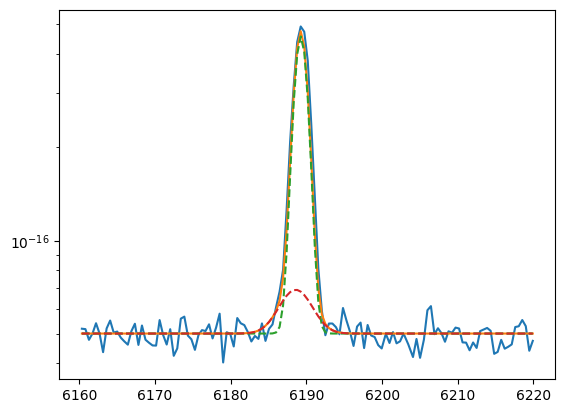

In [55]:
plt.plot(hei_5875.wavelength, hei_5875.flux)
bkg = 5e-17

hei5875_nar = gaussian(hei_5875.wavelength, 9e-16, wave_cat['HeI5875'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, 1e-16, wave_cat['HeI5875'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

plt.plot(hei_5875.wavelength, hei5875 + bkg)
plt.plot(hei_5875.wavelength, hei5875_nar + bkg, ls='--')
plt.plot(hei_5875.wavelength, hei5875_brd + bkg, ls='--')
plt.yscale('log')

In [56]:
params_5875 = Parameters()
params_5875.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_5875.add('z_ratio', value=z_ratio, vary=False)
params_5875.add('sigma_hei5875_nar', value=upy.nominal_values(sigma_nar_5875), vary=False)
params_5875.add('sigma_hei5875_brd', value=upy.nominal_values(sigma_brd_5875), vary=False)
params_5875.add('Hei5875_nar', value=9e-16, min=0.)
params_5875.add('Hei5875_brd', value=1e-16, min=0.)
params_5875.add('bkg', value=5e-17, min=0.)

def residual_hei5875(params_5875, x, data, uncertainty):
    
    z_nar = params_5875['z_nar']
    z_brd = params_5875['z_nar'] * params_5875['z_ratio']
    sigma_hei5875_nar = params_5875['sigma_hei5875_nar']
    sigma_hei5875_brd = params_5875['sigma_hei5875_brd']
    hei5875_nar_flux = params_5875['Hei5875_nar']
    hei5875_brd_flux = params_5875['Hei5875_brd']
    bkg = params_5875['bkg']
    
    x = hei_5875.wavelength
    model = gaussian(x, hei5875_nar_flux, wave_cat['HeI5875'], z_nar, sigma_hei5875_nar) + \
            gaussian(x, hei5875_brd_flux, wave_cat['HeI5875'], z_brd, sigma_hei5875_brd)
    return (model + bkg - hei_5875.flux) / hei_5875.noise

In [57]:
np.random.seed(23)
out_hei5875 = minimize(residual_hei5875, params_5875, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:33<00:00, 74.20it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [40.1942235  24.3181317  98.41526028 55.83989433]


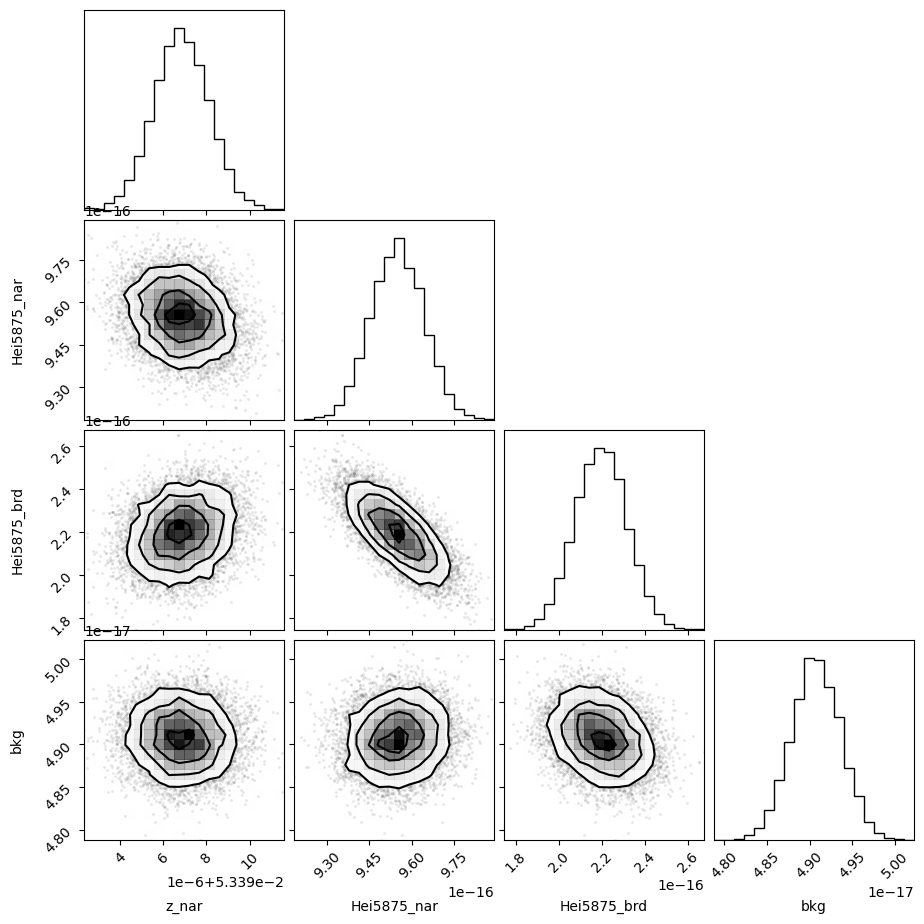

In [58]:
corner.corner(out_hei5875.flatchain, labels=out_hei5875.var_names);

In [59]:
out_hei5875.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05339684,1.2641e-06,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_hei5875_nar,0.88109419,,,0.8810941896221449,-inf,inf,False
sigma_hei5875_brd,2.07021670,,,2.0702166981532883,-inf,inf,False
Hei5875_nar,9.5492e-16,9.3209e-18,(0.98%),9e-16,0.00000000,inf,True
Hei5875_brd,2.1971e-16,1.2009e-17,(5.47%),1e-16,0.00000000,inf,True
bkg,4.9074e-17,2.8672e-19,(0.58%),5e-17,0.00000000,inf,True


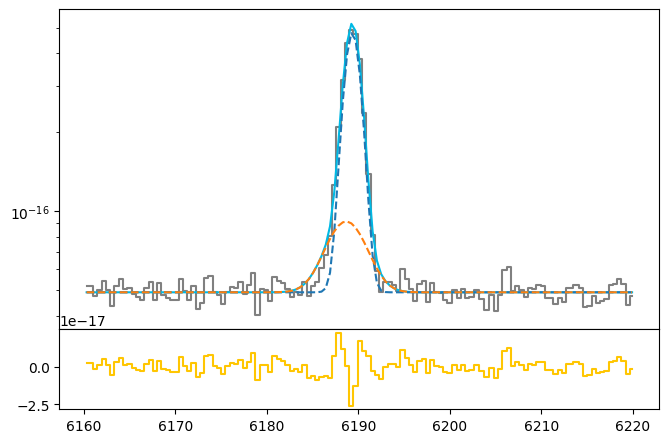

In [60]:
hei5875_nar_flux = out_hei5875.flatchain.Hei5875_nar.mean()
hei5875_nar_std = out_hei5875.flatchain.Hei5875_nar.std()

hei5875_brd_flux = out_hei5875.flatchain.Hei5875_brd.mean()
hei5875_brd_std = out_hei5875.flatchain.Hei5875_brd.std()

z_hei5875 = out_hei5875.flatchain.z_nar.mean()
z_hei5875_std = out_hei5875.flatchain.z_nar.std()

bkg_hei5875 = out_hei5875.flatchain.bkg.mean()
bkg_hei5875_std = out_hei5875.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_5875.wavelength, hei_5875.flux, color='gray', label='Data', where='mid')

hei5875_nar = gaussian(hei_5875.wavelength, hei5875_nar_flux, wave_cat['HeI5875'], z_hei5875, upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, hei5875_brd_flux, wave_cat['HeI5875'], z_hei5875 * z_ratio, upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875, color=c[0])
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_nar, ls='--')
ax.plot(hei_5875.wavelength, bkg_hei5875 + hei5875_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_5875.wavelength, hei_5875.flux - bkg_hei5875 - hei5875, color=c[3], where='mid')

In [61]:
# EW
EW_hei5875_nar = ufloat(hei5875_nar_flux, hei5875_nar_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875_brd = ufloat(hei5875_brd_flux, hei5875_brd_std) / ufloat(bkg_hei5875, bkg_hei5875_std)
EW_hei5875 = (ufloat(hei5875_nar_flux, hei5875_nar_std) + ufloat(hei5875_brd_flux, hei5875_brd_std)) / ufloat(bkg_hei5875, bkg_hei5875_std)

# HeI 4471

### Arc lines

In [62]:
wave_cat['HeI4471']*(1 + z_BN[igal])

4710.123098274

In [63]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4471 = [wave_cat['HeI4471']*(1 + z_BN[igal]) - 10, wave_cat['HeI4471']*(1 + z_BN[igal]) + 10]
mask_arc_4471 = (wcal_blue[10].data['wave_soln'][0] >= wlims_4471[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_4471[1])

# Arc spectra around the fitted line
x_arc_4471 = wcal_blue[10].data['wave_soln'][0][mask_arc_4471]
y_arc_4471 = wcal_blue[25].data[:, 4][mask_arc_4471]

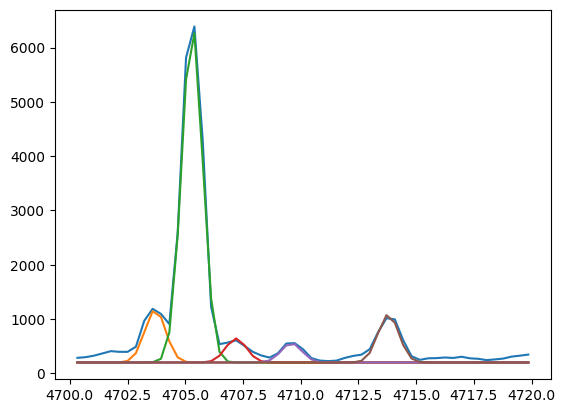

In [64]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 1100, 4703.7, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 7000, 4705.3, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 500, 4707.2, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 400, 4709.6, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 1000, 4713.8, 0, 0.45))

100%|███████████████████████████████████████| 2500/2500 [00:58<00:00, 42.74it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [69.99087742 55.66340778 63.57890672 94.32913011 65.77656888 32.15101786]


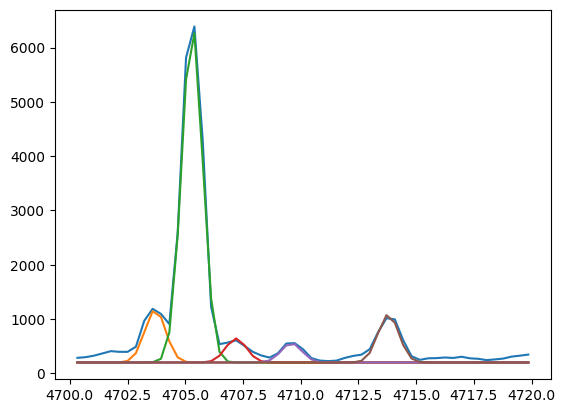

In [65]:
plt.plot(x_arc_4471, y_arc_4471)
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 1100, 4703.7, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 7000, 4705.3, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 500, 4707.2, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 400, 4709.6, 0, 0.45))
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, 1000, 4713.8, 0, 0.45))

params_arc_4471 = Parameters()
params_arc_4471.add('z', value=0.0, vary=False)
params_arc_4471.add('mu1', value=4703.7, vary=False)
params_arc_4471.add('mu2', value=4705.3, vary=False)
params_arc_4471.add('mu3', value=4707.2, vary=False)
params_arc_4471.add('mu4', value=4709.6, vary=False)
params_arc_4471.add('mu5', value=4713.8, vary=False)
params_arc_4471.add('arc1', value=1100, min=0.)
params_arc_4471.add('arc2', value=7000, min=0.)
params_arc_4471.add('arc3', value=500, min=0.)
params_arc_4471.add('arc4', value=400, min=0.)
params_arc_4471.add('arc5', value=1000, min=0.)
params_arc_4471.add('sigma', value=0.45, min=0.)
params_arc_4471.add('bkg', value=200, vary=False)

def residual_arc_4471(params_arc_4471, x, data, uncertainty):
    
    z = params_arc_4471['z']
    mu1 = params_arc_4471['mu1']
    mu2 = params_arc_4471['mu2']
    mu3 = params_arc_4471['mu3']
    mu4 = params_arc_4471['mu4']
    mu5 = params_arc_4471['mu5']
    flux1 = params_arc_4471['arc1']
    flux2 = params_arc_4471['arc2']
    flux3 = params_arc_4471['arc3']
    flux4 = params_arc_4471['arc4']
    flux5 = params_arc_4471['arc5']
    sigma = params_arc_4471['sigma']
    bkg = params_arc_4471['bkg']
    
    x = x_arc_4471
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_4471) / 10


np.random.seed(23)
out_arc_4471 = minimize(residual_arc_4471, params_arc_4471, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [66]:
out_arc_4471.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4703.70000,,,4703.7,-inf,inf,False
mu2,4705.30000,,,4705.3,-inf,inf,False
mu3,4707.20000,,,4707.2,-inf,inf,False
mu4,4709.60000,,,4709.6,-inf,inf,False
mu5,4713.80000,,,4713.8,-inf,inf,False
arc1,1135.66176,7.54865566,(0.66%),1100,0.00000000,inf,True
arc2,7240.31133,8.68054169,(0.12%),7000,0.00000000,inf,True
arc3,496.583184,7.72014887,(1.55%),500,0.00000000,inf,True
arc4,443.688845,7.53954503,(1.70%),400,0.00000000,inf,True


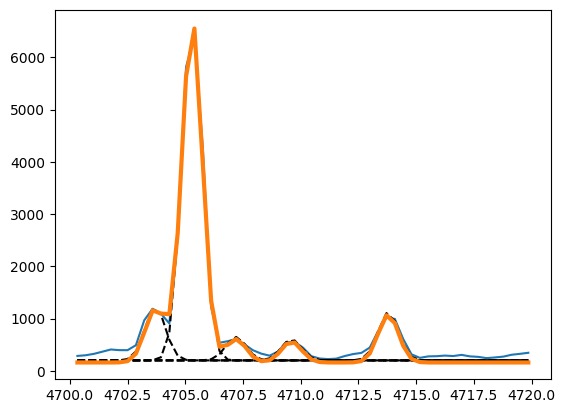

In [67]:
arc1_4471 = out_arc_4471.flatchain.arc1.mean()
arc2_4471 = out_arc_4471.flatchain.arc2.mean()
arc3_4471 = out_arc_4471.flatchain.arc3.mean()
arc4_4471 = out_arc_4471.flatchain.arc4.mean()
arc5_4471 = out_arc_4471.flatchain.arc5.mean()
sigma_arc_4471 = out_arc_4471.flatchain.sigma.mean()

plt.plot(x_arc_4471, y_arc_4471)

plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, arc1_4471, 4703.7, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, arc2_4471, 4705.3, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, arc3_4471, 4707.2, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, arc4_4471, 4709.6, 0, sigma_arc_4471), ls='--', color='black')
plt.plot(x_arc_4471, 200 + gaussian(x_arc_4471, arc5_4471, 4713.8, 0, sigma_arc_4471), ls='--', color='black')

plt.plot(x_arc_4471, 160 + gaussian(x_arc_4471, arc1_4471, 4703.7, 0, sigma_arc_4471) \
                         + gaussian(x_arc_4471, arc2_4471, 4705.3, 0, sigma_arc_4471) \
                         + gaussian(x_arc_4471, arc3_4471, 4707.2, 0, sigma_arc_4471) \
                         + gaussian(x_arc_4471, arc4_4471, 4709.6, 0, sigma_arc_4471) \
                         + gaussian(x_arc_4471, arc5_4471, 4713.8, 0, sigma_arc_4471), lw=3
)

### Line fitting

In [68]:
sigma_nar_4471 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4471**2))
sigma_brd_4471 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4471**2))

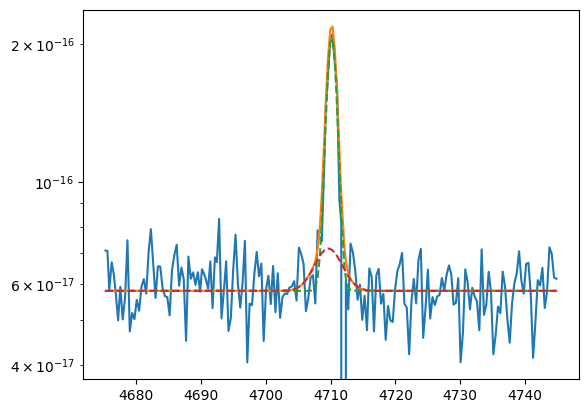

In [69]:
plt.plot(hei_4471.wavelength, hei_4471.flux)
bkg = 5.8e-17

hei4471_nar = gaussian(hei_4471.wavelength, 3e-16, wave_cat['HeI4471'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, 7e-17, wave_cat['HeI4471'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

plt.plot(hei_4471.wavelength, hei4471 + bkg)
plt.plot(hei_4471.wavelength, hei4471_nar + bkg, ls='--')
plt.plot(hei_4471.wavelength, hei4471_brd + bkg, ls='--')
plt.yscale('log')

In [70]:
params_4471 = Parameters()
params_4471.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4471.add('z_ratio', value=z_ratio, vary=False)
params_4471.add('sigma_hei4471_nar', value=upy.nominal_values(sigma_nar_4471), vary=False)
params_4471.add('sigma_hei4471_brd', value=upy.nominal_values(sigma_brd_4471), vary=False)
params_4471.add('Hei4471_nar', value=3e-16, min=0.)
params_4471.add('Hei4471_brd', value=7e-17, min=0.)
params_4471.add('bkg', value=5.8e-17, min=0.)

def residual_hei4471(params_4471, x, data, uncertainty):
    
    z_nar = params_4471['z_nar']
    z_brd = params_4471['z_nar'] * params_4471['z_ratio']
    sigma_hei4471_nar = params_4471['sigma_hei4471_nar']
    sigma_hei4471_brd = params_4471['sigma_hei4471_brd']
    hei4471_nar_flux = params_4471['Hei4471_nar']
    hei4471_brd_flux = params_4471['Hei4471_brd']
    bkg = params_4471['bkg']
    
    x = hei_4471.wavelength
    model = gaussian(x, hei4471_nar_flux, wave_cat['HeI4471'], z_nar, sigma_hei4471_nar) + \
            gaussian(x, hei4471_brd_flux, wave_cat['HeI4471'], z_brd, sigma_hei4471_brd)
    return (model + bkg - hei_4471.flux) / hei_4471.noise

In [71]:
np.random.seed(23)
out_hei4471 = minimize(residual_hei4471, params_4471, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:38<00:00, 65.70it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [41.56117955 42.38688693 58.39591254 43.89616392]


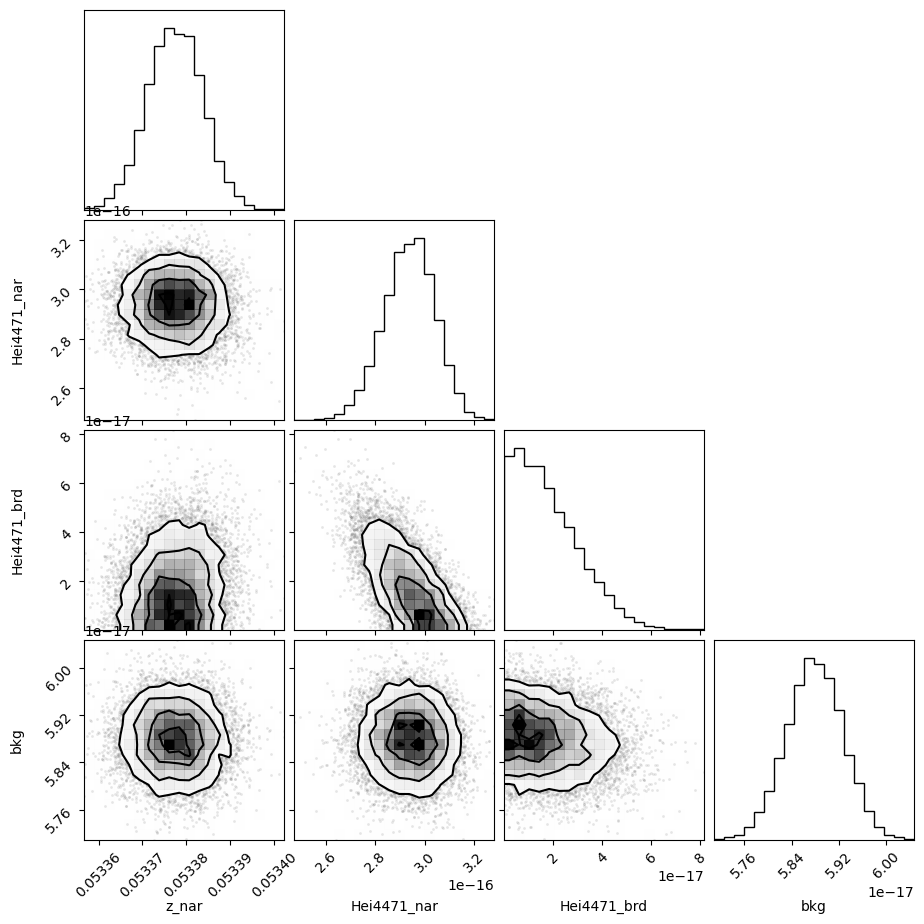

In [72]:
corner.corner(out_hei4471.flatchain, labels=out_hei4471.var_names);

In [73]:
out_hei4471.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05337741,6.2588e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_hei4471_nar,0.80274450,,,0.8027444965447741,-inf,inf,False
sigma_hei4471_brd,2.03810425,,,2.0381042498016932,-inf,inf,False
Hei4471_nar,2.9394e-16,1.0339e-17,(3.52%),3e-16,0.00000000,inf,True
Hei4471_brd,1.5781e-17,1.3498e-17,(85.54%),7e-17,0.00000000,inf,True
bkg,5.8793e-17,4.7578e-19,(0.81%),5.8e-17,0.00000000,inf,True


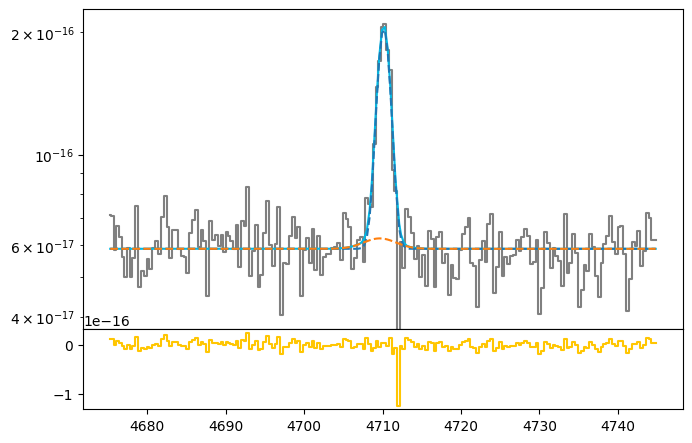

In [74]:
hei4471_nar_flux = out_hei4471.flatchain.Hei4471_nar.mean()
hei4471_nar_std = out_hei4471.flatchain.Hei4471_nar.std()

hei4471_brd_flux = out_hei4471.flatchain.Hei4471_brd.mean()
hei4471_brd_std = out_hei4471.flatchain.Hei4471_brd.std()

z_hei4471 = out_hei4471.flatchain.z_nar.mean()
z_hei4471_std = out_hei4471.flatchain.z_nar.std()

bkg_hei4471 = out_hei4471.flatchain.bkg.mean()
bkg_hei4471_std = out_hei4471.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_4471.wavelength, hei_4471.flux, color='gray', label='Data', where='mid')

hei4471_nar = gaussian(hei_4471.wavelength, hei4471_nar_flux, wave_cat['HeI4471'], z_hei4471, upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, hei4471_brd_flux, wave_cat['HeI4471'], z_hei4471 * z_ratio, upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471, color=c[0])
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_nar, ls='--')
ax.plot(hei_4471.wavelength, bkg_hei4471 + hei4471_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_4471.wavelength, hei_4471.flux - bkg_hei4471 - hei4471, color=c[3], where='mid')

In [75]:
# EW
EW_hei4471_nar = ufloat(hei4471_nar_flux, hei4471_nar_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471_brd = ufloat(hei4471_brd_flux, hei4471_brd_std) / ufloat(bkg_hei4471, bkg_hei4471_std)
EW_hei4471 = (ufloat(hei4471_nar_flux, hei4471_nar_std) + ufloat(hei4471_brd_flux, hei4471_brd_std)) / ufloat(bkg_hei4471, bkg_hei4471_std)

# HeII 4686

### Arc lines

In [76]:
wave_cat['HeII4685']*(1 + z_BN[igal])

4935.786342699999

In [77]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4685 = [wave_cat['HeII4685']*(1 + z_BN[igal]), wave_cat['HeII4685']*(1 + z_BN[igal]) + 10]
mask_arc_4685 = (wcal_blue[10].data['wave_soln'][0] >= wlims_4685[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_4685[1])

# Arc spectra around the fitted line
x_arc_4685 = wcal_blue[10].data['wave_soln'][0][mask_arc_4685]
y_arc_4685 = wcal_blue[25].data[:, 4][mask_arc_4685]

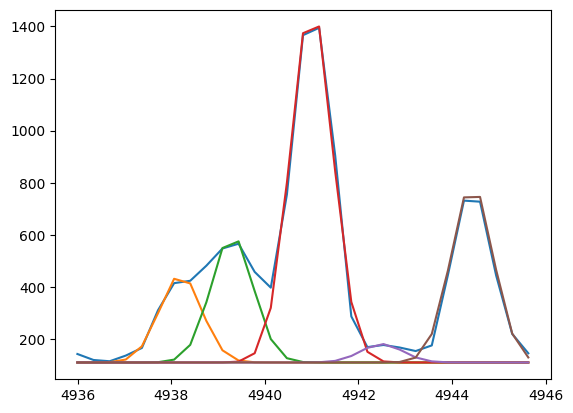

In [78]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 380, 4938.2, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 550, 4939.3, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 1550, 4941, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 80, 4942.5, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 770, 4944.43, 0, 0.45))

100%|███████████████████████████████████████| 2500/2500 [01:06<00:00, 37.72it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [64.96685226 58.60604828 56.96972537 69.59278619 55.59674049 55.17451973]


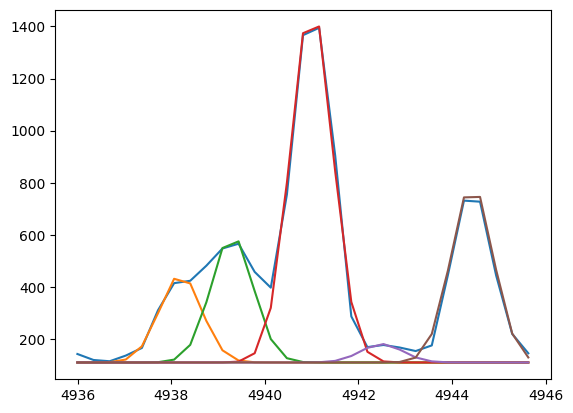

In [79]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 380, 4938.2, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 550, 4939.3, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 1550, 4941, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 80, 4942.5, 0, 0.45))
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, 770, 4944.43, 0, 0.45))

params_arc_4685 = Parameters()
params_arc_4685.add('z', value=0.0, vary=False)
params_arc_4685.add('mu1', value=4938.2, vary=False)
params_arc_4685.add('mu2', value=4939.3, vary=False)
params_arc_4685.add('mu3', value=4941, vary=False)
params_arc_4685.add('mu4', value=4942.5, vary=False)
params_arc_4685.add('mu5', value=4944.43, vary=False)
params_arc_4685.add('arc1', value=380, min=0.)
params_arc_4685.add('arc2', value=550, min=0.)
params_arc_4685.add('arc3', value=1550, min=0.)
params_arc_4685.add('arc4', value=80, min=0.)
params_arc_4685.add('arc5', value=770, min=0.)
params_arc_4685.add('sigma', value=0.45, min=0.)
params_arc_4685.add('bkg', value=110, vary=False)

def residual_arc_4685(params_arc_4685, x, data, uncertainty):
    
    z = params_arc_4685['z']
    mu1 = params_arc_4685['mu1']
    mu2 = params_arc_4685['mu2']
    mu3 = params_arc_4685['mu3']
    mu4 = params_arc_4685['mu4']
    mu5 = params_arc_4685['mu5']
    flux1 = params_arc_4685['arc1']
    flux2 = params_arc_4685['arc2']
    flux3 = params_arc_4685['arc3']
    flux4 = params_arc_4685['arc4']
    flux5 = params_arc_4685['arc5']
    sigma = params_arc_4685['sigma']
    bkg = params_arc_4685['bkg']
    
    x = x_arc_4685
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_4685) / 10

np.random.seed(23)
out_arc_4685 = minimize(residual_arc_4685, params_arc_4685, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [80]:
out_arc_4685.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4938.20000,,,4938.2,-inf,inf,False
mu2,4939.30000,,,4939.3,-inf,inf,False
mu3,4941.00000,,,4941,-inf,inf,False
mu4,4942.50000,,,4942.5,-inf,inf,False
mu5,4944.43000,,,4944.43,-inf,inf,False
arc1,340.079937,7.46483007,(2.20%),380,0.00000000,inf,True
arc2,527.353039,7.44774495,(1.41%),550,0.00000000,inf,True
arc3,1523.37861,8.32958147,(0.55%),1550,0.00000000,inf,True
arc4,57.4966755,7.42526055,(12.91%),80,0.00000000,inf,True


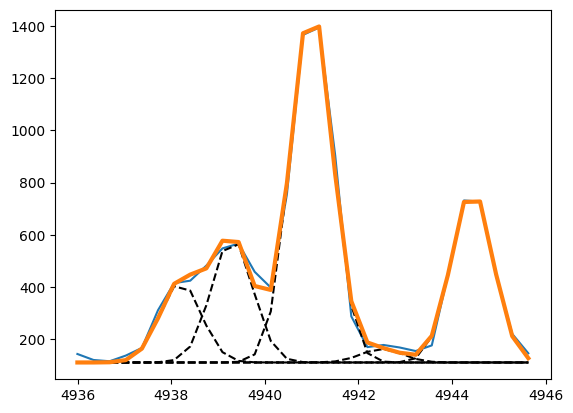

In [81]:
arc1_4685 = out_arc_4685.flatchain.arc1.mean()
arc2_4685 = out_arc_4685.flatchain.arc2.mean()
arc3_4685 = out_arc_4685.flatchain.arc3.mean()
arc4_4685 = out_arc_4685.flatchain.arc4.mean()
arc5_4685 = out_arc_4685.flatchain.arc5.mean()
sigma_arc_4685 = out_arc_4685.flatchain.sigma.mean()

plt.plot(x_arc_4685, y_arc_4685)

plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc1_4685, 4938.2, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc2_4685, 4939.3, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc3_4685,   4941, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc4_4685, 4942.5, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc5_4685, 4944.43, 0, sigma_arc_4685), ls='--', color='black')

plt.plot(x_arc_4685, 110 + gaussian(x_arc_4685, arc1_4685, 4938.2, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc2_4685, 4939.3, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc3_4685,   4941, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc4_4685, 4942.5, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc5_4685, 4944.43, 0, sigma_arc_4685), lw=3
)

### Line fitting

In [82]:
sigma_nar_4685 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4685**2))
sigma_brd_4685 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4685**2))

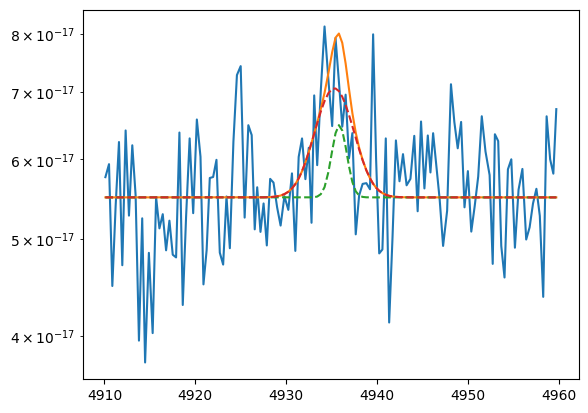

In [83]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 5.5e-17

heii4685_nar = gaussian(heii_4686.wavelength, 2e-17, wave_cat['HeII4685'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, 8e-17, wave_cat['HeII4685'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

plt.plot(heii_4686.wavelength, heii4685 + bkg)
plt.plot(heii_4686.wavelength, heii4685_nar + bkg, ls='--')
plt.plot(heii_4686.wavelength, heii4685_brd + bkg, ls='--')
plt.yscale('log')

In [84]:
params_4685 = Parameters()
params_4685.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4685.add('z_ratio', value=z_ratio, vary=False)
params_4685.add('sigma_heii4685_nar', value=upy.nominal_values(sigma_nar_4685), vary=False)
params_4685.add('sigma_heii4685_brd', value=upy.nominal_values(sigma_brd_4685), vary=False)
params_4685.add('Heii4685_nar', value=2e-17, min=0.)
params_4685.add('Heii4685_brd', value=8e-17, min=0.)
params_4685.add('bkg', value=5.5e-17, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_nar = params_4685['z_nar']
    z_brd = params_4685['z_nar'] * params_4685['z_ratio']
    sigma_heii4685_nar = params_4685['sigma_heii4685_nar']
    sigma_heii4685_brd = params_4685['sigma_heii4685_brd']
    heii4685_nar_flux = params_4685['Heii4685_nar']
    heii4685_brd_flux = params_4685['Heii4685_brd']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_nar_flux, wave_cat['HeII4685'], z_nar, sigma_heii4685_nar) + \
            gaussian(x, heii4685_brd_flux, wave_cat['HeII4685'], z_brd, sigma_heii4685_brd)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [85]:
np.random.seed(23)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:49<00:00, 50.35it/s]


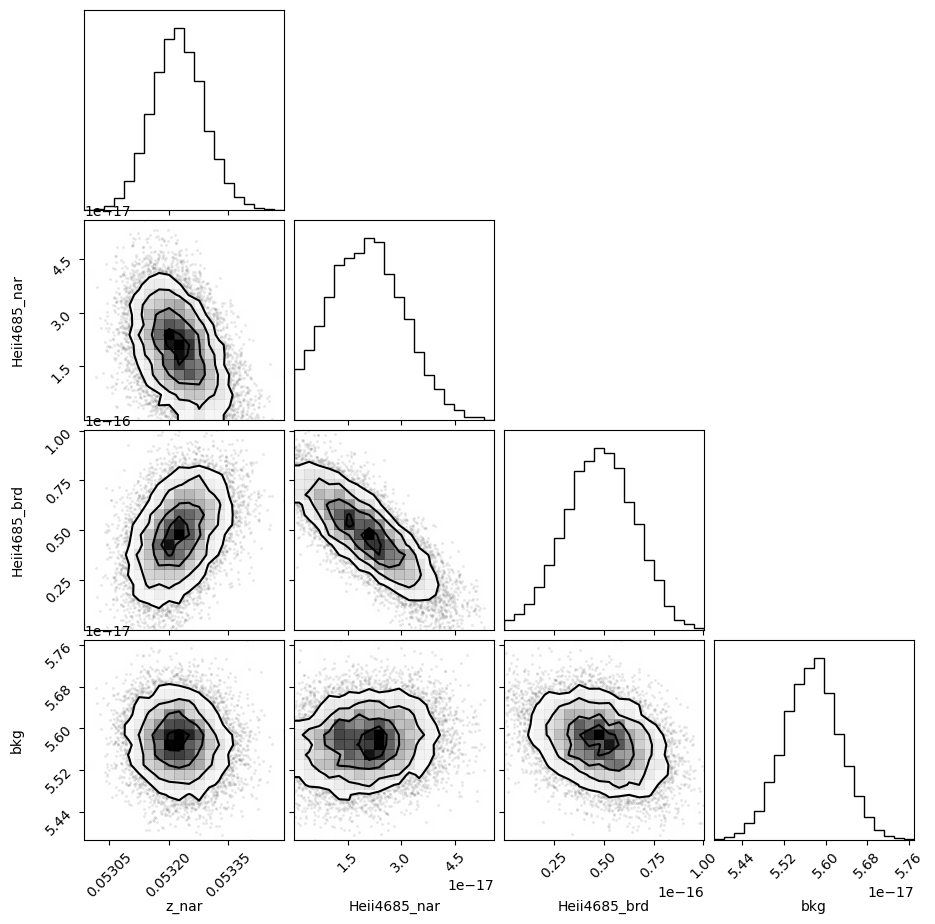

In [86]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

In [87]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05322405,6.4105e-05,(0.12%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_heii4685_nar,0.80307140,,,0.8030713973457402,-inf,inf,False
sigma_heii4685_brd,2.03823303,,,2.03823302778697,-inf,inf,False
Heii4685_nar,2.0260e-17,1.0496e-17,(51.81%),2e-17,0.00000000,inf,True
Heii4685_brd,4.8215e-17,1.7635e-17,(36.58%),8e-17,0.00000000,inf,True
bkg,5.5743e-17,5.3459e-19,(0.96%),5.5e-17,0.00000000,inf,True


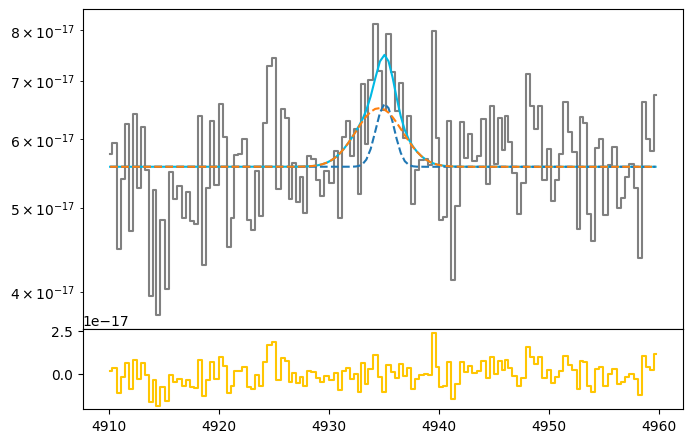

In [88]:
heii4685_nar_flux = out_heii4685.flatchain.Heii4685_nar.mean()
heii4685_nar_std = out_heii4685.flatchain.Heii4685_nar.std()

heii4685_brd_flux = out_heii4685.flatchain.Heii4685_brd.mean()
heii4685_brd_std = out_heii4685.flatchain.Heii4685_brd.std()

z_heii4685 = out_heii4685.flatchain.z_nar.mean()
z_heii4685_std = out_heii4685.flatchain.z_nar.std()

bkg_heii4685 = out_heii4685.flatchain.bkg.mean()
bkg_heii4685_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color=c[0])
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')

In [89]:
# EW
EW_heii4685_nar = ufloat(heii4685_nar_flux, heii4685_nar_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685_brd = ufloat(heii4685_brd_flux, heii4685_brd_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685 = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std)) / ufloat(bkg_heii4685, bkg_heii4685_std)

In [90]:
heii4685_tot_flux = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std))
round(heii4685_tot_flux.nominal_value/heii4685_tot_flux.std_dev, 2)

3.43

# [NII]6548 + H$\alpha$ + [NII]6584

### Arc lines

In [91]:
wave_cat['Ha']*(1 + z_BN[igal])

6913.0461023

In [92]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_ha = [wave_cat['Ha']*(1 + z_BN[igal]) - 10, wave_cat['Ha']*(1 + z_BN[igal]) + 10]
mask_arc_ha = (wcal_red[14].data['wave_soln'][0] >= wlims_ha[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_ha[1])

# Arc spectra around the fitted line
x_arc_ha = wcal_red[14].data['wave_soln'][0][mask_arc_ha]
y_arc_ha = wcal_red[23].data[:, 6][mask_arc_ha]

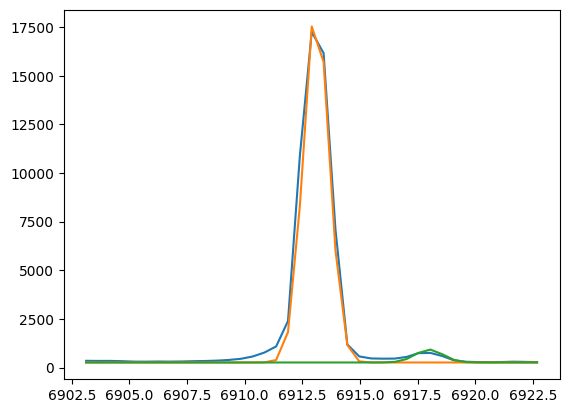

In [93]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 25300, 6913.1, 0, 0.55))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 1000, 6918, 0, 0.6))

100%|███████████████████████████████████████| 2500/2500 [00:53<00:00, 46.85it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.01946928 69.4201609  45.25020634]


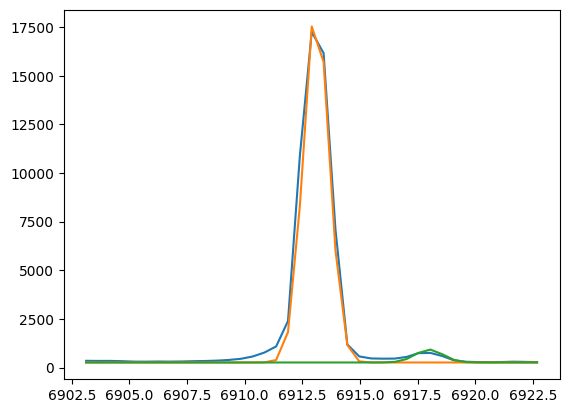

In [94]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 25300, 6913.1, 0, 0.55))
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, 1000, 6918, 0, 0.6))

params_arc_ha = Parameters()
params_arc_ha.add('z', value=0.0, vary=False)
params_arc_ha.add('mu1', value=6913.1, vary=False)
params_arc_ha.add('mu2', value=6918, vary=False)
params_arc_ha.add('arc1', value=25300, min=0.)
params_arc_ha.add('arc2', value=1000, min=0.)
params_arc_ha.add('sigma', value=0.6, min=0.)
params_arc_ha.add('bkg', value=260, vary=False)

def residual_arc_ha(params_arc_ha, x, data, uncertainty):
    
    z = params_arc_ha['z']
    mu1 = params_arc_ha['mu1']
    mu2 = params_arc_ha['mu2']
    flux1 = params_arc_ha['arc1']
    flux2 = params_arc_ha['arc2']
    sigma = params_arc_ha['sigma']
    bkg = params_arc_ha['bkg']
    
    x = x_arc_ha
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model = bkg + model1 + model2
    return (model - y_arc_ha) / 10

np.random.seed(23)
out_arc_ha = minimize(residual_arc_ha, params_arc_ha, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [95]:
out_arc_ha.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,6913.10000,,,6913.1,-inf,inf,False
mu2,6918.00000,,,6918,-inf,inf,False
arc1,28162.7568,12.9749883,(0.05%),25300,0.00000000,inf,True
arc2,864.370037,10.5073812,(1.22%),1000,0.00000000,inf,True
sigma,0.61714320,3.2208e-04,(0.05%),0.6,0.00000000,inf,True
bkg,260.000000,,,260,-inf,inf,False


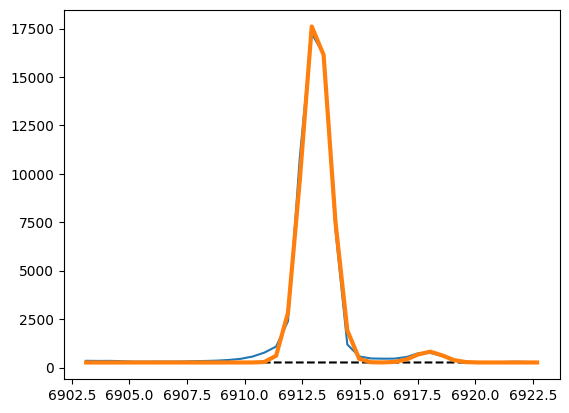

In [96]:
arc1_ha = out_arc_ha.flatchain.arc1.mean()
arc2_ha = out_arc_ha.flatchain.arc2.mean()
sigma_arc_ha = out_arc_ha.flatchain.sigma.mean()

plt.plot(x_arc_ha, y_arc_ha)

plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc1_ha, 6913.1, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc2_ha, 6918, 0, sigma_arc_ha), ls='--', color='black')

plt.plot(x_arc_ha, 260 + gaussian(x_arc_ha, arc1_ha, 6913.1, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc2_ha, 6918, 0, sigma_arc_ha), lw=3
)

### Line fitting

In [97]:
sigma_nar_ha = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_ha**2))
sigma_brd_ha = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_ha**2))

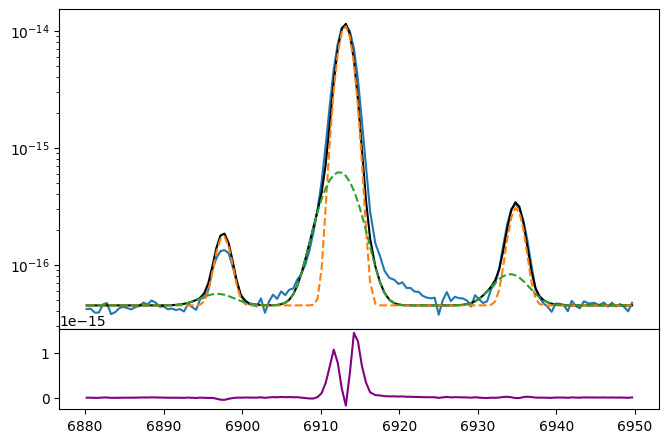

In [98]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 4.5e-17

ha_nar = gaussian(ha_nii.wavelength, 25e-15, wave_cat['Ha'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, 3e-15, wave_cat['Ha'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, 3e-16, wave_cat['[NII]6548'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, 0.6e-16, wave_cat['[NII]6548'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, 6e-16, wave_cat['[NII]6584'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, 2e-16, wave_cat['[NII]6584'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

ha = ha_nar + ha_brd
niib = niib_nar + niib_brd
niia = niia_nar + niia_brd

ax.plot(ha_nii.wavelength, bkg + niib + ha + niia, color='black')
ax.plot(ha_nii.wavelength, bkg + niib_nar + ha_nar + niia_nar, ls='--')
ax.plot(ha_nii.wavelength, bkg + niib_brd + ha_brd + niia_brd, ls='--')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib - ha - niia, color='purple')

#ax.axvline(7175)
#ax.axvline(7247)
ax.set_yscale('log')

In [99]:
params_ha_nii = Parameters()
params_ha_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ha_nii.add('z_ratio', value=z_ratio, vary=False)
params_ha_nii.add('sigma_6584_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6584_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_ha_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_ha_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_6548_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6548_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('Ha_nar', value=2.5e-14, min=0.)
params_ha_nii.add('Ha_brd', value=0.3e-14, min=0.)
params_ha_nii.add('Niia_nar', value=0.6e-15, min=0.)
params_ha_nii.add('Niia_brd', value=0.2e-15, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=4.5e-16, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_nar = params_ha_nii['z_nar']
    z_brd = params_ha_nii['z_nar'] * params_ha_nii['z_ratio']
    sigma_6584_nar = params_ha_nii['sigma_6584_nar']
    sigma_6584_brd = params_ha_nii['sigma_6584_brd']
    sigma_ha_nar = params_ha_nii['sigma_ha_nar']
    sigma_ha_brd = params_ha_nii['sigma_ha_brd']
    sigma_6548_nar = params_ha_nii['sigma_6548_nar']
    sigma_6548_brd = params_ha_nii['sigma_6548_brd']
    ha_nar = params_ha_nii['Ha_nar']
    ha_brd = params_ha_nii['Ha_brd']
    niia_nar = params_ha_nii['Niia_nar']
    niia_brd = params_ha_nii['Niia_brd']
    niib_nar = params_ha_nii['Niia_nar']*params_ha_nii['Niib_to_niia']
    niib_brd = params_ha_nii['Niia_brd']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_nar, wave_cat['Ha'], z_nar, sigma_ha_nar) \
             + gaussian(x, ha_brd, wave_cat['Ha'], z_brd, sigma_ha_brd)
    
    model_niia = gaussian(x, niia_nar, wave_cat['[NII]6584'], z_nar, sigma_6584_nar) \
               + gaussian(x, niia_brd, wave_cat['[NII]6584'], z_brd, sigma_6584_brd)
    
    model_niib = gaussian(x, niib_nar, wave_cat['[NII]6548'], z_nar, sigma_6548_nar) \
               + gaussian(x, niib_brd, wave_cat['[NII]6548'], z_brd, sigma_6548_brd)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [100]:
np.random.seed(23)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [02:09<00:00, 19.24it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 57.98962028  36.54094408 198.7793958   49.57072832  52.91218088
 108.74025349 112.99672236]


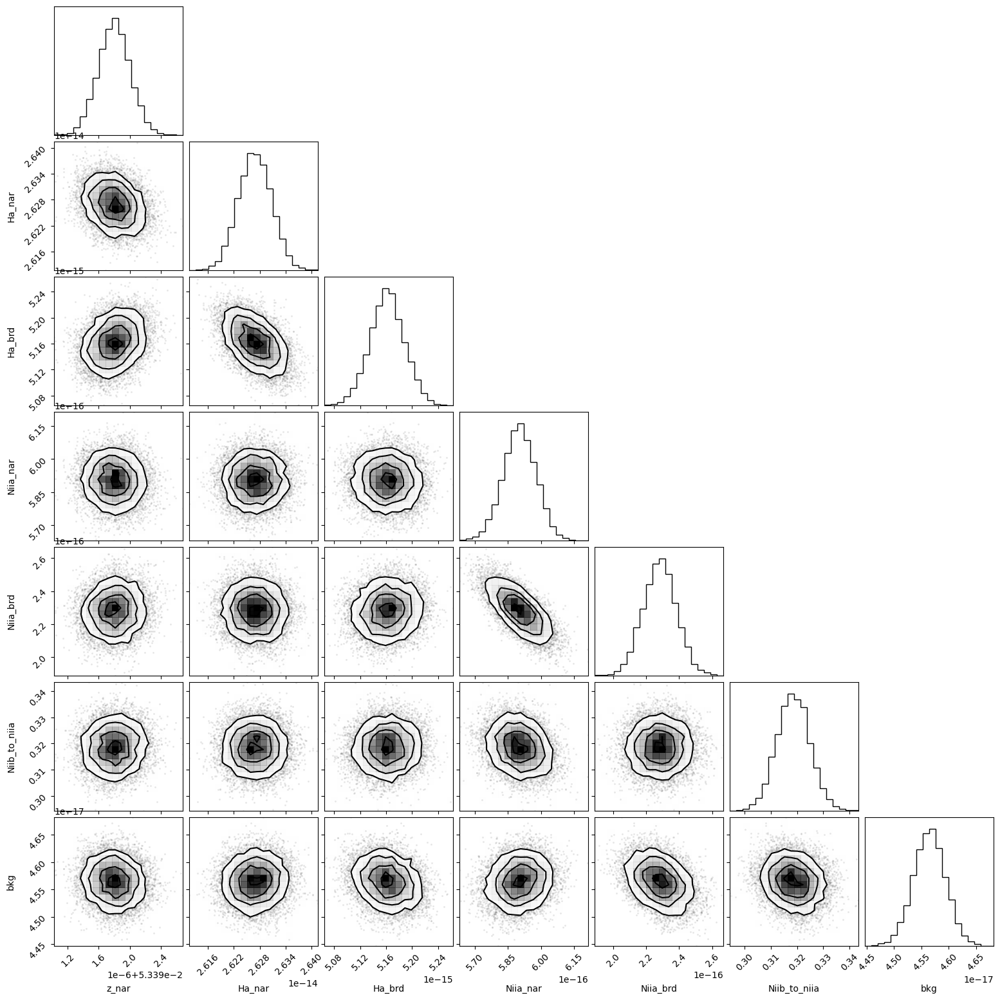

In [101]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [102]:
out_ha_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05339180,2.0463e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_6584_nar,0.91135949,,,0.9113594883772805,-inf,inf,False
sigma_6584_brd,2.08327778,,,2.083277783537783,-inf,inf,False
sigma_ha_nar,0.91135949,,,0.9113594883772805,-inf,inf,False
sigma_ha_brd,2.08327778,,,2.083277783537783,-inf,inf,False
sigma_6548_nar,0.91135949,,,0.9113594883772805,-inf,inf,False
sigma_6548_brd,2.08327778,,,2.083277783537783,-inf,inf,False
Ha_nar,2.6269e-14,3.8628e-17,(0.15%),2.5e-14,0.00000000,inf,True
Ha_brd,5.1617e-15,2.6510e-17,(0.51%),3e-15,0.00000000,inf,True


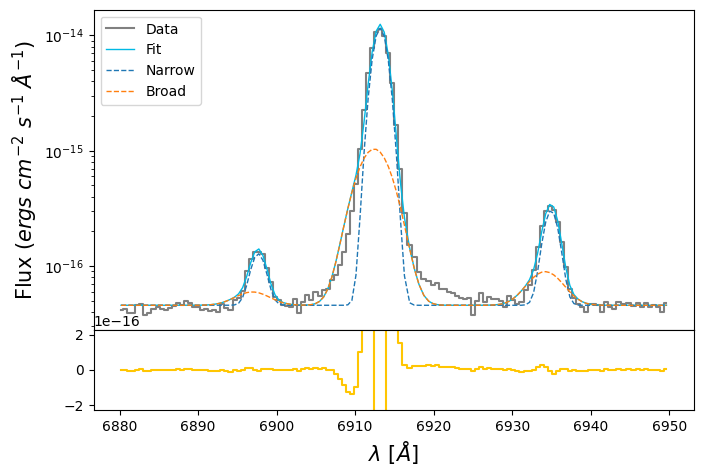

In [103]:
ha_nar_flux = out_ha_nii.flatchain.Ha_nar.mean()
ha_nar_std = out_ha_nii.flatchain.Ha_nar.std()

ha_brd_flux = out_ha_nii.flatchain.Ha_brd.mean()
ha_brd_std = out_ha_nii.flatchain.Ha_brd.std()

niia_nar_flux = out_ha_nii.flatchain.Niia_nar.mean()
niia_nar_std = out_ha_nii.flatchain.Niia_nar.std()

niia_brd_flux = out_ha_nii.flatchain.Niia_brd.mean()
niia_brd_std = out_ha_nii.flatchain.Niia_brd.std()

niib_nar_flux = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_nar_std = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).std()

niib_brd_flux = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_brd_std = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).std()

z_ha_nii = out_ha_nii.flatchain.z_nar.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_nar.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha_nar = gaussian(ha_nii.wavelength, ha_nar_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, ha_brd_flux, wave_cat['Ha'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, niia_nar_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, niia_brd_flux, wave_cat['[NII]6584'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, niib_nar_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, niib_brd_flux, wave_cat['[NII]6548'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia = niia_nar + niia_brd
ha = ha_nar + ha_brd
niib = niib_nar + niib_brd

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_nar + ha_nar + niib_nar,
        ls='--', lw=1, label='Narrow')
ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_brd + ha_brd + niib_brd,
        ls='--', lw=1, label='Broad')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
ax1.set_ylim(-5*bkg_ha_nii, 5*bkg_ha_nii)
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [104]:
# EW
EW_Ha_nar = ufloat(ha_nar_flux, ha_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha_brd = ufloat(ha_brd_flux, ha_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha = (ufloat(ha_nar_flux, ha_nar_std) + ufloat(ha_brd_flux, ha_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6584_nar = ufloat(niia_nar_flux, niia_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584_brd = ufloat(niia_brd_flux, niia_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = (ufloat(niia_nar_flux, niia_nar_std) + ufloat(niia_brd_flux, niia_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6548_nar = ufloat(niib_nar_flux, niib_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548_brd = ufloat(niib_brd_flux, niib_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = (ufloat(niib_nar_flux, niib_nar_std) + ufloat(niib_brd_flux, niib_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

### Arc lines

In [105]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7330 = [wave_cat['[OII]7330']*(1 + z_BN[igal]) - 60, wave_cat['[OII]7330']*(1 + z_BN[igal]) - 40]
mask_arc_7330 = (wcal_red[16].data['wave_soln'][0] >= wlims_7330[0]) & (wcal_red[16].data['wave_soln'][0] < wlims_7330[1])

# Arc spectra around the fitted line
x_arc_7330 = wcal_red[16].data['wave_soln'][0][mask_arc_7330]
y_arc_7330 = wcal_red[23].data[:, 7][mask_arc_7330]

100%|███████████████████████████████████████| 2500/2500 [02:00<00:00, 20.80it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [61.91175102 64.6823684  62.78882866 66.36168301 59.27912172 57.0697749
 62.95029825]


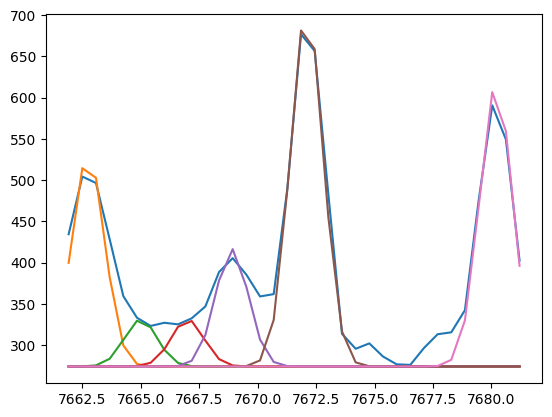

In [106]:
plt.plot(x_arc_7330, y_arc_7330)
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 450, 7662.75, 0, 0.7))
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 100, 7665, 0, 0.7))
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 100, 7667, 0, 0.7))
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 250, 7668.9, 0, 0.7))
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 760, 7672.1, 0, 0.7))
plt.plot(x_arc_7330, 274 + gaussian(x_arc_7330, 600, 7680.2, 0, 0.7))

params_arc_7330 = Parameters()
params_arc_7330.add('z', value=0.0, vary=False)
params_arc_7330.add('mu1', value=7662.75, vary=False)
params_arc_7330.add('mu2', value=7665, vary=False)
params_arc_7330.add('mu3', value=7667, vary=False)
params_arc_7330.add('mu4', value=7668.9, vary=False)
params_arc_7330.add('mu5', value=7672.1, vary=False)
params_arc_7330.add('mu6', value=7680.2, vary=False)
params_arc_7330.add('arc1', value=450, min=0.)
params_arc_7330.add('arc2', value=100, min=0.)
params_arc_7330.add('arc3', value=100, min=0.)
params_arc_7330.add('arc4', value=250, min=0.)
params_arc_7330.add('arc5', value=760, min=0.)
params_arc_7330.add('arc6', value=600, min=0.)
params_arc_7330.add('sigma', value=0.7, min=0.)
params_arc_7330.add('bkg', value=274, vary=False)

def residual_arc_7330(params_arc_7330, x, data, uncertainty):
    
    z = params_arc_7330['z']
    mu1 = params_arc_7330['mu1']
    mu2 = params_arc_7330['mu2']
    mu3 = params_arc_7330['mu3']
    mu4 = params_arc_7330['mu4']
    mu5 = params_arc_7330['mu5']
    mu6 = params_arc_7330['mu6']
    flux1 = params_arc_7330['arc1']
    flux2 = params_arc_7330['arc2']
    flux3 = params_arc_7330['arc3']
    flux4 = params_arc_7330['arc4']
    flux5 = params_arc_7330['arc5']
    flux6 = params_arc_7330['arc6']
    sigma = params_arc_7330['sigma']
    bkg = params_arc_7330['bkg']
    
    x = x_arc_7330
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6
    return (model - y_arc_7330) / 10

np.random.seed(23)
out_arc_7330 = minimize(residual_arc_7330, params_arc_7330, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

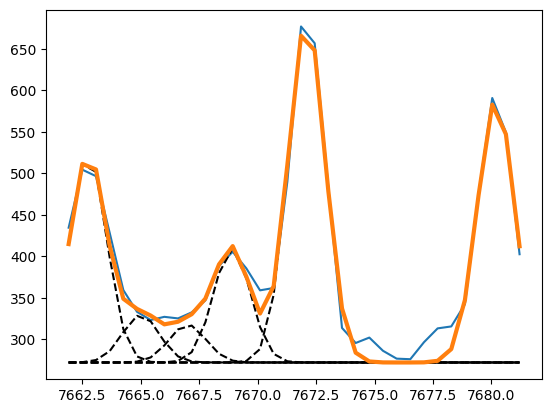

In [107]:
arc1_7330 = out_arc_7330.flatchain.arc1.mean()
arc2_7330 = out_arc_7330.flatchain.arc2.mean()
arc3_7330 = out_arc_7330.flatchain.arc3.mean()
arc4_7330 = out_arc_7330.flatchain.arc4.mean()
arc5_7330 = out_arc_7330.flatchain.arc5.mean()
arc6_7330 = out_arc_7330.flatchain.arc6.mean()
sigma_arc_7330 = out_arc_7330.flatchain.sigma.mean()

plt.plot(x_arc_7330, y_arc_7330)

plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc1_7330, 7662.75, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc2_7330, 7665, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc3_7330, 7667, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc4_7330, 7668.9, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc5_7330, 7672.1, 0, sigma_arc_7330), ls='--', color='black')
plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc6_7330, 7680.2, 0, sigma_arc_7330), ls='--', color='black')

plt.plot(x_arc_7330, 272 + gaussian(x_arc_7330, arc1_7330, 7662.75, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc2_7330, 7665, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc3_7330, 7667, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc4_7330, 7668.9, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc5_7330, 7672.1, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc6_7330, 7680.2, 0, sigma_arc_7330), lw=3
)

### Line fitting

In [108]:
sigma_nar_7330 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7330**2))
sigma_brd_7330 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7330**2))

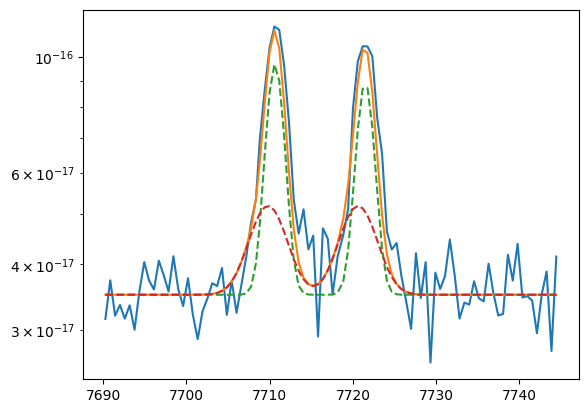

In [109]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

# FESEN

oiia_nar = gaussian(oii_7320.wavelength, 1.4e-16, wave_cat['[OII]7330'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiia_brd = gaussian(oii_7320.wavelength, 0.9e-16, wave_cat['[OII]7330'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiib_nar = gaussian(oii_7320.wavelength, 1.6e-16, wave_cat['[OII]7319'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiib_brd = gaussian(oii_7320.wavelength, 0.9e-16, wave_cat['[OII]7319'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd
bkg = 3.5e-17

plt.plot(oii_7320.wavelength, bkg + oiib + oiia)
plt.plot(oii_7320.wavelength, bkg + oiib_nar + oiia_nar, ls='--')
plt.plot(oii_7320.wavelength, bkg + oiib_brd + oiia_brd, ls='--')

plt.yscale('log')

In [110]:
params_oii_7320 = Parameters()

params_oii_7320.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_7320.add('z_ratio', value=z_ratio, vary=False)
params_oii_7320.add('sigma_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('Oiia_nar', value=1.4e-16, min=0.)
params_oii_7320.add('Oiia_brd', value=0.9e-16, min=0.)
params_oii_7320.add('Oiib_nar', value=1.6e-16, min=0.)
params_oii_7320.add('Oiib_brd', value=0.9e-16, min=0.)
params_oii_7320.add('bkg', value=3.5e-17, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_nar = params_oii_7320['z_nar']
    z_brd = params_oii_7320['z_nar'] * params_oii_7320['z_ratio']
    sigma_nar = params_oii_7320['sigma_nar']
    sigma_brd = params_oii_7320['sigma_brd']
    oiia_nar_flux = params_oii_7320['Oiia_nar']
    oiia_brd_flux = params_oii_7320['Oiia_brd']
    oiib_nar_flux = params_oii_7320['Oiib_nar']
    oiib_brd_flux = params_oii_7320['Oiib_brd']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_nar_flux, wave_cat['[OII]7330'], z_nar, sigma_nar) + \
                 gaussian(x, oiia_brd_flux, wave_cat['[OII]7330'], z_brd, sigma_brd)
    model_oiib = gaussian(x, oiib_nar_flux, wave_cat['[OII]7319'], z_nar, sigma_nar) + \
                 gaussian(x, oiib_brd_flux, wave_cat['[OII]7319'], z_brd, sigma_brd)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [111]:
np.random.seed(23)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:36<00:00, 25.90it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [48.76664847 52.05230682 57.25975463 51.27917294 59.50552366 51.09565759]


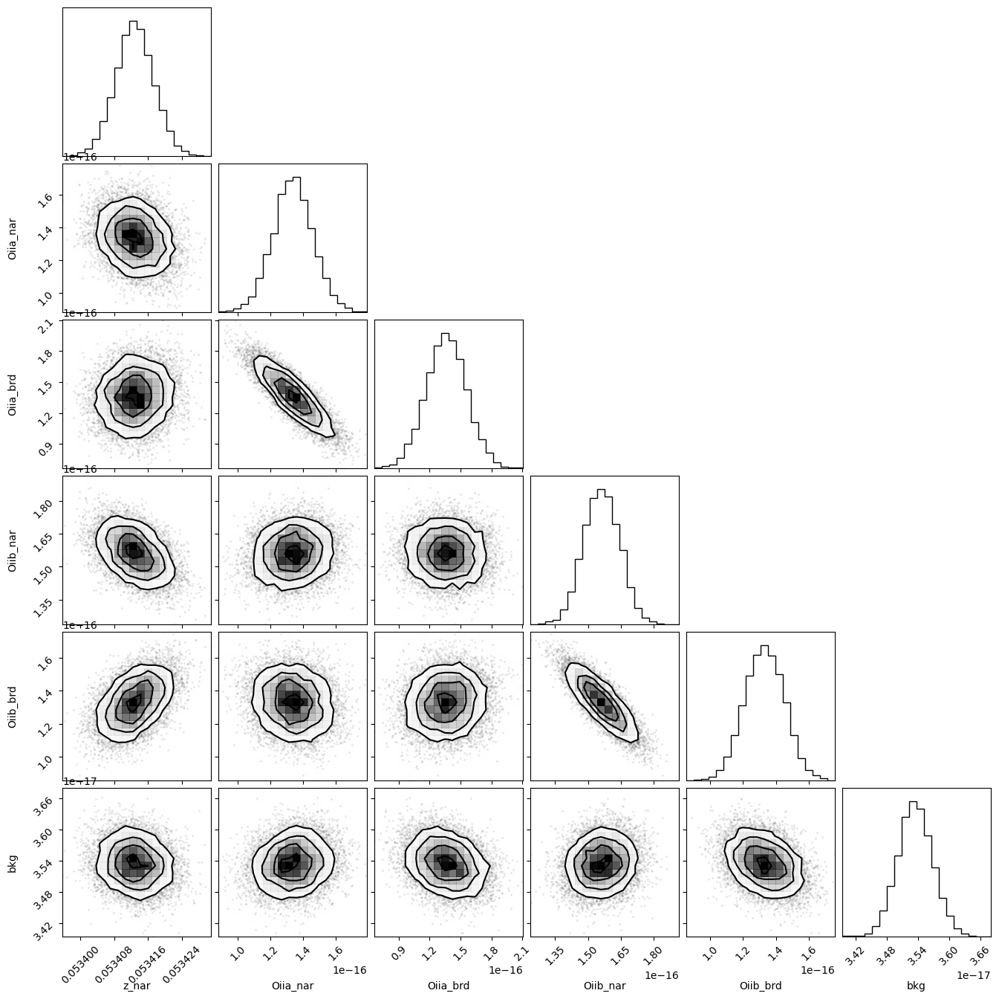

In [112]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);

In [113]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05341287,4.4786e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,1.03247908,,,1.0324790794913936,-inf,inf,False
sigma_brd,2.13903793,,,2.139037927647426,-inf,inf,False
Oiia_nar,1.3376e-16,1.2293e-17,(9.19%),1.4e-16,0.00000000,inf,True
Oiia_brd,1.3629e-16,1.9447e-17,(14.27%),9e-17,0.00000000,inf,True
Oiib_nar,1.5619e-16,8.2870e-18,(5.31%),1.6e-16,0.00000000,inf,True
Oiib_brd,1.3298e-16,1.2052e-17,(9.06%),9e-17,0.00000000,inf,True
bkg,3.5343e-17,3.3494e-19,(0.95%),3.5e-17,0.00000000,inf,True


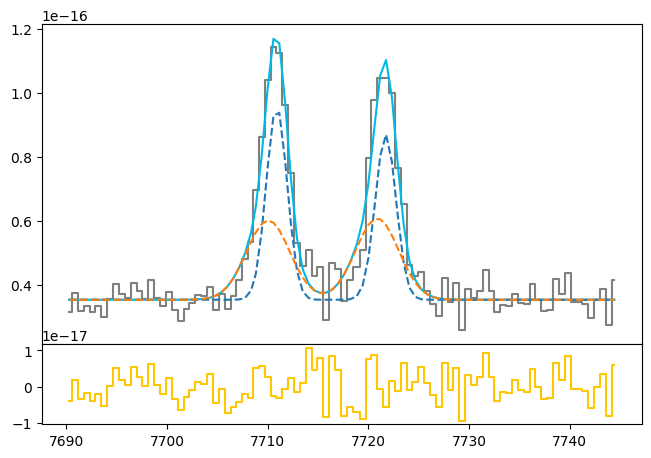

In [114]:
oiia_nar_flux = out_oii_7320.flatchain.Oiia_nar.mean()
oiia_nar_std = out_oii_7320.flatchain.Oiia_nar.std()

oiia_brd_flux = out_oii_7320.flatchain.Oiia_brd.mean()
oiia_brd_std = out_oii_7320.flatchain.Oiia_brd.std()

oiib_nar_flux = out_oii_7320.flatchain.Oiib_nar.mean()
oiib_nar_std = out_oii_7320.flatchain.Oiib_nar.std()

oiib_brd_flux = out_oii_7320.flatchain.Oiib_brd.mean()
oiib_brd_std = out_oii_7320.flatchain.Oiib_brd.std()

z_oii_7320 = out_oii_7320.flatchain.z_nar.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_nar.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_nar + oiib_nar, ls='--')
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_brd + oiib_brd, ls='--')
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

In [115]:
# EW
EW_OII_7330_nar = ufloat(oiia_nar_flux, oiia_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330_brd = ufloat(oiia_brd_flux, oiia_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330 = (ufloat(oiia_nar_flux, oiia_nar_std) + ufloat(oiia_brd_flux, oiia_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

EW_OII_7319_nar = ufloat(oiib_nar_flux, oiib_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319_brd = ufloat(oiib_brd_flux, oiib_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = (ufloat(oiib_nar_flux, oiib_nar_std) + ufloat(oiib_brd_flux, oiib_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# [SII]6716 + [SII]6730

### Arc lines

In [116]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6730 = [wave_cat['[SII]6730']*(1 + z_BN[igal]) - 10, wave_cat['[SII]6730']*(1 + z_BN[igal]) + 10]
mask_arc_6730 = (wcal_red[14].data['wave_soln'][0] >= wlims_6730[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_6730[1])

# Arc spectra around the fitted line
x_arc_6730 = wcal_red[14].data['wave_soln'][0][mask_arc_6730]
y_arc_6730 = wcal_red[23].data[:, 6][mask_arc_6730]

100%|███████████████████████████████████████| 2500/2500 [01:17<00:00, 32.21it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [62.84194932 46.9706936  50.430409   53.59186314]


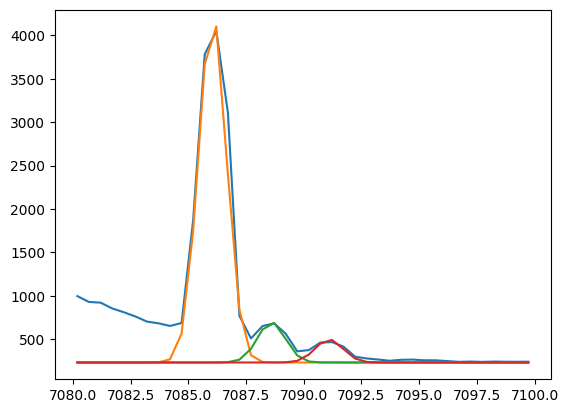

In [117]:
plt.plot(x_arc_6730, y_arc_6730)
plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, 6050, 7086.05, 0, 0.6))
plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, 700, 7088.6, 0, 0.6))
plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, 400, 7091.1, 0, 0.6))

params_arc_6730 = Parameters()
params_arc_6730.add('z', value=0.0, vary=False)
params_arc_6730.add('mu1', value=7086.05, vary=False)
params_arc_6730.add('mu2', value=7088.6, vary=False)
params_arc_6730.add('mu3', value=7091.1, vary=False)
params_arc_6730.add('arc1', value=6050, min=0.)
params_arc_6730.add('arc2', value=700, min=0.)
params_arc_6730.add('arc3', value=400, min=0.)
params_arc_6730.add('sigma', value=0.6, min=0.)
params_arc_6730.add('bkg', value=230, vary=False)

def residual_arc_6730(params_arc_6730, x, data, uncertainty):
    
    z = params_arc_6730['z']
    mu1 = params_arc_6730['mu1']
    mu2 = params_arc_6730['mu2']
    mu3 = params_arc_6730['mu3']
    flux1 = params_arc_6730['arc1']
    flux2 = params_arc_6730['arc2']
    flux3 = params_arc_6730['arc3']
    sigma = params_arc_6730['sigma']
    bkg = params_arc_6730['bkg']
    
    x = x_arc_6730
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_6730) / 10

np.random.seed(23)
out_arc_6730 = minimize(residual_arc_6730, params_arc_6730, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [118]:
out_arc_6730.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7086.05000,,,7086.05,-inf,inf,False
mu2,7088.60000,,,7088.6,-inf,inf,False
mu3,7091.10000,,,7091.1,-inf,inf,False
arc1,6645.32894,12.9974087,(0.20%),6050,0.00000000,inf,True
arc2,739.055274,10.8439140,(1.47%),700,0.00000000,inf,True
arc3,429.982934,10.5984016,(2.46%),400,0.00000000,inf,True
sigma,0.64811932,0.00138725,(0.21%),0.6,0.00000000,inf,True
bkg,230.000000,,,230,-inf,inf,False


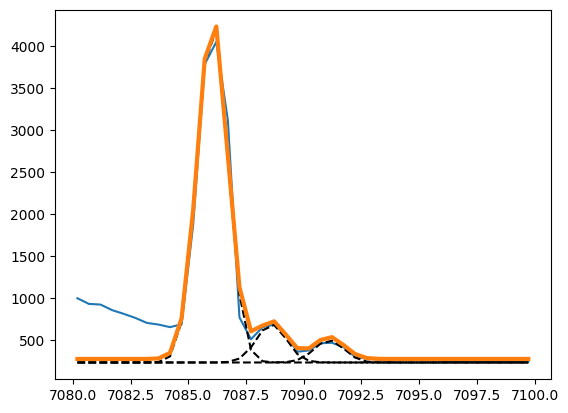

In [119]:
arc1_6730 = out_arc_6730.flatchain.arc1.mean()
arc2_6730 = out_arc_6730.flatchain.arc2.mean()
arc3_6730 = out_arc_6730.flatchain.arc3.mean()
sigma_arc_6730 = out_arc_6730.flatchain.sigma.mean()

plt.plot(x_arc_6730, y_arc_6730)

plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, arc1_6730, 7086.05, 0, sigma_arc_6730), ls='--', color='black')
plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, arc2_6730, 7088.6, 0, sigma_arc_6730), ls='--', color='black')
plt.plot(x_arc_6730, 230 + gaussian(x_arc_6730, arc3_6730, 7091.1, 0, sigma_arc_6730), ls='--', color='black')

plt.plot(x_arc_6730, 272 + gaussian(x_arc_6730, arc1_6730, 7086.05, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc2_6730, 7088.6, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc3_6730, 7091.1, 0, sigma_arc_6730), lw=3
)

### Line fitting

In [120]:
sigma_nar_6730 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6730**2))
sigma_brd_6730 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6730**2))

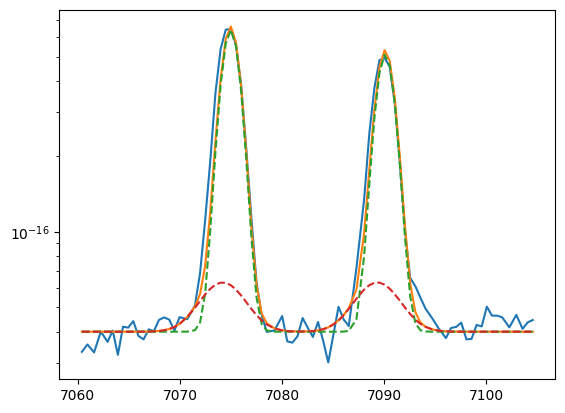

In [121]:
plt.plot(sii.wavelength, sii.flux)
bkg = 4e-17

siia_nar = gaussian(sii.wavelength, 1.1e-15, wave_cat['[SII]6730'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siia_brd = gaussian(sii.wavelength, 1.2e-16, wave_cat['[SII]6730'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siib_nar = gaussian(sii.wavelength, 1.4e-15, wave_cat['[SII]6716'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siib_brd = gaussian(sii.wavelength, 1.2e-16, wave_cat['[SII]6716'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

plt.plot(sii.wavelength, siia + siib + bkg)
plt.plot(sii.wavelength, siia_nar + siib_nar + bkg, ls='--')
plt.plot(sii.wavelength, siia_brd + siib_brd + bkg, ls='--')
plt.yscale('log')

In [122]:
params_sii = Parameters()
params_sii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_sii.add('z_ratio', value=z_ratio, vary=False)
params_sii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('Siia_nar', value=1.1e-15, min=0.)
params_sii.add('Siia_brd', value=1.2e-16, min=0.)
params_sii.add('Siib_nar', value=1.4e-15, min=0.)
params_sii.add('Siib_brd', value=1.2e-16, min=0.)
params_sii.add('bkg', value=4e-17, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_nar = params_sii['z_nar']
    z_brd = params_sii['z_nar'] * params_sii['z_ratio']
    sigma_nar = params_sii['sigma_nar']
    sigma_brd = params_sii['sigma_brd']
    siia_nar_flux = params_sii['Siia_nar']
    siia_brd_flux = params_sii['Siia_brd']
    siib_nar_flux = params_sii['Siib_nar']
    siib_brd_flux = params_sii['Siib_brd']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_nar_flux, wave_cat['[SII]6730'], z_nar, sigma_nar) + \
                 gaussian(x, siia_brd_flux, wave_cat['[SII]6730'], z_brd, sigma_brd)
    model_siib = gaussian(x, siib_nar_flux, wave_cat['[SII]6716'], z_nar, sigma_nar) + \
                 gaussian(x, siib_brd_flux, wave_cat['[SII]6716'], z_brd, sigma_brd)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [123]:
np.random.seed(23)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:33<00:00, 26.65it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 38.17327166  95.78064382 142.84503053  85.44330143 174.40667387
  94.24663123]


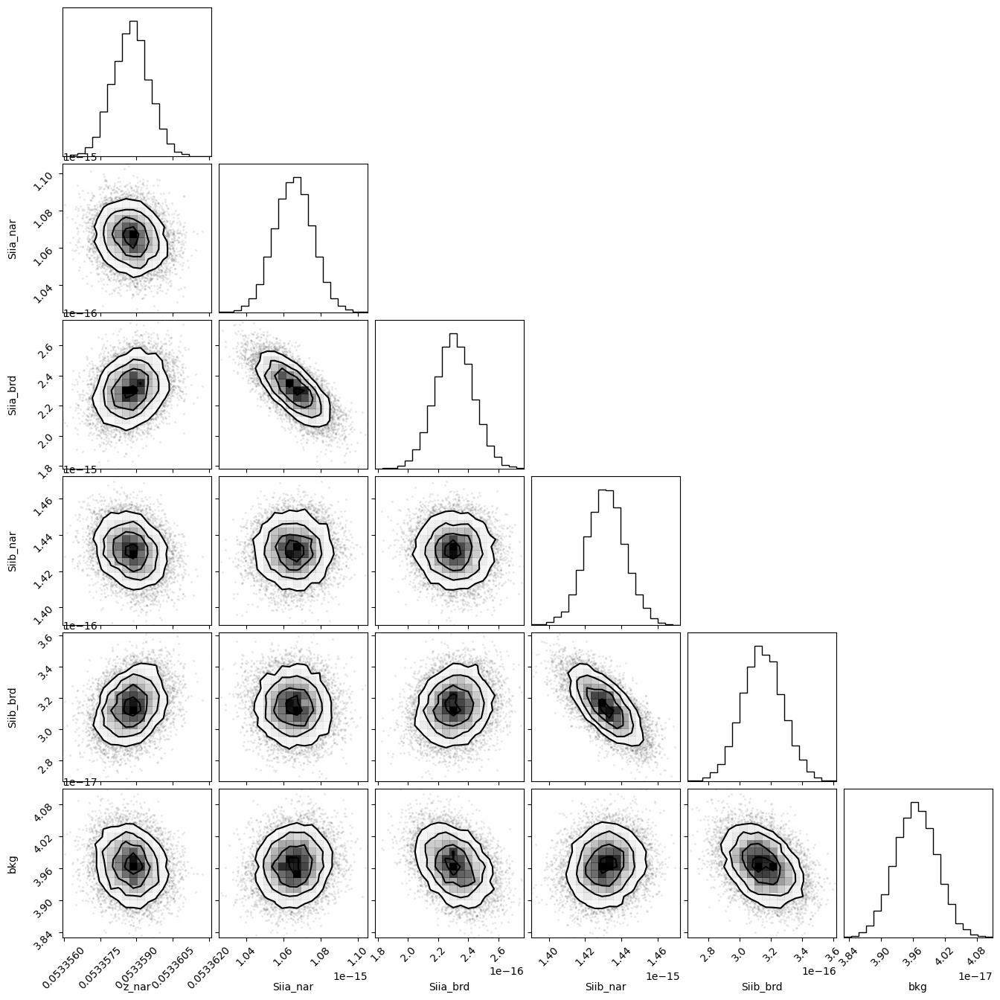

In [124]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);

In [125]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05335878,7.5758e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.93261311,,,0.9326131062725825,-inf,inf,False
sigma_brd,2.09266276,,,2.092662756470377,-inf,inf,False
Siia_nar,1.0656e-15,1.0269e-17,(0.96%),1.1e-15,0.00000000,inf,True
Siia_brd,2.3060e-16,1.2638e-17,(5.48%),1.2e-16,0.00000000,inf,True
Siib_nar,1.4313e-15,1.0601e-17,(0.74%),1.4e-15,0.00000000,inf,True
Siib_brd,3.1446e-16,1.3088e-17,(4.16%),1.2e-16,0.00000000,inf,True
bkg,3.9665e-17,3.9125e-19,(0.99%),4e-17,0.00000000,inf,True


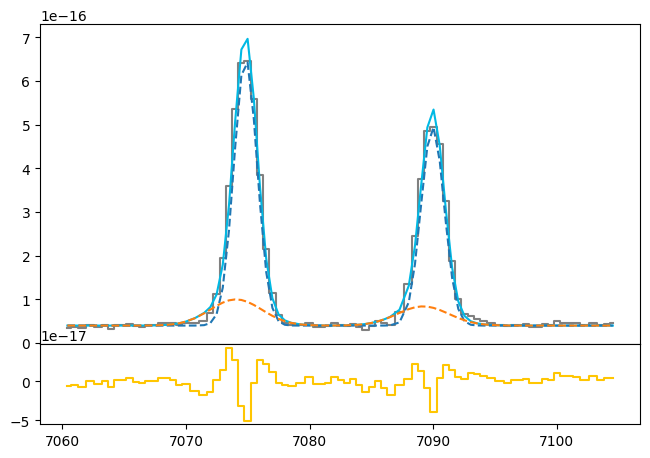

In [126]:
siia_nar_flux = out_sii.flatchain.Siia_nar.mean()
siia_nar_std = out_sii.flatchain.Siia_nar.std()

siia_brd_flux = out_sii.flatchain.Siia_brd.mean()
siia_brd_std = out_sii.flatchain.Siia_brd.std()

siib_nar_flux = out_sii.flatchain.Siib_nar.mean()
siib_nar_std = out_sii.flatchain.Siib_nar.std()

siib_brd_flux = out_sii.flatchain.Siib_brd.mean()
siib_brd_std = out_sii.flatchain.Siib_brd.std()

z_sii = out_sii.flatchain.z_nar.mean()
z_sii_std = out_sii.flatchain.z_nar.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
ax.plot(sii.wavelength, bkg_sii + siia_nar + siib_nar, ls='--')
ax.plot(sii.wavelength, bkg_sii + siia_brd + siib_brd, ls='--')
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

In [127]:
# EW
EW_SII_6730_nar = ufloat(siia_nar_flux, siia_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730_brd = ufloat(siia_brd_flux, siia_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730 = (ufloat(siia_nar_flux, siia_nar_std) + ufloat(siia_brd_flux, siia_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

EW_SII_6716_nar = ufloat(siib_nar_flux, siib_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716_brd = ufloat(siib_brd_flux, siib_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = (ufloat(siib_nar_flux, siib_nar_std) + ufloat(siib_brd_flux, siib_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

# H$\beta$

### Arc lines

In [128]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hb = [wave_cat['Hb']*(1 + z_BN[igal]) - 10, wave_cat['Hb']*(1 + z_BN[igal]) + 10]
mask_arc_hb = (wcal_blue[12].data['wave_soln'][0] >= wlims_hb[0]) & (wcal_blue[12].data['wave_soln'][0] < wlims_hb[1])

# Arc spectra around the fitted line
x_arc_hb = wcal_blue[12].data['wave_soln'][0][mask_arc_hb]
y_arc_hb = wcal_blue[25].data[:, 5][mask_arc_hb]

100%|███████████████████████████████████████| 2500/2500 [01:41<00:00, 24.64it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [71.93278158 46.86498128 84.630204   85.65106599 77.40950376 52.25431329]


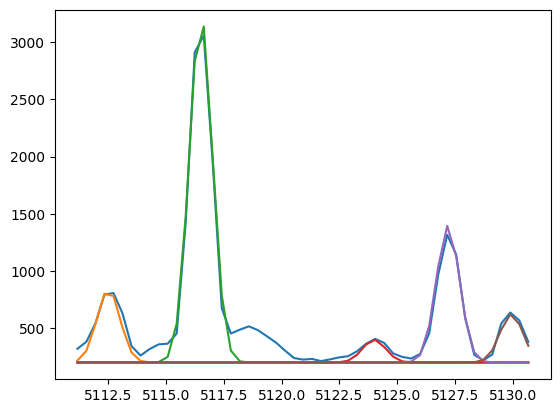

In [129]:
plt.plot(x_arc_hb, y_arc_hb)
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, 800, 5112.5, 0, 0.5))
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, 3800, 5116.5, 0, 0.5))
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, 250, 5124, 0, 0.5))
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, 1500, 5127.2, 0, 0.5))
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, 530, 5129.95, 0, 0.5))

params_arc_hb = Parameters()
params_arc_hb.add('z', value=0.0, vary=False)
params_arc_hb.add('mu1', value=5112.5, vary=False)
params_arc_hb.add('mu2', value=5116.5, vary=False)
params_arc_hb.add('mu3', value=5124, vary=False)
params_arc_hb.add('mu4', value=5127.2, vary=False)
params_arc_hb.add('mu5', value=5129.95, vary=False)
params_arc_hb.add('arc1', value=800, min=0.)
params_arc_hb.add('arc2', value=3800, min=0.)
params_arc_hb.add('arc3', value=250, min=0.)
params_arc_hb.add('arc4', value=1500, min=0.)
params_arc_hb.add('arc5', value=530, min=0.)
params_arc_hb.add('sigma', value=0.5, min=0.)
params_arc_hb.add('bkg', value=200, vary=False)

def residual_arc_hb(params_arc_hb, x, data, uncertainty):
    
    z = params_arc_hb['z']
    mu1 = params_arc_hb['mu1']
    mu2 = params_arc_hb['mu2']
    mu3 = params_arc_hb['mu3']
    mu4 = params_arc_hb['mu4']
    mu5 = params_arc_hb['mu5']
    flux1 = params_arc_hb['arc1']
    flux2 = params_arc_hb['arc2']
    flux3 = params_arc_hb['arc3']
    flux4 = params_arc_hb['arc4']
    flux5 = params_arc_hb['arc5']
    sigma = params_arc_hb['sigma']
    bkg = params_arc_hb['bkg']
    
    x = x_arc_hb
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_hb) / 10

np.random.seed(23)
out_arc_hb = minimize(residual_arc_hb, params_arc_hb, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

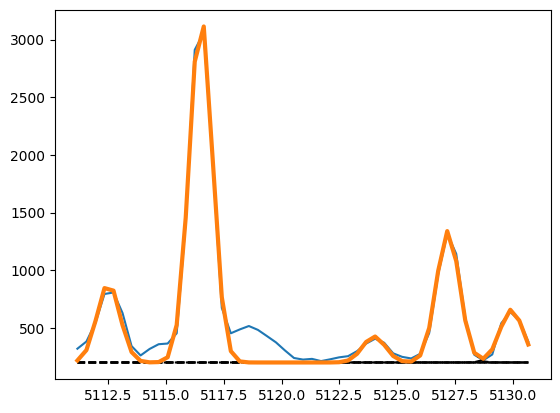

In [130]:
arc1_hb = out_arc_hb.flatchain.arc1.mean()
arc2_hb = out_arc_hb.flatchain.arc2.mean()
arc3_hb = out_arc_hb.flatchain.arc3.mean()
arc4_hb = out_arc_hb.flatchain.arc4.mean()
arc5_hb = out_arc_hb.flatchain.arc5.mean()
sigma_arc_hb = out_arc_hb.flatchain.sigma.mean()

plt.plot(x_arc_hb, y_arc_hb)

plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc1_hb, 5112.5, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc2_hb, 5116.5, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc3_hb, 5124, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc4_hb, 5127.2, 0, sigma_arc_hb), ls='--', color='black')
plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc5_hb, 5129.95, 0, sigma_arc_hb), ls='--', color='black')

plt.plot(x_arc_hb, 200 + gaussian(x_arc_hb, arc1_hb, 5112.5, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc2_hb, 5116.5, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc3_hb, 5124, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc4_hb, 5127.2, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc5_hb, 5129.95, 0, sigma_arc_hb), lw=3
)

### Line fitting

In [131]:
sigma_nar_hb = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hb**2))
sigma_brd_hb = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hb**2))

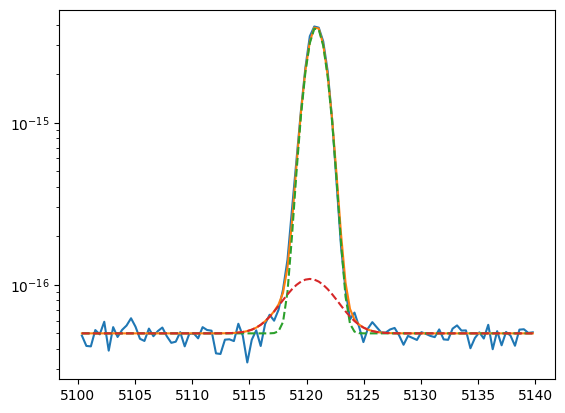

In [132]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 5e-17

hb_nar = gaussian(hbeta.wavelength, 8e-15, wave_cat['Hb'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, 0.3e-15, wave_cat['Hb'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

plt.plot(hbeta.wavelength, hb + bkg)
plt.plot(hbeta.wavelength, hb_nar + bkg, ls='--')
plt.plot(hbeta.wavelength, hb_brd + bkg, ls='--')
plt.yscale('log')

In [133]:
params_hb = Parameters()
params_hb.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hb.add('z_ratio', value=z_ratio, vary=False)
params_hb.add('sigma_nar', value=upy.nominal_values(sigma_nar_hb), vary=False)
params_hb.add('sigma_brd', value=upy.nominal_values(sigma_brd_hb), vary=False)
params_hb.add('Hb_nar', value=8.0e-15, min=0.)
params_hb.add('Hb_brd', value=3.5e-16, min=0.)
params_hb.add('bkg', value=5e-17, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_nar = params_hb['z_nar']
    z_brd = params_hb['z_nar'] * params_hb['z_ratio']
    sigma_nar = params_hb['sigma_nar']
    sigma_brd = params_hb['sigma_brd']
    hb_nar_flux = params_hb['Hb_nar']
    hb_brd_flux = params_hb['Hb_brd']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_nar_flux, wave_cat['Hb'], z_nar, sigma_nar) + \
            gaussian(x, hb_brd_flux, wave_cat['Hb'], z_brd, sigma_brd)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [134]:
np.random.seed(23)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:05<00:00, 38.22it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [33.98864794 64.79517372 59.16048474 39.78763139]


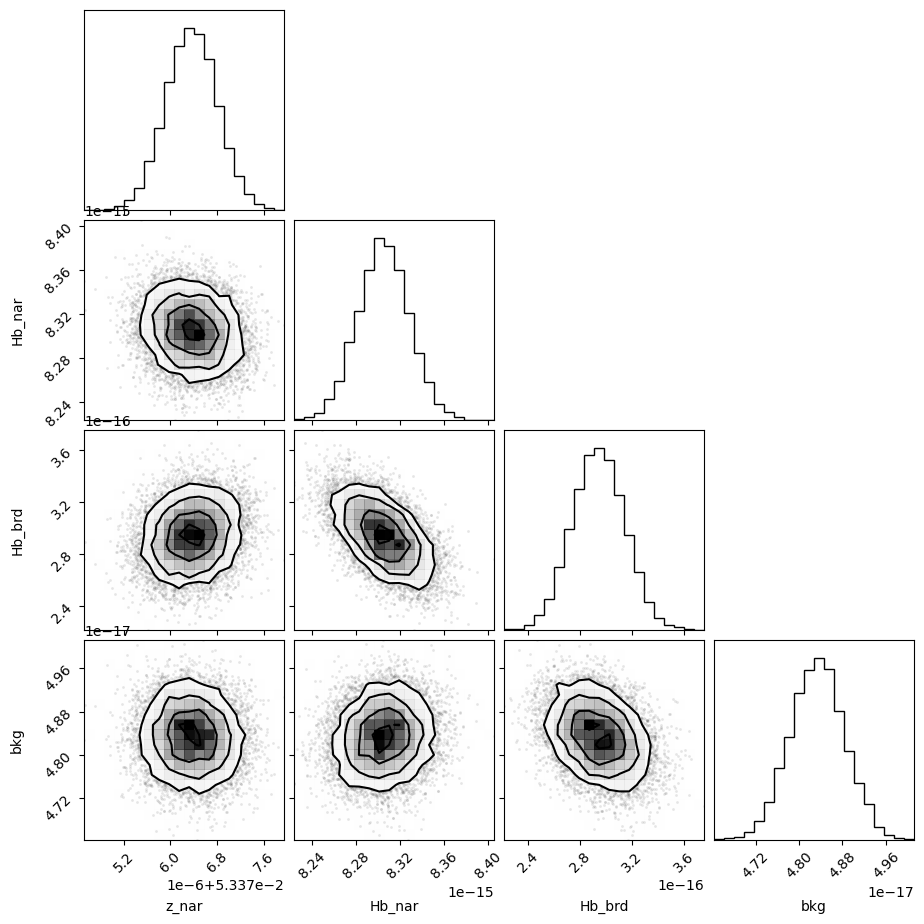

In [135]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

In [136]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05337636,4.3546e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.83423592,,,0.8342359235335702,-inf,inf,False
sigma_brd,2.05071202,,,2.050712018407438,-inf,inf,False
Hb_nar,8.3050e-15,2.3148e-17,(0.28%),8e-15,0.00000000,inf,True
Hb_brd,2.9418e-16,2.0138e-17,(6.85%),3.5e-16,0.00000000,inf,True
bkg,4.8340e-17,4.9875e-19,(1.03%),5e-17,0.00000000,inf,True


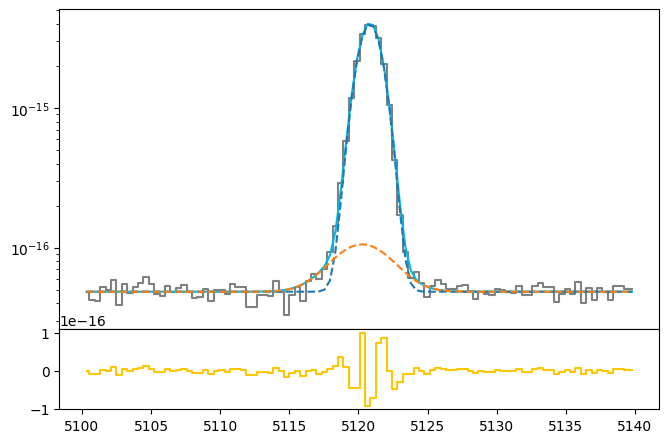

In [137]:
hb_nar_flux = out_hb.flatchain.Hb_nar.mean()
hb_nar_std = out_hb.flatchain.Hb_nar.std()

hb_brd_flux = out_hb.flatchain.Hb_brd.mean()
hb_brd_std = out_hb.flatchain.Hb_brd.std()

z_hb = out_hb.flatchain.z_nar.mean()
z_hb_std = out_hb.flatchain.z_nar.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb_nar = gaussian(hbeta.wavelength, hb_nar_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, hb_brd_flux, wave_cat['Hb'], z_hb * z_ratio, upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.plot(hbeta.wavelength, bkg_hb + hb_nar, ls='--')
ax.plot(hbeta.wavelength, bkg_hb + hb_brd, ls='--')
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [138]:
# EW
EW_Hb_nar = ufloat(hb_nar_flux, hb_nar_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb_brd = ufloat(hb_brd_flux, hb_brd_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb = (ufloat(hb_nar_flux, hb_nar_std) + ufloat(hb_brd_flux, hb_brd_std)) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

### Arc lines

In [139]:
wave_cat['Hg']*(1 + z_BN[igal])

4572.122990639999

In [140]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hg = [wave_cat['Hg']*(1 + z_BN[igal]) - 10, wave_cat['Hg']*(1 + z_BN[igal]) + 10]
mask_arc_hg = (wcal_blue[10].data['wave_soln'][0] >= wlims_hg[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_hg[1])

# Arc spectra around the fitted line
x_arc_hg = wcal_blue[10].data['wave_soln'][0][mask_arc_hg]
y_arc_hg = wcal_blue[25].data[:, 4][mask_arc_hg]

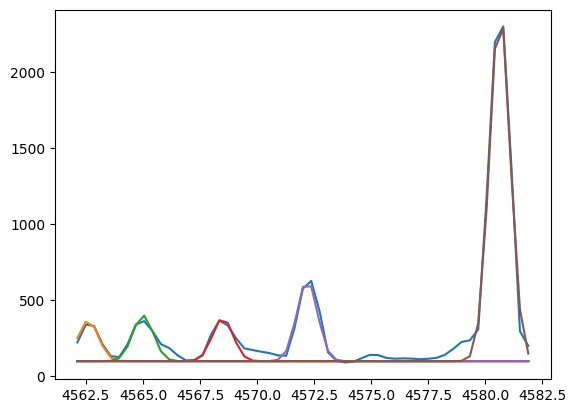

In [141]:
plt.plot(x_arc_hg, y_arc_hg)
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg,  300,  4562.6, 0, 0.45))
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg,  340,    4565, 0, 0.45))
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg,  320,  4568.5, 0, 0.45))
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg,  600,  4572.2, 0, 0.45))
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, 2600, 4580.65, 0, 0.45))

In [142]:
params_arc_hg = Parameters()
params_arc_hg.add('z', value=0.0, vary=False)
params_arc_hg.add('mu1', value= 4562.6, vary=False)
params_arc_hg.add('mu2', value=   4565, vary=False)
params_arc_hg.add('mu3', value= 4568.5, vary=False)
params_arc_hg.add('mu4', value= 4572.2, vary=False)
params_arc_hg.add('mu5', value=4580.65, vary=False)
params_arc_hg.add('arc1', value= 300, min=0.)
params_arc_hg.add('arc2', value= 340, min=0.)
params_arc_hg.add('arc3', value= 320, min=0.)
params_arc_hg.add('arc4', value= 600, min=0.)
params_arc_hg.add('arc5', value=2600, min=0.)
params_arc_hg.add('sigma', value=0.5, min=0.)
params_arc_hg.add('bkg', value=100, vary=False)

def residual_arc_hg(params_arc_hg, x, data, uncertainty):
    
    z = params_arc_hg['z']
    mu1 = params_arc_hg['mu1']
    mu2 = params_arc_hg['mu2']
    mu3 = params_arc_hg['mu3']
    mu4 = params_arc_hg['mu4']
    mu5 = params_arc_hg['mu5']
    flux1 = params_arc_hg['arc1']
    flux2 = params_arc_hg['arc2']
    flux3 = params_arc_hg['arc3']
    flux4 = params_arc_hg['arc4']
    flux5 = params_arc_hg['arc5']
    sigma = params_arc_hg['sigma']
    bkg = params_arc_hg['bkg']
    
    x = x_arc_hg
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_hg) / 10

np.random.seed(23)
out_arc_hg = minimize(residual_arc_hg, params_arc_hg, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:30<00:00, 27.68it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [66.16645968 47.68982959 50.56694227 53.38525508 57.11393479 50.78341218]


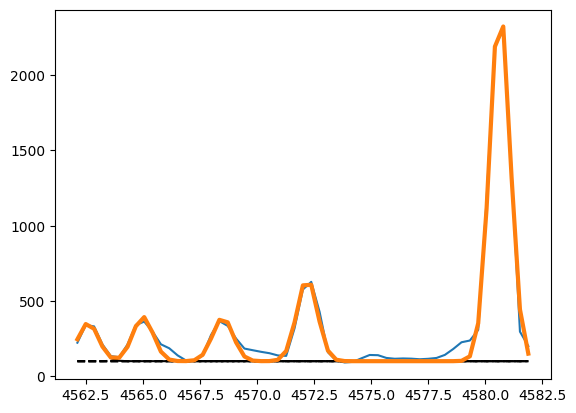

In [143]:
arc1_hg = out_arc_hg.flatchain.arc1.mean()
arc2_hg = out_arc_hg.flatchain.arc2.mean()
arc3_hg = out_arc_hg.flatchain.arc3.mean()
arc4_hg = out_arc_hg.flatchain.arc4.mean()
arc5_hg = out_arc_hg.flatchain.arc5.mean()
sigma_arc_hg = out_arc_hg.flatchain.sigma.mean()

plt.plot(x_arc_hg, y_arc_hg)

plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc1_hg,  4562.6, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc2_hg,    4565, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc3_hg,  4568.5, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc4_hg,  4572.2, 0, sigma_arc_hg), ls='--', color='black')
plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc5_hg, 4580.65, 0, sigma_arc_hg), ls='--', color='black')

plt.plot(x_arc_hg, 100 + gaussian(x_arc_hg, arc1_hg,  4562.6, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc2_hg,    4565, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc3_hg,  4568.5, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc4_hg,  4572.2, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc5_hg, 4580.65, 0, sigma_arc_hg), lw=3
)

### Line fitting

In [144]:
sigma_nar_hg = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hg**2))
sigma_brd_hg = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hg**2))

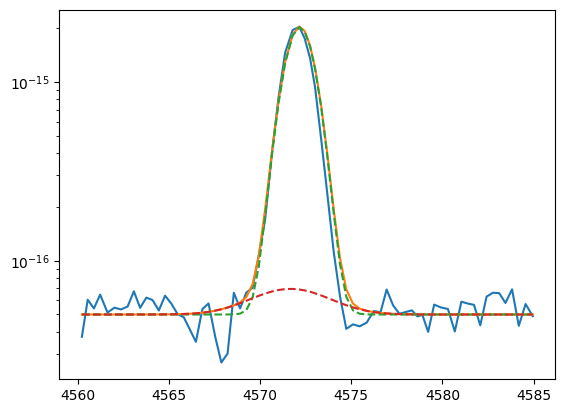

In [145]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 5e-17

hg_nar = gaussian(hgamma.wavelength, 4e-15, wave_cat['Hg'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, 1e-16, wave_cat['Hg'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

plt.plot(hgamma.wavelength, hg + bkg)
plt.plot(hgamma.wavelength, hg_nar + bkg, ls='--')
plt.plot(hgamma.wavelength, hg_brd + bkg, ls='--')
plt.yscale('log')

In [146]:
params_hg = Parameters()
params_hg.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hg.add('z_ratio', value=z_ratio, vary=False)
params_hg.add('sigma_nar', value=upy.nominal_values(sigma_nar_hg), vary=False)
params_hg.add('sigma_brd', value=upy.nominal_values(sigma_brd_hg), vary=False)
params_hg.add('Hg_nar', value=4.0e-15, min=0.)
params_hg.add('Hg_brd', value=1.0e-16, min=0.)
params_hg.add('bkg', value=5e-17, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_nar = params_hg['z_nar']
    z_brd = params_hg['z_nar'] * params_hg['z_ratio']
    sigma_nar = params_hg['sigma_nar']
    sigma_brd = params_hg['sigma_brd']
    hg_nar_flux = params_hg['Hg_nar']
    hg_brd_flux = params_hg['Hg_brd']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_nar_flux, wave_cat['Hg'], z_nar, sigma_nar) + \
            gaussian(x, hg_brd_flux, wave_cat['Hg'], z_brd, sigma_brd)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [147]:
np.random.seed(23)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:53<00:00, 46.95it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 26.9789986   30.24788818 109.7978881   43.48418462]


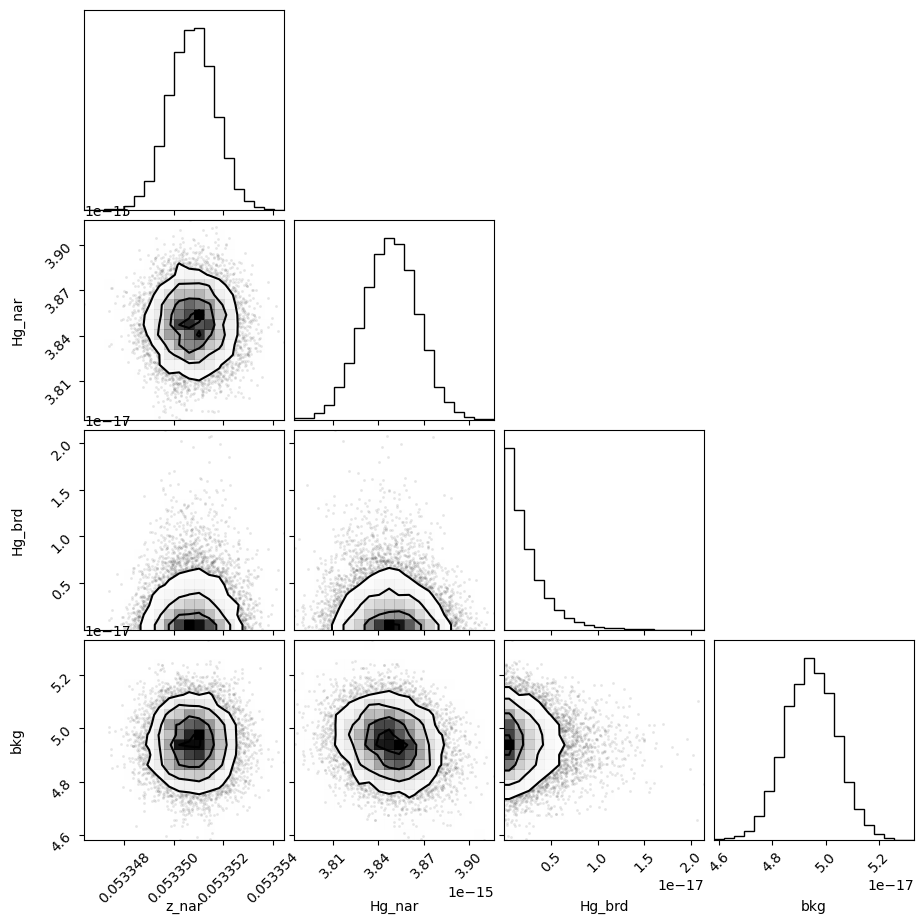

In [148]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

In [149]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05335075,9.1508e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.80721597,,,0.8072159651432347,-inf,inf,False
sigma_brd,2.03986956,,,2.039869559728985,-inf,inf,False
Hg_nar,3.8482e-15,1.7964e-17,(0.47%),4e-15,0.00000000,inf,True
Hg_brd,1.7101e-18,1.9608e-18,(114.66%),1e-16,0.00000000,inf,True
bkg,4.9450e-17,9.5946e-19,(1.94%),5e-17,0.00000000,inf,True


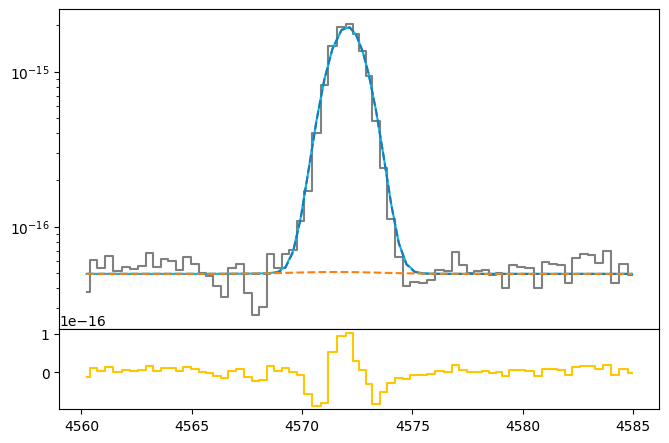

In [150]:
hg_nar_flux = out_hg.flatchain.Hg_nar.mean()
hg_nar_std = out_hg.flatchain.Hg_nar.std()

hg_brd_flux = 3 * out_hg.flatchain.Hg_brd.std()
hg_brd_std = 0.0

z_hg = out_hg.flatchain.z_nar.mean()
z_hg_std = out_hg.flatchain.z_nar.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg_nar = gaussian(hgamma.wavelength, hg_nar_flux, wave_cat['Hg'],           z_hg, upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, hg_brd_flux, wave_cat['Hg'], z_hg * z_ratio, upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.plot(hgamma.wavelength, bkg_hg + hg_nar, ls='--')
ax.plot(hgamma.wavelength, bkg_hg + hg_brd, ls='--')
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

In [151]:
# EW
EW_Hg_nar = ufloat(hg_nar_flux, hg_nar_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg_brd = ufloat(hg_brd_flux, hg_brd_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg = (ufloat(hg_nar_flux, hg_nar_std) + ufloat(hg_brd_flux, hg_brd_std)) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

### Arc lines

In [152]:
wave_cat['Hd']*(1 + z_BN[igal])

4320.61855448349

In [153]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hd = [wave_cat['Hd']*(1 + z_BN[igal]) - 9, wave_cat['Hd']*(1 + z_BN[igal]) + 5]
mask_arc_hd = (wcal_blue[8].data['wave_soln'][0] >= wlims_hd[0]) & (wcal_blue[8].data['wave_soln'][0] < wlims_hd[1])

# Arc spectra around the fitted line
x_arc_hd = wcal_blue[8].data['wave_soln'][0][mask_arc_hd]
y_arc_hd = wcal_blue[25].data[:, 3][mask_arc_hd]

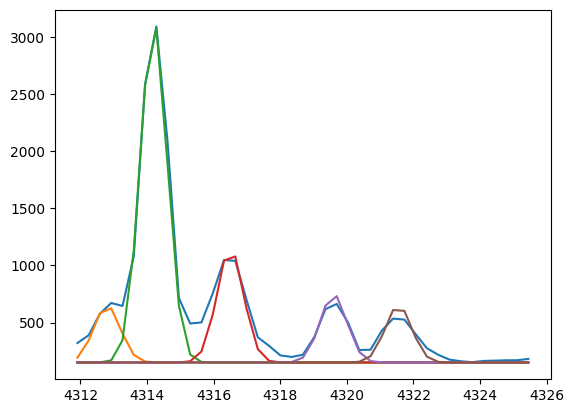

In [154]:
plt.plot(x_arc_hd, y_arc_hd)
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd,  500,  4312.8, 0, 0.4))
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, 3000,  4314.2, 0, 0.4))
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, 1000,  4316.5, 0, 0.4))
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd,  600,  4319.6, 0, 0.4))
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd,  500, 4321.55, 0, 0.4))

In [155]:
params_arc_hd = Parameters()
params_arc_hd.add('z', value=0.0, vary=False)
params_arc_hd.add('mu1', value= 4312.8, vary=False)
params_arc_hd.add('mu2', value= 4314.2, vary=False)
params_arc_hd.add('mu3', value= 4316.5, vary=False)
params_arc_hd.add('mu4', value= 4319.6, vary=False)
params_arc_hd.add('mu5', value=4321.55, vary=False)
params_arc_hd.add('arc1', value= 500, min=0.)
params_arc_hd.add('arc2', value=3000, min=0.)
params_arc_hd.add('arc3', value=1000, min=0.)
params_arc_hd.add('arc4', value= 600, min=0.)
params_arc_hd.add('arc5', value= 500, min=0.)
params_arc_hd.add('sigma', value=0.4, min=0.)
params_arc_hd.add('bkg', value=150, vary=False)

def residual_arc_hd(params_arc_hd, x, data, uncertainty):
    
    z = params_arc_hd['z']
    mu1 = params_arc_hd['mu1']
    mu2 = params_arc_hd['mu2']
    mu3 = params_arc_hd['mu3']
    mu4 = params_arc_hd['mu4']
    mu5 = params_arc_hd['mu5']
    flux1 = params_arc_hd['arc1']
    flux2 = params_arc_hd['arc2']
    flux3 = params_arc_hd['arc3']
    flux4 = params_arc_hd['arc4']
    flux5 = params_arc_hd['arc5']
    sigma = params_arc_hd['sigma']
    bkg = params_arc_hd['bkg']
    
    x = x_arc_hd
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_hd) / 10

np.random.seed(23)
out_arc_hd = minimize(residual_arc_hd, params_arc_hd, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:24<00:00, 29.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [72.27349324 71.35569415 82.75629098 86.20275838 98.05388252 77.43452875]


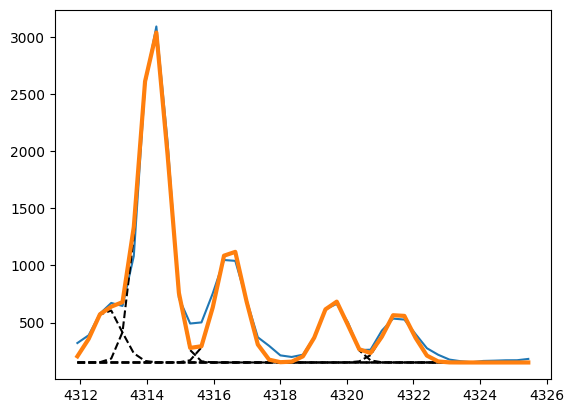

In [156]:
arc1_hd = out_arc_hd.flatchain.arc1.mean()
arc2_hd = out_arc_hd.flatchain.arc2.mean()
arc3_hd = out_arc_hd.flatchain.arc3.mean()
arc4_hd = out_arc_hd.flatchain.arc4.mean()
arc5_hd = out_arc_hd.flatchain.arc5.mean()
sigma_arc_hd = out_arc_hd.flatchain.sigma.mean()

plt.plot(x_arc_hd, y_arc_hd)

plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc1_hd,  4312.8, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc2_hd,  4314.2, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc3_hd,  4316.5, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc4_hd,  4319.6, 0, sigma_arc_hd), ls='--', color='black')
plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc5_hd, 4321.55, 0, sigma_arc_hd), ls='--', color='black')

plt.plot(x_arc_hd, 150 + gaussian(x_arc_hd, arc1_hd,  4312.8, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc2_hd,  4314.2, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc3_hd,  4316.5, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc4_hd,  4319.6, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc5_hd, 4321.55, 0, sigma_arc_hd), lw=3
)

### Line fitting

In [157]:
sigma_nar_hd = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hd**2))
sigma_brd_hd = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hd**2))

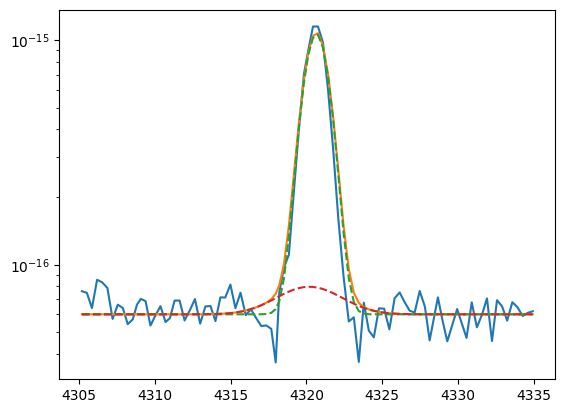

In [158]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 6e-17

hd_nar = gaussian(hdelta.wavelength, 2e-15, wave_cat['Hd'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, 1e-16, wave_cat['Hd'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

plt.plot(hdelta.wavelength, hd + bkg)
plt.plot(hdelta.wavelength, hd_nar + bkg, ls='--')
plt.plot(hdelta.wavelength, hd_brd + bkg, ls='--')
plt.yscale('log')

In [159]:
params_hd = Parameters()
params_hd.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hd.add('z_ratio', value=z_ratio, vary=False)
params_hd.add('sigma_nar', value=upy.nominal_values(sigma_nar_hd), vary=False)
params_hd.add('sigma_brd', value=upy.nominal_values(sigma_brd_hd), vary=False)
params_hd.add('Hd_nar', value=2.0e-15, min=0.)
params_hd.add('Hd_brd', value=1.0e-16, min=0.)
params_hd.add('bkg', value=6e-17, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_nar = params_hd['z_nar']
    z_brd = params_hd['z_nar'] * params_hd['z_ratio']
    sigma_nar = params_hd['sigma_nar']
    sigma_brd = params_hd['sigma_brd']
    hd_nar_flux = params_hd['Hd_nar']
    hd_brd_flux = params_hd['Hd_brd']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_nar_flux, wave_cat['Hd'], z_nar, sigma_nar) + \
            gaussian(x, hd_brd_flux, wave_cat['Hd'], z_brd, sigma_brd)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [160]:
np.random.seed(23)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:51<00:00, 48.99it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [35.83451921 59.50037482 92.69232872 44.93581522]


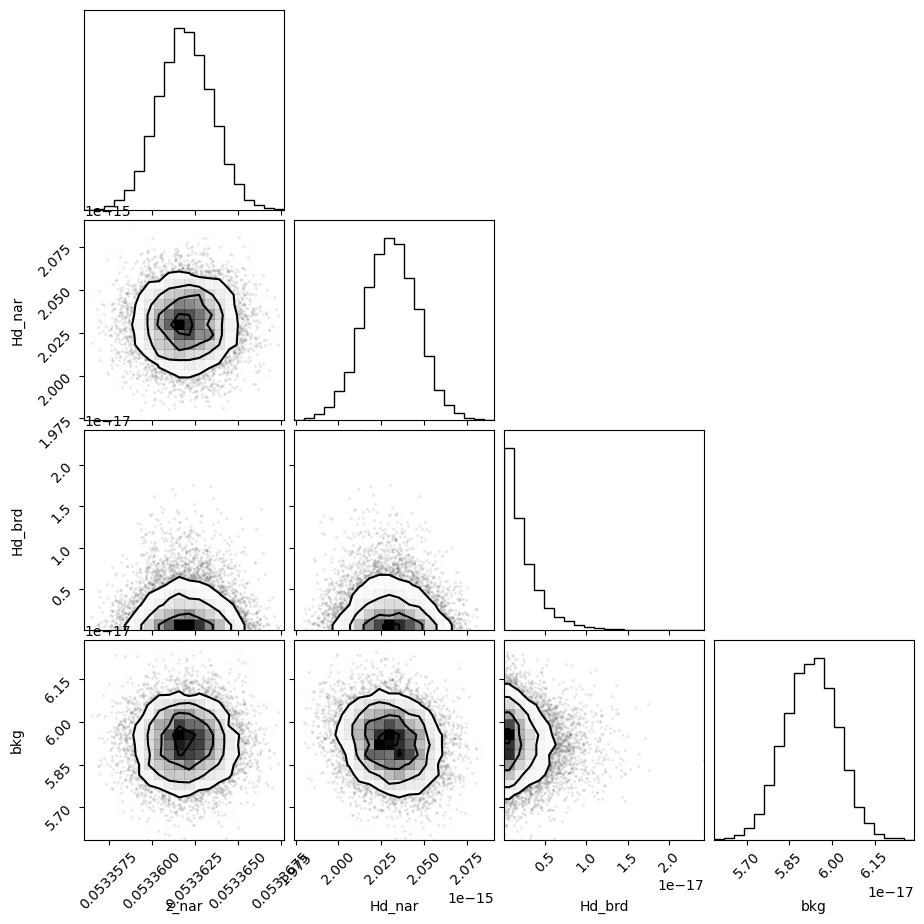

In [161]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

In [162]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05336194,1.5495e-06,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.79480522,,,0.7948052234967264,-inf,inf,False
sigma_brd,2.03499031,,,2.0349903070099575,-inf,inf,False
Hd_nar,2.0305e-15,1.5367e-17,(0.76%),2e-15,0.00000000,inf,True
Hd_brd,1.6338e-18,1.9286e-18,(118.04%),1e-16,0.00000000,inf,True
bkg,5.9282e-17,9.4044e-19,(1.59%),6e-17,0.00000000,inf,True


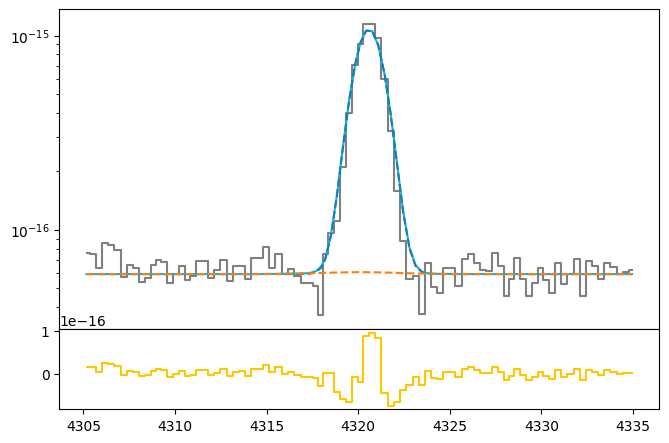

In [163]:
hd_nar_flux = out_hd.flatchain.Hd_nar.mean()
hd_nar_std = out_hd.flatchain.Hd_nar.std()

hd_brd_flux = 3 * out_hd.flatchain.Hd_brd.std()
hd_brd_std = 0.0

z_hd = out_hd.flatchain.z_nar.mean()
z_hd_std = out_hd.flatchain.z_nar.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd_nar = gaussian(hdelta.wavelength, hd_nar_flux, wave_cat['Hd'],           z_hd, upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, hd_brd_flux, wave_cat['Hd'], z_hd * z_ratio, upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.plot(hdelta.wavelength, bkg_hd + hd_nar, ls='--')
ax.plot(hdelta.wavelength, bkg_hd + hd_brd, ls='--')
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

In [164]:
# EW
EW_Hd_nar = ufloat(hd_nar_flux, hd_nar_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd_brd = ufloat(hd_brd_flux, hd_brd_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd = (ufloat(hd_nar_flux, hd_nar_std) + ufloat(hd_brd_flux, hd_brd_std)) / ufloat(bkg_hd, bkg_hd_std)

# [OII]3726 + [OII]3729

### Arc lines

In [165]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3729 = [wave_cat['[OII]3729']*(1 + z_BN[igal]) - 5, wave_cat['[OII]3729']*(1 + z_BN[igal]) + 5]
mask_arc_3729 = (wcal_blue[4].data['wave_soln'][0] >= wlims_3729[0]) & (wcal_blue[4].data['wave_soln'][0] < wlims_3729[1])

# Arc spectra around the fitted line
x_arc_3729 = wcal_blue[4].data['wave_soln'][0][mask_arc_3729]
y_arc_3729 = wcal_blue[25].data[:, 1][mask_arc_3729]

100%|███████████████████████████████████████| 2500/2500 [01:08<00:00, 36.64it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [75.17945201 20.76731829 62.81412507 61.6865987  23.75052843]


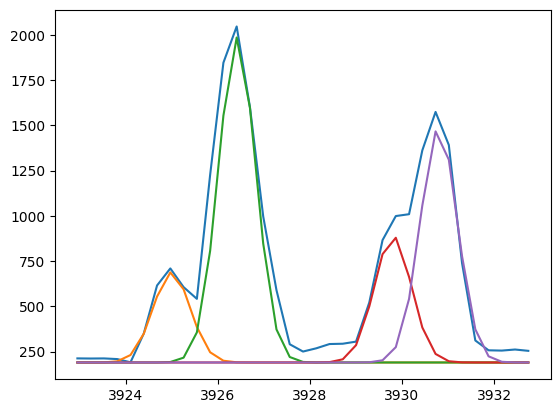

In [166]:
plt.plot(x_arc_3729, y_arc_3729)
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, 500, 3925, 0, 0.4))
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, 1800, 3926.42, 0, 0.4))
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, 700, 3929.8, 0, 0.4))
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, 1300, 3930.8, 0, 0.4))

params_arc_3729 = Parameters()
params_arc_3729.add('z', value=0.0, vary=False)
params_arc_3729.add('mu1', value=3925, vary=False)
params_arc_3729.add('mu2', value=3926.42, vary=False)
params_arc_3729.add('mu3', value=3929.8, vary=False)
params_arc_3729.add('mu4', value=3930.8, vary=False)
params_arc_3729.add('arc1', value=500, min=0.)
params_arc_3729.add('arc2', value=1800, min=0.)
params_arc_3729.add('arc3', value=7000, min=0.)
params_arc_3729.add('arc4', value=1300, min=0.)
params_arc_3729.add('sigma', value=0.4, min=0.)
params_arc_3729.add('bkg', value=190, vary=False)

def residual_arc_3729(params_arc_3729, x, data, uncertainty):
    
    z = params_arc_3729['z']
    mu1 = params_arc_3729['mu1']
    mu2 = params_arc_3729['mu2']
    mu3 = params_arc_3729['mu3']
    mu4 = params_arc_3729['mu4']
    flux1 = params_arc_3729['arc1']
    flux2 = params_arc_3729['arc2']
    flux3 = params_arc_3729['arc3']
    flux4 = params_arc_3729['arc4']
    sigma = params_arc_3729['sigma']
    bkg = params_arc_3729['bkg']
    
    x = x_arc_3729
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_3729) / 10

np.random.seed(23)
out_arc_3729 = minimize(residual_arc_3729, params_arc_3729, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

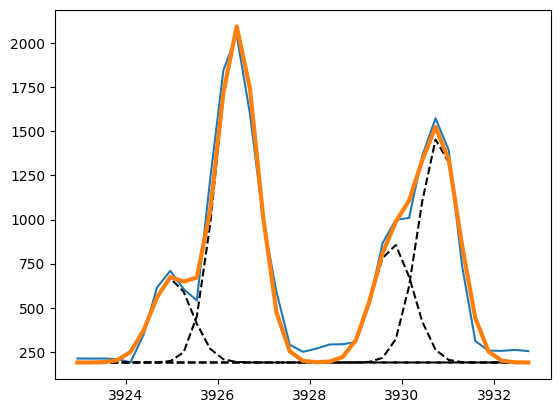

In [167]:
arc1_3729 = out_arc_3729.flatchain.arc1.mean()
arc2_3729 = out_arc_3729.flatchain.arc2.mean()
arc3_3729 = out_arc_3729.flatchain.arc3.mean()
arc4_3729 = out_arc_3729.flatchain.arc4.mean()
sigma_arc_3729 = out_arc_3729.flatchain.sigma.mean()

plt.plot(x_arc_3729, y_arc_3729)

plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, arc1_3729, 3925, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, arc2_3729, 3926.42, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, arc3_3729, 3929.8, 0, sigma_arc_3729), ls='--', color='black')
plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, arc4_3729, 3930.8, 0, sigma_arc_3729), ls='--', color='black')

plt.plot(x_arc_3729, 190 + gaussian(x_arc_3729, arc1_3729, 3925, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc2_3729, 3926.42, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc3_3729, 3929.8, 0, sigma_arc_3729) \
         + gaussian(x_arc_3729, arc4_3729, 3930.8, 0, sigma_arc_3729), lw=3
)

### Line fitting

In [168]:
sigma_nar_3729 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3729**2))
sigma_brd_3729 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3729**2))

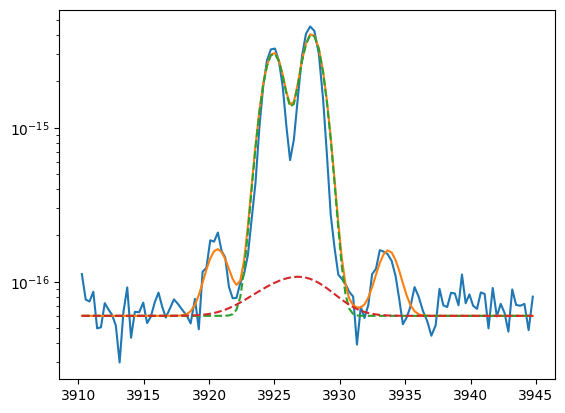

In [169]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 0.2e-15, wave_cat['H13'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, 0.8e-14, wave_cat['[OII]3729'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, 0.2e-15, wave_cat['[OII]3729'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, 0.6e-14, wave_cat['[OII]3726'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, 0.1e-15, wave_cat['[OII]3726'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, 0.2e-15, wave_cat['H14'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

bkg = 6e-17

plt.plot(oii_3727.wavelength, bkg + oiid + oiic + h13 + h14)
plt.plot(oii_3727.wavelength, bkg + oiid_nar + oiic_nar, ls='--')
plt.plot(oii_3727.wavelength, bkg + oiid_brd + oiic_brd, ls='--')

plt.yscale('log')

In [170]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_3727.add('z_ratio', value=z_ratio, vary=False)
params_oii_3727.add('sigma_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('H13', value=0.2e-15, min=0.)
params_oii_3727.add('Oiic_nar', value=0.8e-14, min=0.)
params_oii_3727.add('Oiic_brd', value=0.2e-15, min=0.)
params_oii_3727.add('Oiid_nar', value=0.6e-14, min=0.)
params_oii_3727.add('Oiid_brd', value=0.1e-15, min=0.)
params_oii_3727.add('H14', value=0.2e-15, min=0.)
params_oii_3727.add('bkg', value=6e-17, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_nar = params_oii_3727['z_nar']
    z_brd = params_oii_3727['z_nar'] * params_oii_3727['z_ratio']
    sigma_nar = params_oii_3727['sigma_nar']
    sigma_brd = params_oii_3727['sigma_brd']
    
    h13_flux = params_oii_3727['H13']
    oiic_nar_flux = params_oii_3727['Oiic_nar']
    oiic_brd_flux = params_oii_3727['Oiic_brd']
    oiid_nar_flux = params_oii_3727['Oiid_nar']
    oiid_brd_flux = params_oii_3727['Oiid_brd']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_nar, sigma_nar)
    model_oiic = gaussian(x, oiic_nar_flux, wave_cat['[OII]3729'], z_nar, sigma_nar) + \
                 gaussian(x, oiic_brd_flux, wave_cat['[OII]3729'], z_brd, sigma_brd)
    model_oiid = gaussian(x, oiid_nar_flux, wave_cat['[OII]3726'], z_nar, sigma_nar) + \
                 gaussian(x, oiid_brd_flux, wave_cat['[OII]3726'], z_brd, sigma_brd)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_nar, sigma_nar)
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [171]:
np.random.seed(23)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:03<00:00, 39.43it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 23.17698479  72.51496331  67.44055526 167.26844477  39.60608468
 181.4508377  171.33592283  77.6669545 ]


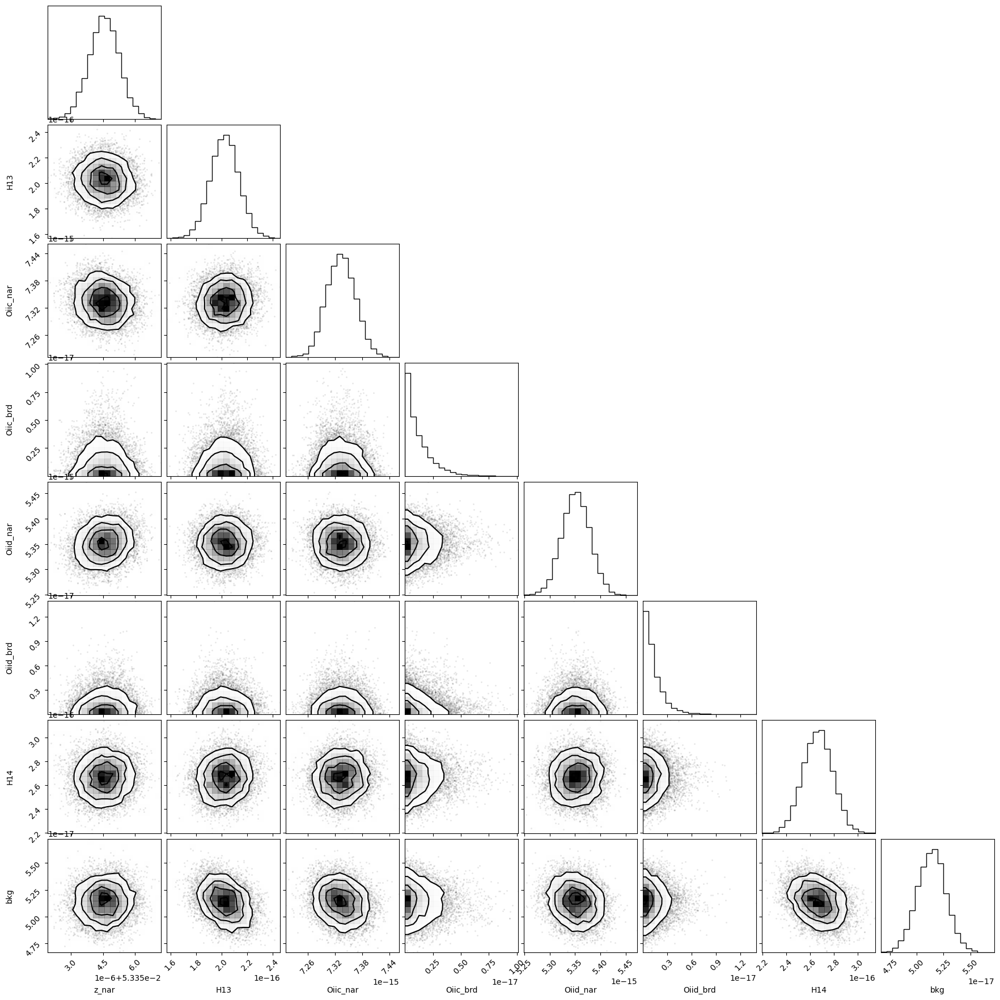

In [172]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);

In [173]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05335456,6.9781e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.80114371,,,0.8011437125017011,-inf,inf,False
sigma_brd,2.03747428,,,2.0374742831279633,-inf,inf,False
H13,2.0253e-16,1.0988e-17,(5.43%),2e-16,0.00000000,inf,True
Oiic_nar,7.3332e-15,3.2026e-17,(0.44%),8e-15,0.00000000,inf,True
Oiic_brd,8.4875e-19,1.0571e-18,(124.55%),2e-16,0.00000000,inf,True
Oiid_nar,5.3515e-15,2.7059e-17,(0.51%),6e-15,0.00000000,inf,True
Oiid_brd,9.3786e-19,1.0246e-18,(109.25%),1e-16,0.00000000,inf,True
H14,2.6651e-16,1.2492e-17,(4.69%),2e-16,0.00000000,inf,True


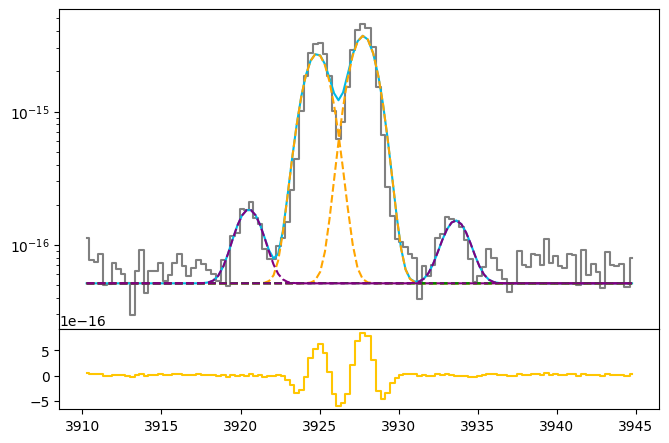

In [174]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_nar_flux = out_oii_3727.flatchain.Oiic_nar.mean()
oiic_nar_std = out_oii_3727.flatchain.Oiic_nar.std()

oiic_brd_flux = out_oii_3727.flatchain.Oiic_brd.mean()
oiic_brd_std = out_oii_3727.flatchain.Oiic_brd.std()

oiid_nar_flux = out_oii_3727.flatchain.Oiid_nar.mean()
oiid_nar_std = out_oii_3727.flatchain.Oiid_nar.std()

oiid_brd_flux = out_oii_3727.flatchain.Oiid_brd.mean()
oiid_brd_std = out_oii_3727.flatchain.Oiid_brd.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_nar.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_nar.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13, ls='--', color='purple')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h14, ls='--', color='purple')

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14, color=c[3], where='mid')

In [175]:
# EW
EW_OII_3729_nar = ufloat(oiic_nar_flux, oiic_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729_brd = ufloat(oiic_brd_flux, oiic_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729 = (ufloat(oiic_nar_flux, oiic_nar_std) + ufloat(oiic_brd_flux, oiic_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

EW_OII_3726_nar = ufloat(oiid_nar_flux, oiid_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726_brd = ufloat(oiid_brd_flux, oiid_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = (ufloat(oiid_nar_flux, oiid_nar_std) + ufloat(oiid_brd_flux, oiid_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

# [SIII]9532

### Arc lines

In [176]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9532 = [wave_cat['[SIII]9532']*(1 + z_BN[igal]) - 5, wave_cat['[SIII]9532']*(1 + z_BN[igal]) + 30]
mask_arc_9532 = (wcal_red[20].data['wave_soln'][0] >= wlims_9532[0]) & (wcal_red[20].data['wave_soln'][0] < wlims_9532[1])

# Arc spectra around the fitted line
x_arc_9532 = wcal_red[20].data['wave_soln'][0][mask_arc_9532]
y_arc_9532 = wcal_red[23].data[:, 9][mask_arc_9532]

100%|███████████████████████████████████████| 2500/2500 [00:28<00:00, 86.62it/s]


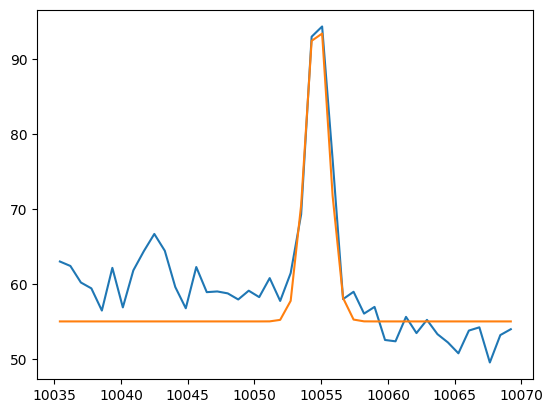

In [177]:
plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, 55 + gaussian(x_arc_9532, 90, 10054.7, 0, 0.85))

params_arc_9532 = Parameters()
params_arc_9532.add('z', value=0.0, vary=False)
params_arc_9532.add('mu', value=10054.7, vary=False)
params_arc_9532.add('arc', value=90, min=0.)
params_arc_9532.add('sigma', value=0.85, min=0.)
params_arc_9532.add('bkg', value=55, vary=True)

def residual_arc_9532(params_arc_9532, x, data, uncertainty):
    
    z = params_arc_9532['z']
    mu = params_arc_9532['mu']
    flux = params_arc_9532['arc']
    sigma = params_arc_9532['sigma']
    bkg = params_arc_9532['bkg']
    
    x = x_arc_9532
    model = gaussian(x, flux, mu, z, sigma)
    model = bkg + model
    return (model - y_arc_9532) / 10

np.random.seed(23)
out_arc_9532 = minimize(residual_arc_9532, params_arc_9532, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

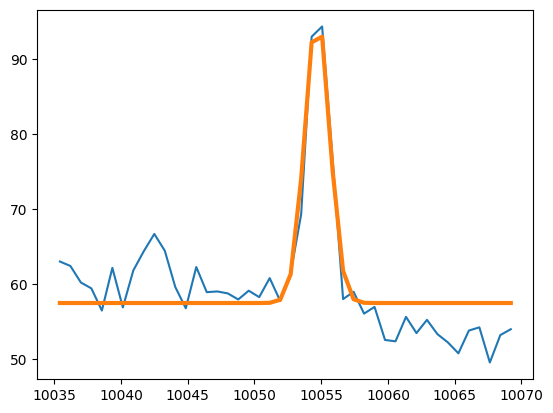

In [178]:
arc_9532 = out_arc_9532.params['arc'].value
sigma_arc_9532 = out_arc_9532.params['sigma'].value
bkg_9532 = out_arc_9532.params['bkg'].value

plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, bkg_9532 + gaussian(x_arc_9532, arc_9532, 10054.7, 0, sigma_arc_9532), lw=3)

### Line fitting

In [179]:
sigma_nar_9532 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9532**2))
sigma_brd_9532 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9532**2))

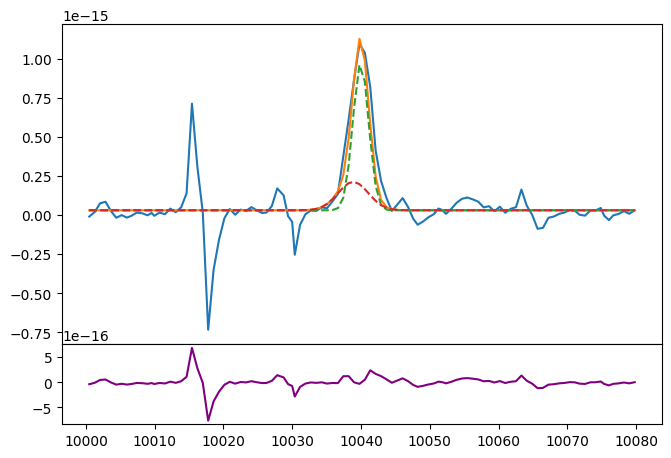

In [180]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9532.wavelength, siii_9532.flux)
bkg = 3e-17

siiia_nar = gaussian(siii_9532.wavelength, 2.7e-15, wave_cat['[SIII]9532'], z=z_nar_oiii_4959+0.00001, sigma=upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, 1e-15, wave_cat['[SIII]9532'], z=z_brd_oiii_4959+0.00001, sigma=upy.nominal_values(sigma_brd_9532))

ax.plot(siii_9532.wavelength, bkg + siiia_nar + siiia_brd)
ax.plot(siii_9532.wavelength, bkg + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg + siiia_brd, ls='--')
ax1.plot(siii_9532.wavelength, siii_9532.flux - bkg - siiia_nar - siiia_brd, color='purple')
#ax.set_yscale('log')

In [181]:
params_siiia = Parameters()
params_siiia.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiia.add('z_ratio', value=z_ratio, vary=False)
params_siiia.add('sigma_nar', value=upy.nominal_values(sigma_nar_9532), vary=False)
params_siiia.add('sigma_brd', value=upy.nominal_values(sigma_brd_9532), vary=False)
params_siiia.add('Siiia_nar', value=2.5e-15, min=0.)
params_siiia.add('Siiia_brd', value=2.0e-15, min=0.)
params_siiia.add('bkg', value=3e-17, min=0.)


def residual_siiia(params_siiia, x, data, uncertainty):
    
    z_nar = params_siiia['z_nar']
    z_brd = params_siiia['z_nar'] * params_siiia['z_ratio']
    sigma_nar = params_siiia['sigma_nar']
    sigma_brd = params_siiia['sigma_brd']
    siiia_nar_flux = params_siiia['Siiia_nar']
    siiia_brd_flux = params_siiia['Siiia_brd']
    bkg = params_siiia['bkg']
    
    x = siii_9532.wavelength
    model = gaussian(x, siiia_nar_flux, wave_cat['[SIII]9532'], z_nar, sigma_nar) + \
            gaussian(x, siiia_brd_flux, wave_cat['[SIII]9532'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9532.flux) / siii_9532.noise

In [182]:
np.random.seed(23)
out_siiia = minimize(residual_siiia, params_siiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:39<00:00, 63.66it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [36.56428642 45.36049302 42.64255583 71.92161842]


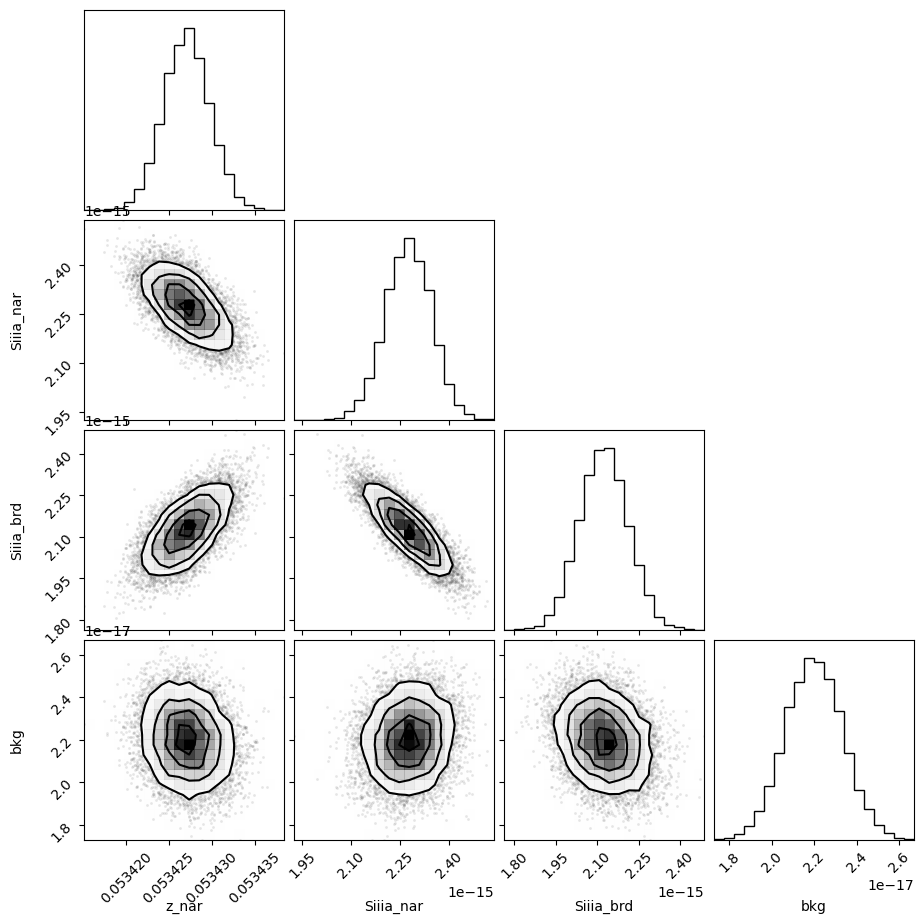

In [183]:
corner.corner(out_siiia.flatchain, labels=out_siiia.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [184]:
out_siiia.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05342707,2.6558e-06,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,1.14285138,,,1.14285138137041,-inf,inf,False
sigma_brd,2.19444286,,,2.194442864653134,-inf,inf,False
Siiia_nar,2.2762e-15,6.9770e-17,(3.07%),2.5e-15,0.00000000,inf,True
Siiia_brd,2.1235e-15,8.7918e-17,(4.14%),2e-15,0.00000000,inf,True
bkg,2.1985e-17,1.3360e-18,(6.08%),3e-17,0.00000000,inf,True


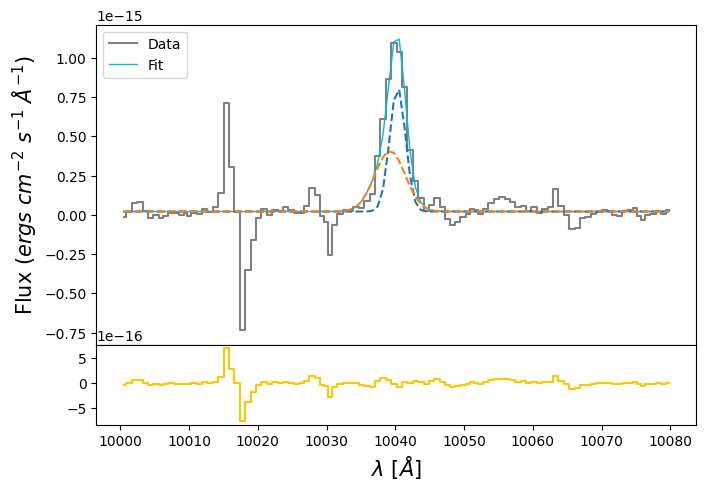

In [185]:
siiia_nar_flux = out_siiia.flatchain.Siiia_nar.mean()
siiia_nar_std = out_siiia.flatchain.Siiia_nar.std()

siiia_brd_flux = out_siiia.flatchain.Siiia_brd.mean()
siiia_brd_std = out_siiia.flatchain.Siiia_brd.std()

z_siiia = out_siiia.flatchain.z_nar.mean()
z_siiia_std = out_siiia.flatchain.z_nar.std()

bkg_siiia = out_siiia.flatchain.bkg.mean()
bkg_siiia_std = out_siiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9532.wavelength, siii_9532.flux,
            color='gray', label='Data', where='mid')

siiia_nar = gaussian(siii_9532.wavelength, siiia_nar_flux, wave_cat['[SIII]9532'], z_siiia, upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, siiia_brd_flux, wave_cat['[SIII]9532'], z_siiia * z_ratio, upy.nominal_values(sigma_brd_9532))
siiia = siiia_nar + siiia_brd

ax.plot(siii_9532.wavelength, bkg_siiia + siiia, lw=1, color=c[0], label='Fit')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_brd, ls='--')
ax1.step(siii_9532.wavelength, siii_9532.flux - bkg_siiia - siiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [186]:
# EW
EW_SIII_9532_nar = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532_brd = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532 = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)

# [SIII]9069

### Arc lines

In [187]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9069 = [wave_cat['[SIII]9069']*(1 + z_BN[igal]) - 10, wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 20]
mask_arc_9069 = (wcal_red[20].data['wave_soln'][0] >= wlims_9069[0]) & (wcal_red[20].data['wave_soln'][0] < wlims_9069[1])

# Arc spectra around the fitted line
x_arc_9069 = wcal_red[20].data['wave_soln'][0][mask_arc_9069]
y_arc_9069 = wcal_red[23].data[:, 9][mask_arc_9069]

100%|███████████████████████████████████████| 2500/2500 [00:27<00:00, 90.02it/s]


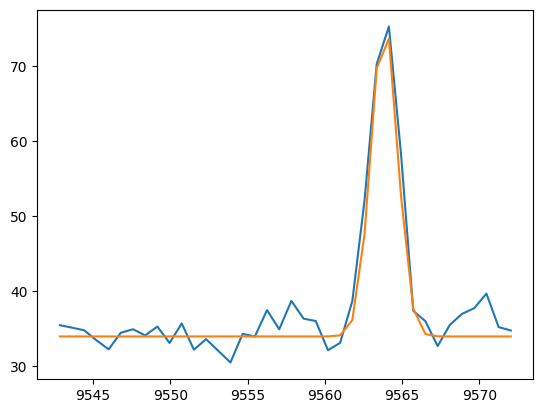

In [188]:
plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, 34 + gaussian(x_arc_9069, 90, 9563.85, 0, 0.85))

params_arc_9069 = Parameters()
params_arc_9069.add('z', value=0.0, vary=False)
params_arc_9069.add('mu', value=9563.85, vary=False)
params_arc_9069.add('arc', value=90, min=0.)
params_arc_9069.add('sigma', value=0.85, min=0.)
params_arc_9069.add('bkg', value=34, vary=False)

def residual_arc_9069(params_arc_9069, x, data, uncertainty):
    
    z = params_arc_9069['z']
    mu = params_arc_9069['mu']
    flux = params_arc_9069['arc']
    sigma = params_arc_9069['sigma']
    bkg = params_arc_9069['bkg']
    
    x = x_arc_9069
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_9069) / 10

np.random.seed(23)
out_arc_9069 = minimize(residual_arc_9069, params_arc_9069, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

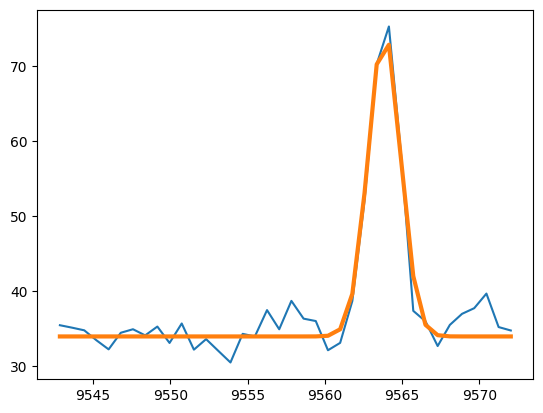

In [189]:
arc_9069 = out_arc_9069.params['arc'].value
sigma_arc_9069 = out_arc_9069.params['sigma'].value

plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, 34 + gaussian(x_arc_9069, arc_9069, 9563.85, 0, sigma_arc_9069), lw=3)

### Line fitting

In [190]:
sigma_nar_9069 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9069**2))
sigma_brd_9069 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9069**2))

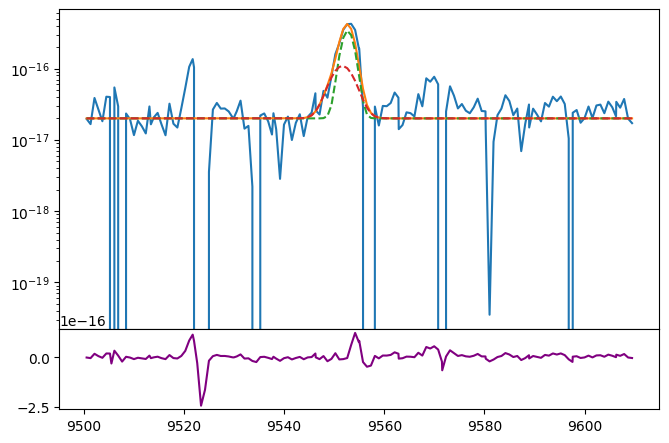

In [191]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9069.wavelength, siii_9069.flux)
bkg = 2e-17

siiib_nar = gaussian(siii_9069.wavelength, 10e-16, wave_cat['[SIII]9069'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, 5e-16, wave_cat['[SIII]9069'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9069))

ax.plot(siii_9069.wavelength, bkg + siiib_nar + siiib_brd)
ax.plot(siii_9069.wavelength, bkg + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg + siiib_brd, ls='--')
ax1.plot(siii_9069.wavelength, siii_9069.flux - bkg - siiib_nar - siiib_brd, color='purple')
ax.set_yscale('log')

In [192]:
params_siiib = Parameters()
params_siiib.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiib.add('z_ratio', value=z_ratio, vary=False)
params_siiib.add('sigma_nar', value=upy.nominal_values(sigma_nar_9069), vary=False)
params_siiib.add('sigma_brd', value=upy.nominal_values(sigma_brd_9069), vary=False)
params_siiib.add('Siiib_nar', value=1.0e-15, min=0.)
params_siiib.add('Siiib_brd', value=5.0e-16, min=0.)
params_siiib.add('bkg', value=2e-17, min=0.)


def residual_siiib(params_siiib, x, data, uncertainty):
    
    z_nar = params_siiib['z_nar']
    z_brd = params_siiib['z_nar'] * params_siiib['z_ratio']
    sigma_nar = params_siiib['sigma_nar']
    sigma_brd = params_siiib['sigma_brd']
    siiib_nar_flux = params_siiib['Siiib_nar']
    siiib_brd_flux = params_siiib['Siiib_brd']
    bkg = params_siiib['bkg']
    
    x = siii_9069.wavelength
    model = gaussian(x, siiib_nar_flux, wave_cat['[SIII]9069'], z_nar, sigma_nar) + \
            gaussian(x, siiib_brd_flux, wave_cat['[SIII]9069'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9069.flux) / siii_9069.noise

In [193]:
np.random.seed(23)
out_siiib = minimize(residual_siiib, params_siiib, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:34<00:00, 71.85it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [47.1190211  48.42437277 62.23230166 63.94186542]


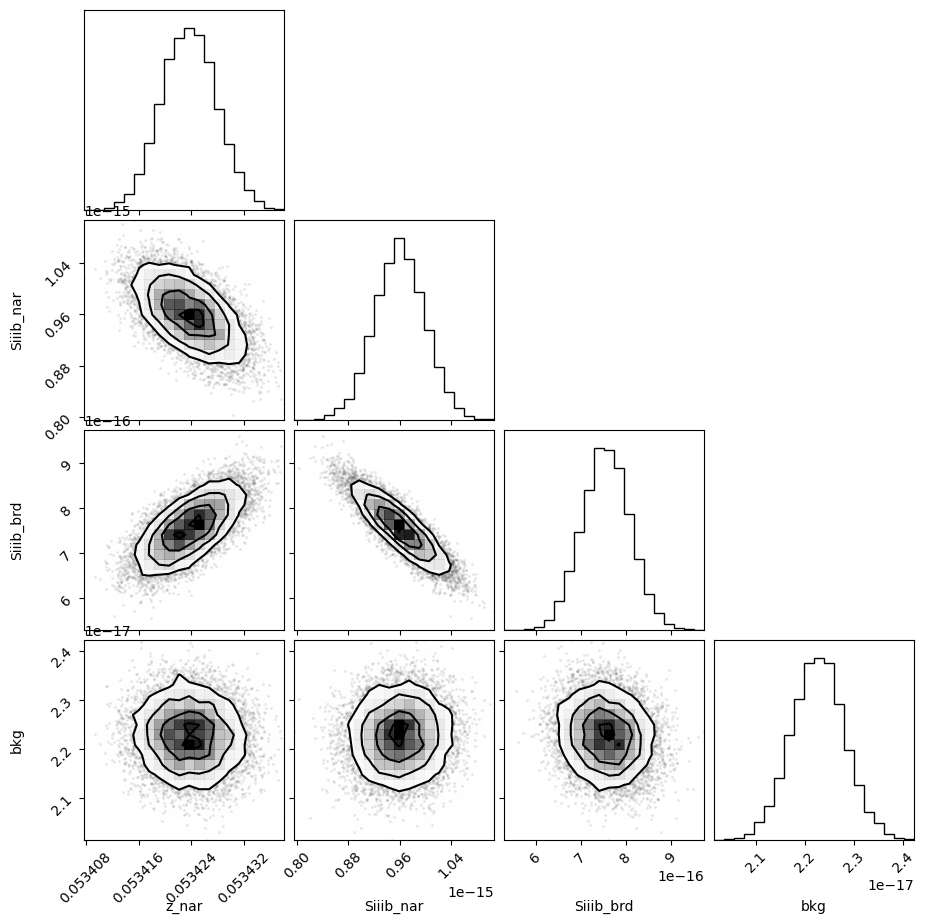

In [194]:
corner.corner(out_siiib.flatchain, labels=out_siiib.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [195]:
out_siiib.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05342372,4.1769e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,1.24044574,,,1.2404457448738488,-inf,inf,False
sigma_brd,2.24681460,,,2.2468146012304704,-inf,inf,False
Siiib_nar,9.5985e-16,3.9309e-17,(4.10%),1e-15,0.00000000,inf,True
Siiib_brd,7.5666e-16,5.3602e-17,(7.08%),5e-16,0.00000000,inf,True
bkg,2.2268e-17,5.3465e-19,(2.40%),2e-17,0.00000000,inf,True


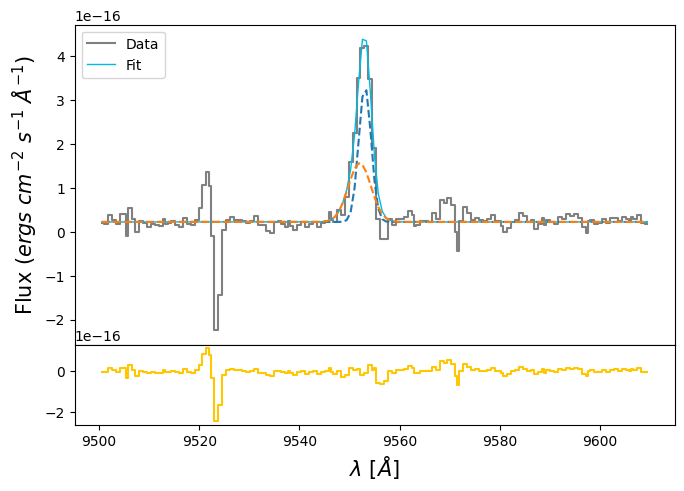

In [196]:
siiib_nar_flux = out_siiib.flatchain.Siiib_nar.mean()
siiib_nar_std = out_siiib.flatchain.Siiib_nar.std()

siiib_brd_flux = out_siiib.flatchain.Siiib_brd.mean()
siiib_brd_std = out_siiib.flatchain.Siiib_brd.std()

z_siiib = out_siiib.flatchain.z_nar.mean()
z_siiib_std = out_siiib.flatchain.z_nar.std()

bkg_siiib = out_siiib.flatchain.bkg.mean()
bkg_siiib_std = out_siiib.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9069.wavelength, siii_9069.flux,
            color='gray', label='Data', where='mid')

siiib_nar = gaussian(siii_9069.wavelength, siiib_nar_flux, wave_cat['[SIII]9069'], z_siiib, upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, siiib_brd_flux, wave_cat['[SIII]9069'], z_siiib * z_ratio, upy.nominal_values(sigma_brd_9069))
siiib = siiib_nar + siiib_brd

ax.plot(siii_9069.wavelength, bkg_siiib + siiib, lw=1, color=c[0], label='Fit')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_brd, ls='--')
ax1.step(siii_9069.wavelength, siii_9069.flux - bkg_siiib - siiib, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [197]:
# EW
EW_SIII_9069_nar = ufloat(siiib_nar_flux, siiib_nar_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069_brd = ufloat(siiib_brd_flux, siiib_brd_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069 = (ufloat(siiib_nar_flux, siiib_nar_std) + ufloat(siiib_brd_flux, siiib_brd_std)) / ufloat(bkg_siiib, bkg_siiib_std)

# [OI]6300 + [SIII]6312

### Arc lines

In [198]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6312 = [wave_cat['[SIII]6312']*(1 + z_BN[igal]) - 10, wave_cat['[SIII]6312']*(1 + z_BN[igal]) + 10]
mask_arc_6312 = (wcal_red[14].data['wave_soln'][0] >= wlims_6312[0]) & (wcal_red[14].data['wave_soln'][0] < wlims_6312[1])

# Arc spectra around the fitted line
x_arc_6312 = wcal_red[14].data['wave_soln'][0][mask_arc_6312]
y_arc_6312 = wcal_red[23].data[:, 6][mask_arc_6312]

100%|███████████████████████████████████████| 2500/2500 [00:34<00:00, 72.26it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [69.96438323 56.82614945 43.45037814 35.74578022 64.10734893]


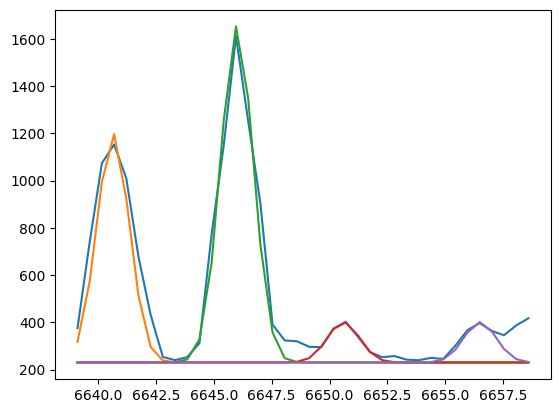

In [199]:
plt.plot(x_arc_6312, y_arc_6312)
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, 1700, 6640.65, 0, 0.7))
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, 2500, 6646, 0, 0.7))
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, 300, 6650.6, 0, 0.7))
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, 300, 6656.5, 0, 0.7))

params_arc_6312 = Parameters()
params_arc_6312.add('z', value=0.0, vary=False)
params_arc_6312.add('mu1', value=6640.65, vary=False)
params_arc_6312.add('mu2', value=6646, vary=False)
params_arc_6312.add('mu3', value=6650.6, vary=False)
params_arc_6312.add('mu4', value=6656.5, vary=False)
params_arc_6312.add('arc1', value=1700, min=0.)
params_arc_6312.add('arc2', value=2500, min=0.)
params_arc_6312.add('arc3', value=300, min=0.)
params_arc_6312.add('arc4', value=300, min=0.)
params_arc_6312.add('sigma', value=0.7, min=0.)
params_arc_6312.add('bkg', value=230, vary=False)

def residual_arc_6312(params_arc_6312, x, data, uncertainty):
    
    z = params_arc_6312['z']
    mu1 = params_arc_6312['mu1']
    mu2 = params_arc_6312['mu2']
    mu3 = params_arc_6312['mu3']
    mu4 = params_arc_6312['mu4']
    flux1 = params_arc_6312['arc1']
    flux2 = params_arc_6312['arc2']
    flux3 = params_arc_6312['arc3']
    flux4 = params_arc_6312['arc4']
    sigma = params_arc_6312['sigma']
    bkg = params_arc_6312['bkg']
    
    x = x_arc_6312
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_6312) / 10

np.random.seed(23)
out_arc_6312 = minimize(residual_arc_6312, params_arc_6312, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

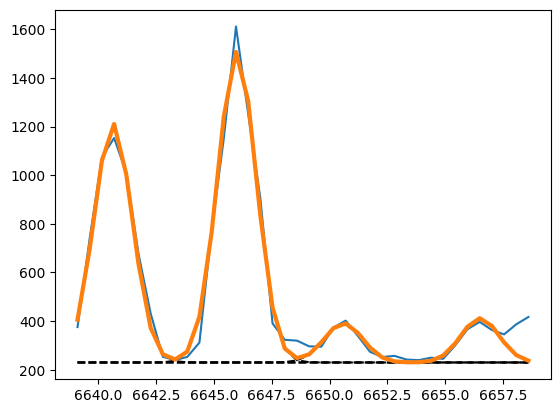

In [200]:
arc1_6312 = out_arc_6312.flatchain.arc1.mean()
arc2_6312 = out_arc_6312.flatchain.arc2.mean()
arc3_6312 = out_arc_6312.flatchain.arc3.mean()
arc4_6312 = out_arc_6312.flatchain.arc4.mean()
sigma_arc_6312 = out_arc_6312.flatchain.sigma.mean()

plt.plot(x_arc_6312, y_arc_6312)

plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, arc1_6312, 6640.65, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, arc2_6312, 6646, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, arc3_6312, 6650.6, 0, sigma_arc_6312), ls='--', color='black')
plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, arc4_6312, 6656.5, 0, sigma_arc_6312), ls='--', color='black')

plt.plot(x_arc_6312, 230 + gaussian(x_arc_6312, arc1_6312, 6640.65, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc2_6312, 6646, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc3_6312, 6650.6, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc4_6312, 6656.5, 0, sigma_arc_6312), lw=3
)

### Line fitting

In [201]:
sigma_nar_6312 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6312**2))
sigma_brd_6312 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6312**2))

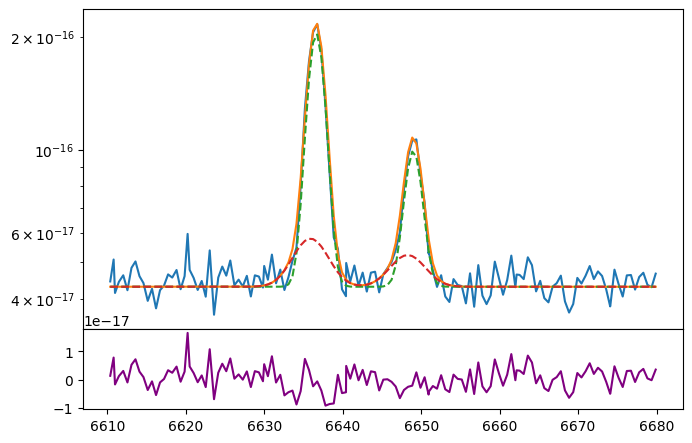

In [202]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 4.3e-17

oi_nar = gaussian(oi_siii.wavelength, 4.3e-16, wave_cat['[OI]6300'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, 8e-17, wave_cat['[OI]6300'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, 1.5e-16, wave_cat['[SIII]6312'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, 5e-17, wave_cat['[SIII]6312'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_nar + siiic_brd + oi_nar + oi_brd)
ax.plot(oi_siii.wavelength, bkg + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg + siiic_brd + oi_brd, ls='--')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_nar - siiic_brd - oi_nar - oi_brd, color='purple')
ax.set_yscale('log')

In [203]:
params_oi_siii = Parameters()
params_oi_siii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oi_siii.add('z_ratio', value=z_ratio, vary=False)
params_oi_siii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('Oi_nar', value=4.3e-16, min=0.)
params_oi_siii.add('Oi_brd', value=0.8e-16, min=0.)
params_oi_siii.add('Siiic_nar', value=1.5e-16, min=0.)
params_oi_siii.add('Siiic_brd', value=0.5e-16, min=0.)
params_oi_siii.add('bkg', value=4.3e-17, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_nar = params_oi_siii['z_nar']
    z_brd = params_oi_siii['z_nar'] * params_oi_siii['z_ratio']
    sigma_nar = params_oi_siii['sigma_nar']
    sigma_brd = params_oi_siii['sigma_brd']
    oi_nar = params_oi_siii['Oi_nar']
    oi_brd = params_oi_siii['Oi_brd']
    siiic_nar = params_oi_siii['Siiic_nar']
    siiic_brd = params_oi_siii['Siiic_brd']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_nar, wave_cat['[OI]6300'], z_nar, sigma_nar) \
             + gaussian(x, oi_brd, wave_cat['[OI]6300'], z_brd, sigma_brd)
    model_siii = gaussian(x, siiic_nar, wave_cat['[SIII]6312'], z_nar, sigma_nar) \
               + gaussian(x, siiic_brd, wave_cat['[SIII]6312'], z_brd, sigma_brd)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [204]:
np.random.seed(23)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:31<00:00, 78.19it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [65.37461311 80.72687778 99.43295628 65.70016832 84.10095389 75.25795906]


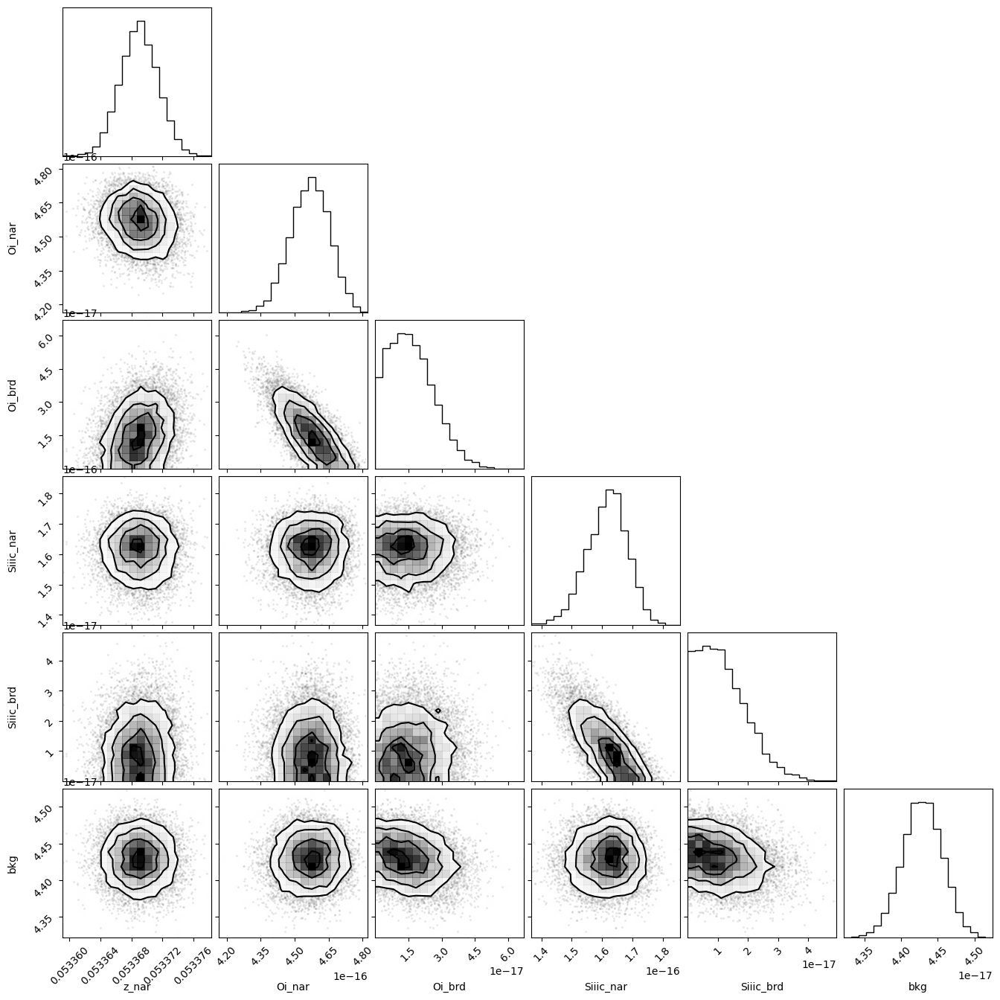

In [205]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [206]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05336899,2.4928e-06,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,1.06456164,,,1.0645616400442657,-inf,inf,False
sigma_brd,2.15470687,,,2.154706869107846,-inf,inf,False
Oi_nar,4.5704e-16,8.6889e-18,(1.90%),4.3e-16,0.00000000,inf,True
Oi_brd,1.5291e-17,1.0581e-17,(69.20%),8e-17,0.00000000,inf,True
Siiic_nar,1.6197e-16,6.7368e-18,(4.16%),1.5e-16,0.00000000,inf,True
Siiic_brd,1.0597e-17,8.3412e-18,(78.71%),5e-17,0.00000000,inf,True
bkg,4.4291e-17,2.7061e-19,(0.61%),4.3e-17,0.00000000,inf,True


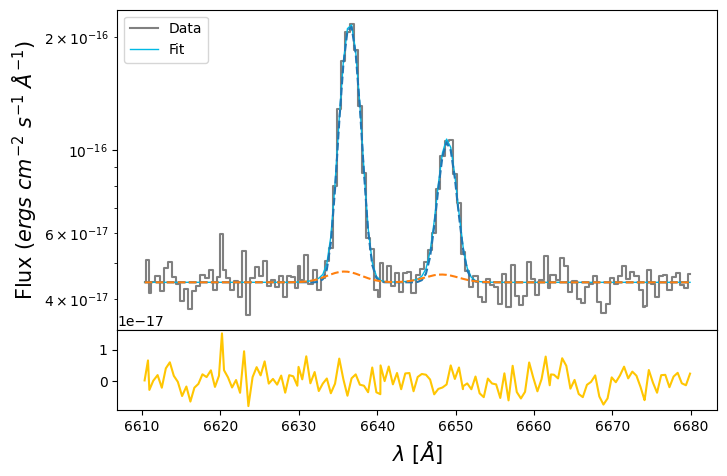

In [207]:
oi_nar_flux = out_oi_siii.flatchain.Oi_nar.mean()
oi_nar_std = out_oi_siii.flatchain.Oi_nar.std()

oi_brd_flux = out_oi_siii.flatchain.Oi_brd.mean()
oi_brd_std = out_oi_siii.flatchain.Oi_brd.std()

siiic_nar_flux = out_oi_siii.flatchain.Siiic_nar.mean()
siiic_nar_std = out_oi_siii.flatchain.Siiic_nar.std()

siiic_brd_flux = out_oi_siii.flatchain.Siiic_brd.mean()
siiic_brd_std = out_oi_siii.flatchain.Siiic_brd.std()

z_oi_siii = out_oi_siii.flatchain.z_nar.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_nar.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oi_nar = gaussian(oi_siii.wavelength, oi_nar_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, oi_brd_flux, wave_cat['[OI]6300'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, siiic_nar_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, siiic_brd_flux, wave_cat['[SIII]6312'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

oi = oi_nar + oi_brd
siiic = siiic_nar + siiic_brd

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oi,
        lw=1, color=c[0], label='Fit')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_brd + oi_brd, ls='--')

ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oi,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [208]:
# EW
EW_OI_6300_nar = ufloat(oi_nar_flux, oi_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300_brd = ufloat(oi_brd_flux, oi_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300 = (ufloat(oi_nar_flux, oi_nar_std) + ufloat(oi_brd_flux, oi_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

EW_SIII_6312_nar = ufloat(siiic_nar_flux, siiic_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312_brd = ufloat(siiic_brd_flux, siiic_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = (ufloat(siiic_nar_flux, siiic_nar_std) + ufloat(siiic_brd_flux, siiic_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [ArIII]7135

### Arc lines

In [20]:
wave_cat['[ArIII]7135']*(1 + z_BN[igal])

7516.637645999999

In [24]:
wcal_blue[8].data['wave_soln'][0]

array([4063.61322423, 4063.95047135, 4064.28773521, ..., 4737.18886631,
       4737.49153325, 4737.79416172])

In [46]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7135 = [wave_cat['[ArIII]7135']*(1 + z_BN[igal]), wave_cat['[ArIII]7135']*(1 + z_BN[igal]) + 30]
mask_arc_7135 = (wcal_red[16].data['wave_soln'][0] >= wlims_7135[0]) & (wcal_red[16].data['wave_soln'][0] < wlims_7135[1])

# Arc spectra around the fitted line
x_arc_7135 = wcal_red[16].data['wave_soln'][0][mask_arc_7135]
y_arc_7135 = wcal_red[23].data[:, 7][mask_arc_7135]

(0.0, 10000.0)

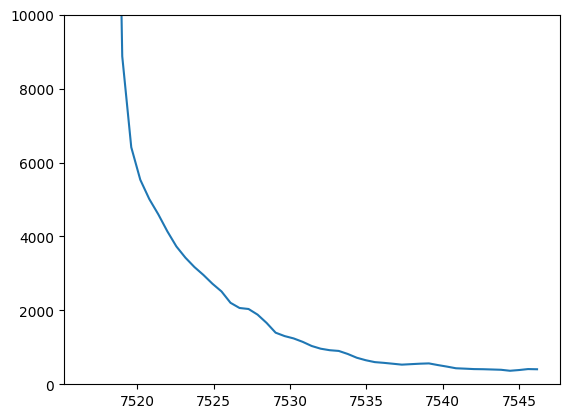

In [48]:
plt.plot(x_arc_7135, y_arc_7135)
#plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  1000050,  7516, 0, 2.0))
#plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  250,    7838, 0, 0.7))
#plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135,  500,  7842.5, 0, 0.7))
#plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, 1200,  7843.9, 0, 0.7))
#plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, 6000, 7849.67, 0, 0.7))
plt.ylim(0, 10000)

In [224]:
params_arc_7135 = Parameters()
params_arc_7135.add('z', value=0.0, vary=False)
params_arc_7135.add('mu1', value= 7836.5, vary=False)
params_arc_7135.add('mu2', value=   7838, vary=False)
params_arc_7135.add('mu3', value= 7842.5, vary=False)
params_arc_7135.add('mu4', value= 7843.9, vary=False)
params_arc_7135.add('mu5', value=7849.67, vary=False)
params_arc_7135.add('arc1', value= 250, min=0.)
params_arc_7135.add('arc2', value= 250, min=0.)
params_arc_7135.add('arc3', value= 500, min=0.)
params_arc_7135.add('arc4', value=1200, min=0.)
params_arc_7135.add('arc5', value=6000, min=0.)
params_arc_7135.add('sigma', value=0.7, min=0.)
params_arc_7135.add('bkg', value=300, vary=False)

def residual_arc_7135(params_arc_7135, x, data, uncertainty):
    
    z = params_arc_7135['z']
    mu1 = params_arc_7135['mu1']
    mu2 = params_arc_7135['mu2']
    mu3 = params_arc_7135['mu3']
    mu4 = params_arc_7135['mu4']
    mu5 = params_arc_7135['mu5']
    flux1 = params_arc_7135['arc1']
    flux2 = params_arc_7135['arc2']
    flux3 = params_arc_7135['arc3']
    flux4 = params_arc_7135['arc4']
    flux5 = params_arc_7135['arc5']
    sigma = params_arc_7135['sigma']
    bkg = params_arc_7135['bkg']
    
    x = x_arc_7135
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_7135) / 10

np.random.seed(21)
out_arc_7135 = minimize(residual_arc_7135, params_arc_7135, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:26<00:00, 96.06it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.76944927 64.60633999 53.55961534 48.38484696 58.09936086 47.92801683]


In [225]:
out_arc_7135.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,7836.50000,,,7836.5,-inf,inf,False
mu2,7838.00000,,,7838,-inf,inf,False
mu3,7842.50000,,,7842.5,-inf,inf,False
mu4,7843.90000,,,7843.9,-inf,inf,False
mu5,7849.67000,,,7849.67,-inf,inf,False
arc1,210.117781,12.3844484,(5.89%),250,0.00000000,inf,True
arc2,214.981695,12.4040436,(5.77%),250,0.00000000,inf,True
arc3,450.129721,12.8451213,(2.85%),500,0.00000000,inf,True
arc4,1133.04739,12.7480351,(1.13%),1200,0.00000000,inf,True


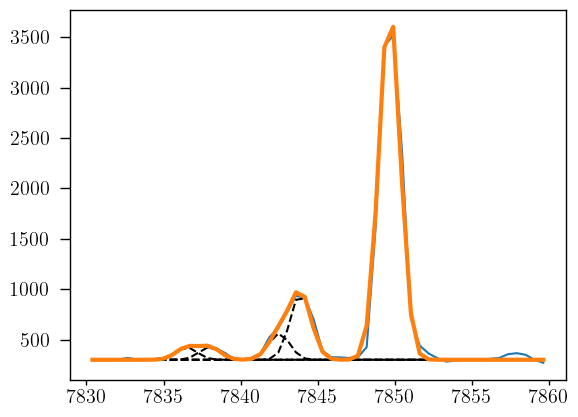

In [226]:
arc1_7135 = out_arc_7135.flatchain.arc1.mean()
arc2_7135 = out_arc_7135.flatchain.arc2.mean()
arc3_7135 = out_arc_7135.flatchain.arc3.mean()
arc4_7135 = out_arc_7135.flatchain.arc4.mean()
arc5_7135 = out_arc_7135.flatchain.arc5.mean()
sigma_arc_7135 = out_arc_7135.flatchain.sigma.mean()

plt.plot(x_arc_7135, y_arc_7135)

plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc1_7135,  7836.5, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc2_7135,    7838, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc3_7135,  7842.5, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc4_7135,  7843.9, 0, sigma_arc_7135), ls='--', color='black')
plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc5_7135, 7849.67, 0, sigma_arc_7135), ls='--', color='black')

plt.plot(x_arc_7135, 300 + gaussian(x_arc_7135, arc1_7135,  7836.5, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc2_7135,    7838, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc3_7135,  7842.5, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc4_7135,  7843.9, 0, sigma_arc_7135) \
                         + gaussian(x_arc_7135, arc5_7135, 7849.67, 0, sigma_arc_7135), lw=3
)

### Line fitting

In [227]:
sigma_nar_7135 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7135**2))
sigma_brd_7135 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7135**2))

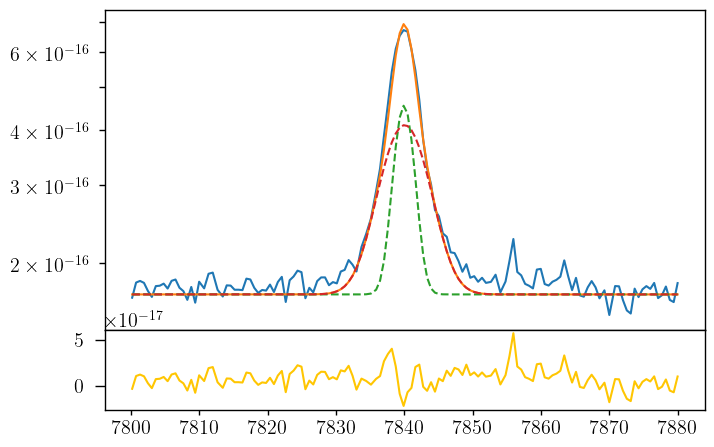

In [228]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ariii_7135.wavelength, ariii_7135.flux)
bkg = 1.7e-16

ariiia_nar = gaussian(ariii_7135.wavelength, 1e-15, wave_cat['[ArIII]7135'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, 2e-15, wave_cat['[ArIII]7135'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7135))

ax.plot(ariii_7135.wavelength, bkg + ariiia_nar + ariiia_brd)
ax.plot(ariii_7135.wavelength, bkg + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg + ariiia_brd, ls='--')
ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg - ariiia_nar - ariiia_brd, color=c[3])
ax.set_yscale('log')

In [229]:
params_ariii = Parameters()
params_ariii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ariii.add('z_ratio', value=z_ratio, vary=False)
params_ariii.add('sigma_nar', value=upy.nominal_values(sigma_nar_7135), vary=False)
params_ariii.add('sigma_brd', value=upy.nominal_values(sigma_brd_7135), vary=False)
params_ariii.add('Ariiia_nar', value=1e-15, min=0.)
params_ariii.add('Ariiia_brd', value=2e-15, min=0.)
params_ariii.add('bkg', value=1.7e-16, min=0.)


def residual_ariii(params_ariii, x, data, uncertainty):
    
    z_nar = params_ariii['z_nar']
    z_brd = params_ariii['z_nar'] * params_ariii['z_ratio']
    sigma_nar = params_ariii['sigma_nar']
    sigma_brd = params_ariii['sigma_brd']
    ariiia_nar = params_ariii['Ariiia_nar']
    ariiia_brd = params_ariii['Ariiia_brd']
    bkg = params_ariii['bkg']
    
    x = ariii_7135.wavelength
    model_ariii = gaussian(x, ariiia_nar, wave_cat['[ArIII]7135'], z_nar, sigma_nar) \
                + gaussian(x, ariiia_brd, wave_cat['[ArIII]7135'], z_brd, sigma_brd)
    
    return (model_ariii + bkg - ariii_7135.flux) / ariii_7135.noise

In [230]:
np.random.seed(21)
out_ariii = minimize(residual_ariii, params_ariii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 131.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [39.59152535 54.9991208  53.64741489 46.3561155 ]


In [231]:
out_ariii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.09866933,2.9450e-06,(0.00%),0.09867719705615696,-inf,inf,True
z_ratio,1.00012632,,,1.0001263225003523,-inf,inf,False
sigma_nar,1.40498268,,,1.404982678157271,-inf,inf,False
sigma_brd,3.32100150,,,3.321001501285244,-inf,inf,False
Ariiia_nar,9.3231e-16,2.7289e-17,(2.93%),1e-15,0.00000000,inf,True
Ariiia_brd,2.1018e-15,4.0398e-17,(1.92%),2e-15,0.00000000,inf,True
bkg,1.7746e-16,5.9351e-19,(0.33%),1.7e-16,0.00000000,inf,True


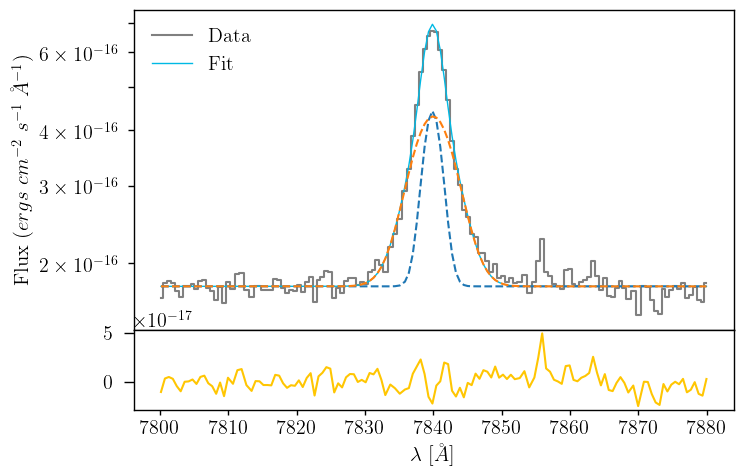

In [232]:
ariiia_nar_flux = out_ariii.flatchain.Ariiia_nar.mean()
ariiia_nar_std = out_ariii.flatchain.Ariiia_nar.std()

ariiia_brd_flux = out_ariii.flatchain.Ariiia_brd.mean()
ariiia_brd_std = out_ariii.flatchain.Ariiia_brd.std()

z_ariii = out_ariii.flatchain.z_nar.mean()
z_ariii_std = out_ariii.flatchain.z_nar.std()

bkg_ariii = out_ariii.flatchain.bkg.mean()
bkg_ariii_std = out_ariii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ariii_7135.wavelength, ariii_7135.flux,
            color='gray', label='Data', where='mid')

ariiia_nar = gaussian(ariii_7135.wavelength, ariiia_nar_flux, wave_cat['[ArIII]7135'], z_ariii, upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, ariiia_brd_flux, wave_cat['[ArIII]7135'], z_ariii * z_ratio, upy.nominal_values(sigma_brd_7135))

ariiia = ariiia_nar + ariiia_brd

ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia,
        lw=1, color=c[0], label='Fit')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_brd, ls='--')

ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg_ariii - ariiia,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [233]:
# EW
EW_ArIII_7135_nar = ufloat(ariiia_nar_flux, ariiia_nar_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135_brd = ufloat(ariiia_brd_flux, ariiia_brd_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135 = (ufloat(ariiia_nar_flux, ariiia_nar_std) + ufloat(ariiia_brd_flux, ariiia_brd_std)) / ufloat(bkg_ariii, bkg_ariii_std)

# [OIII]5007 + HeI 5015

### Arc lines

In [209]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5007 = [wave_cat['[OIII]5007']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]5007']*(1 + z_BN[igal]) + 10]
mask_arc_5007 = (wcal_blue[12].data['wave_soln'][0] >= wlims_5007[0]) & (wcal_blue[12].data['wave_soln'][0] < wlims_5007[1])

# Arc spectra around the fitted line
x_arc_5007 = wcal_blue[12].data['wave_soln'][0][mask_arc_5007]
y_arc_5007 = wcal_blue[25].data[:, 5][mask_arc_5007]

100%|███████████████████████████████████████| 2500/2500 [00:28<00:00, 88.37it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [44.91903903 45.01040465 47.19636218 46.7885072  52.08901673]


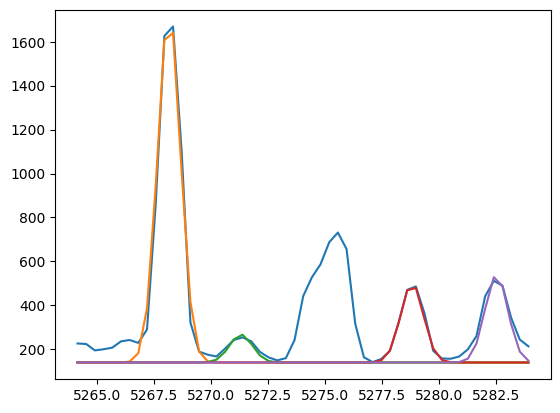

In [210]:
plt.plot(x_arc_5007, y_arc_5007)
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, 2000, 5268.15, 0, 0.5))
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, 160, 5271.3, 0, 0.5))
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, 450, 5278.8, 0, 0.5))
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, 500, 5282.5, 0, 0.5))

params_arc_5007 = Parameters()
params_arc_5007.add('z', value=0.0, vary=False)
params_arc_5007.add('mu1', value=5268.15, vary=False)
params_arc_5007.add('mu2', value=5271.3, vary=False)
params_arc_5007.add('mu3', value=5278.8, vary=False)
params_arc_5007.add('mu4', value=5282.5, vary=False)
params_arc_5007.add('arc1', value=2000, min=0.)
params_arc_5007.add('arc2', value=160, min=0.)
params_arc_5007.add('arc3', value=450, min=0.)
params_arc_5007.add('arc4', value=500, min=0.)
params_arc_5007.add('sigma', value=0.5, min=0.)
params_arc_5007.add('bkg', value=140, vary=False)

def residual_arc_5007(params_arc_5007, x, data, uncertainty):
    
    z = params_arc_5007['z']
    mu1 = params_arc_5007['mu1']
    mu2 = params_arc_5007['mu2']
    mu3 = params_arc_5007['mu3']
    mu4 = params_arc_5007['mu4']
    flux1 = params_arc_5007['arc1']
    flux2 = params_arc_5007['arc2']
    flux3 = params_arc_5007['arc3']
    flux4 = params_arc_5007['arc4']
    sigma = params_arc_5007['sigma']
    bkg = params_arc_5007['bkg']
    
    x = x_arc_5007
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_5007) / 10

np.random.seed(23)
out_arc_5007 = minimize(residual_arc_5007, params_arc_5007, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

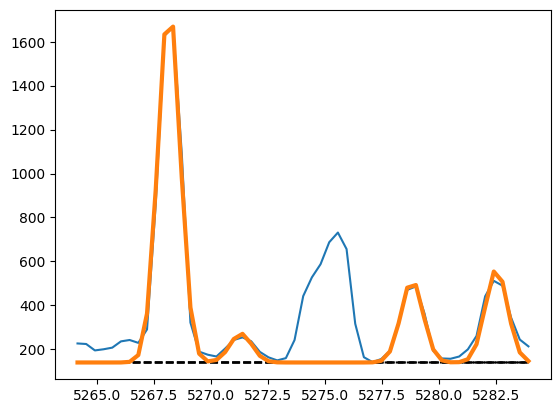

In [211]:
arc1_5007 = out_arc_5007.flatchain.arc1.mean()
arc2_5007 = out_arc_5007.flatchain.arc2.mean()
arc3_5007 = out_arc_5007.flatchain.arc3.mean()
arc4_5007 = out_arc_5007.flatchain.arc4.mean()
sigma_arc_5007 = out_arc_5007.flatchain.sigma.mean()

plt.plot(x_arc_5007, y_arc_5007)

plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, arc1_5007, 5268.15, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, arc2_5007, 5271.3, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, arc3_5007, 5278.8, 0, sigma_arc_5007), ls='--', color='black')
plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, arc4_5007, 5282.5, 0, sigma_arc_5007), ls='--', color='black')

plt.plot(x_arc_5007, 140 + gaussian(x_arc_5007, arc1_5007, 5268.15, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc2_5007, 5271.3, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc3_5007, 5278.8, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc4_5007, 5282.5, 0, sigma_arc_5007), lw=3
)

### Line fitting

In [212]:
sigma_nar_5007 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5007**2))
sigma_brd_5007 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5007**2))

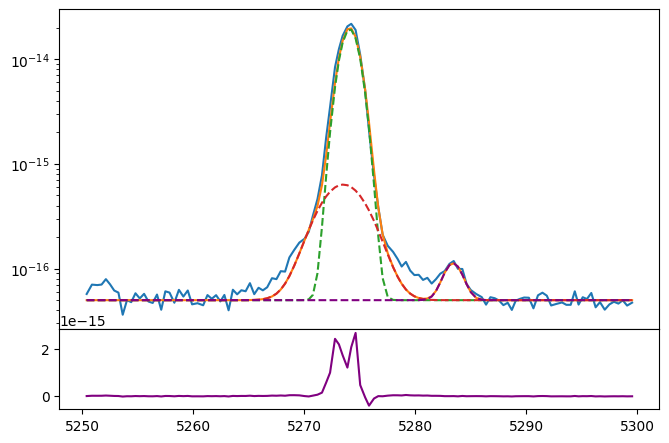

In [213]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 5e-17

oiiia_nar = gaussian(oiii_hei.wavelength, 4e-14, wave_cat['[OIII]5007'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, 3e-15, wave_cat['[OIII]5007'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5007))

hei_5015 = gaussian(oiii_hei.wavelength, 1.3e-16, wave_cat['HeI5015'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))

ax.plot(oiii_hei.wavelength, bkg + oiiia_nar + oiiia_brd + hei_5015)
ax.plot(oiii_hei.wavelength, bkg + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg + hei_5015, ls='--', color='purple')
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_nar - oiiia_brd - hei_5015, color='purple')
ax.set_yscale('log')

In [214]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiii_hei.add('z_ratio', value=z_ratio, vary=False)
params_oiii_hei.add('sigma_nar', value=upy.nominal_values(sigma_nar_5007), vary=False)
params_oiii_hei.add('sigma_brd', value=upy.nominal_values(sigma_brd_5007), vary=False)
params_oiii_hei.add('Hei', value=1.3e-16, min=0.)
params_oiii_hei.add('Oiiia_nar', value=4e-14, min=0.)
params_oiii_hei.add('Oiiia_brd', value=3e-15, min=0.)
params_oiii_hei.add('bkg', value=5e-17, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_nar = params_oiii_hei['z_nar']
    z_brd = params_oiii_hei['z_nar'] * params_oiii_hei['z_ratio']
    sigma_nar = params_oiii_hei['sigma_nar']
    sigma_brd = params_oiii_hei['sigma_brd']
    oiiia_nar = params_oiii_hei['Oiiia_nar']
    oiiia_brd = params_oiii_hei['Oiiia_brd']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_nar, wave_cat['[OIII]5007'], z_nar, sigma_nar) \
               + gaussian(x, oiiia_brd, wave_cat['[OIII]5007'], z_brd, sigma_brd)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_nar, sigma_nar)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [215]:
np.random.seed(23)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:24<00:00, 104.10it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [77.3178413  44.46210503 94.3469493  35.54652766 72.10385224]


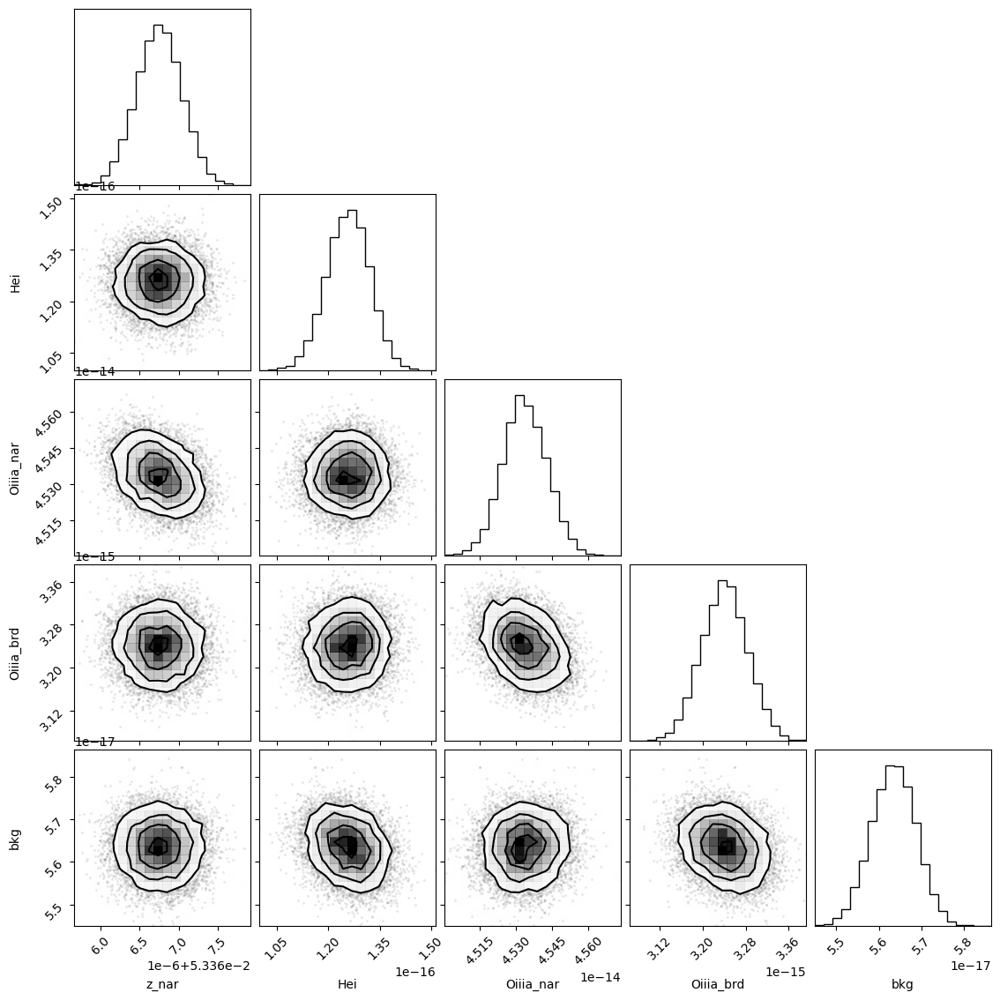

In [216]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [217]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05336675,2.8890e-07,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.82688270,,,0.8268826992956338,-inf,inf,False
sigma_brd,2.04773172,,,2.047731721862323,-inf,inf,False
Hei,1.2589e-16,6.3076e-18,(5.01%),1.3e-16,0.00000000,inf,True
Oiiia_nar,4.5334e-14,9.1428e-17,(0.20%),4e-14,0.00000000,inf,True
Oiiia_brd,3.2407e-15,4.3111e-17,(1.33%),3e-15,0.00000000,inf,True
bkg,5.6356e-17,5.2396e-19,(0.93%),5e-17,0.00000000,inf,True


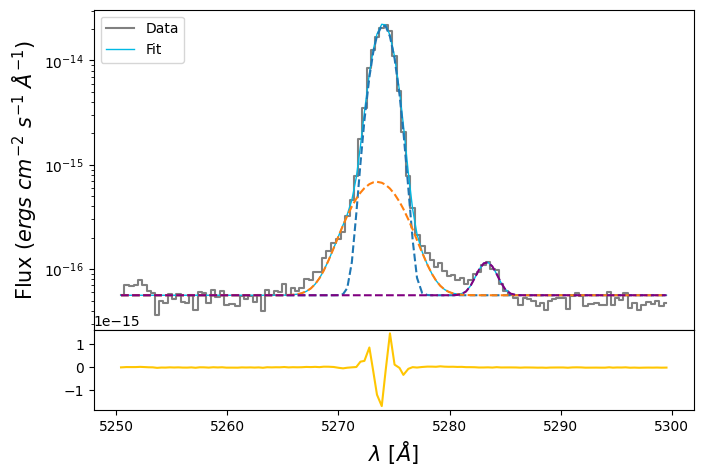

In [218]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_nar_flux = out_oiii_hei.flatchain.Oiiia_nar.mean()
oiiia_nar_std = out_oiii_hei.flatchain.Oiiia_nar.std()

oiiia_brd_flux = out_oiii_hei.flatchain.Oiiia_brd.mean()
oiiia_brd_std = out_oiii_hei.flatchain.Oiiia_brd.std()

z_oiii_hei = out_oiii_hei.flatchain.z_nar.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_nar.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))

oiiia_nar = gaussian(oiii_hei.wavelength, oiiia_nar_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, oiiia_brd_flux, wave_cat['[OIII]5007'], z_oiii_hei * z_ratio, upy.nominal_values(sigma_brd_5007))

oiiia = oiiia_nar + oiiia_brd

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [219]:
# EW
EW_OIII_5007_nar = ufloat(oiiia_nar_flux, oiiia_nar_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007_brd = ufloat(oiiia_brd_flux, oiiia_brd_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007 = (ufloat(oiiia_nar_flux, oiiia_nar_std) + ufloat(oiiia_brd_flux, oiiia_brd_std)) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [OIII]4363

### Arc lines

In [220]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4363 = [wave_cat['[OIII]4363']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4363']*(1 + z_BN[igal]) + 8]
mask_arc_4363 = (wcal_blue[8].data['wave_soln'][0] >= wlims_4363[0]) & (wcal_blue[8].data['wave_soln'][0] < wlims_4363[1])

# Arc spectra around the fitted line
x_arc_4363 = wcal_blue[8].data['wave_soln'][0][mask_arc_4363]
y_arc_4363 = wcal_blue[25].data[:, 3][mask_arc_4363]

100%|███████████████████████████████████████| 2500/2500 [00:29<00:00, 85.91it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [52.53820306 75.18808864 61.99822262 81.93688931 60.53905513 75.65590289]


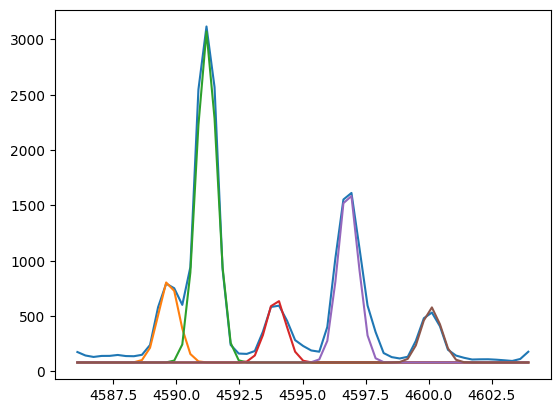

In [221]:
plt.plot(x_arc_4363, y_arc_4363)
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, 750, 4589.7, 0, 0.4))
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, 3000, 4591.2, 0, 0.4))
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, 580, 4593.95, 0, 0.4))
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, 1600, 4596.8, 0, 0.4))
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, 500, 4600.1, 0, 0.4))

params_arc_4363 = Parameters()
params_arc_4363.add('z', value=0.0, vary=False)
params_arc_4363.add('mu1', value=4589.7, vary=False)
params_arc_4363.add('mu2', value=4591.2, vary=False)
params_arc_4363.add('mu3', value=4593.95, vary=False)
params_arc_4363.add('mu4', value=4596.8, vary=False)
params_arc_4363.add('mu5', value=4600.1, vary=False)
params_arc_4363.add('arc1', value=750, min=0.)
params_arc_4363.add('arc2', value=3000, min=0.)
params_arc_4363.add('arc3', value=580, min=0.)
params_arc_4363.add('arc4', value=1600, min=0.)
params_arc_4363.add('arc5', value=500, min=0.)
params_arc_4363.add('sigma', value=0.4, min=0.)
params_arc_4363.add('bkg', value=80, vary=False)

def residual_arc_4363(params_arc_4363, x, data, uncertainty):
    
    z = params_arc_4363['z']
    mu1 = params_arc_4363['mu1']
    mu2 = params_arc_4363['mu2']
    mu3 = params_arc_4363['mu3']
    mu4 = params_arc_4363['mu4']
    mu5 = params_arc_4363['mu5']
    flux1 = params_arc_4363['arc1']
    flux2 = params_arc_4363['arc2']
    flux3 = params_arc_4363['arc3']
    flux4 = params_arc_4363['arc4']
    flux5 = params_arc_4363['arc5']
    sigma = params_arc_4363['sigma']
    bkg = params_arc_4363['bkg']
    
    x = x_arc_4363
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_4363) / 10

np.random.seed(23)
out_arc_4363 = minimize(residual_arc_4363, params_arc_4363, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

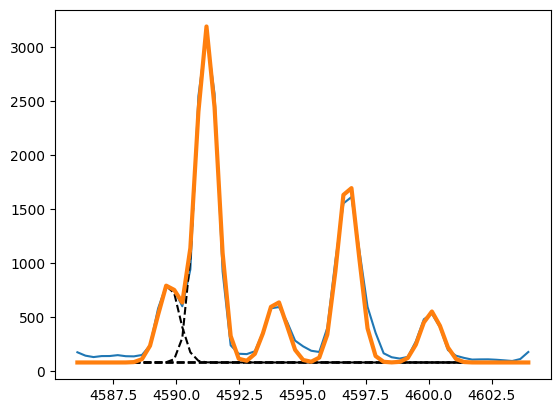

In [222]:
arc1_4363 = out_arc_4363.flatchain.arc1.mean()
arc2_4363 = out_arc_4363.flatchain.arc2.mean()
arc3_4363 = out_arc_4363.flatchain.arc3.mean()
arc4_4363 = out_arc_4363.flatchain.arc4.mean()
arc5_4363 = out_arc_4363.flatchain.arc5.mean()
sigma_arc_4363 = out_arc_4363.flatchain.sigma.mean()

plt.plot(x_arc_4363, y_arc_4363)

plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc1_4363, 4589.7, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc2_4363, 4591.2, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc3_4363, 4593.95, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc4_4363, 4596.8, 0, sigma_arc_4363), ls='--', color='black')
plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc5_4363, 4600.1, 0, sigma_arc_4363), ls='--', color='black')

plt.plot(x_arc_4363, 80 + gaussian(x_arc_4363, arc1_4363, 4589.7, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc2_4363, 4591.2, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc3_4363, 4593.95, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc4_4363, 4596.8, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc5_4363, 4600.1, 0, sigma_arc_4363), lw=3
)

### Line fitting

In [223]:
sigma_nar_4363 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4363**2))
sigma_brd_4363 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4363**2))

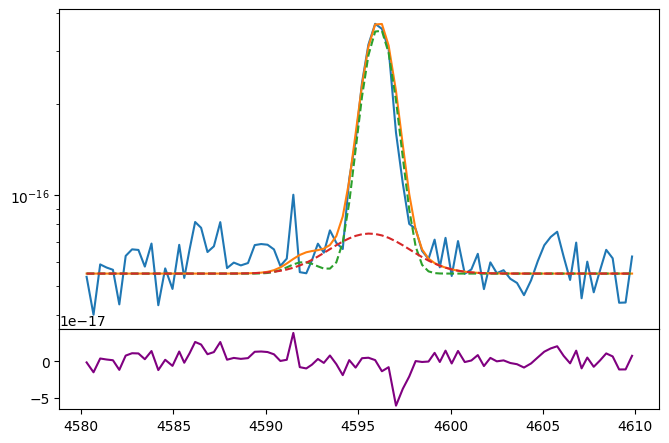

In [224]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 5.5e-17

feii_4360 = gaussian(oiii_4363.wavelength, 1e-17, wave_cat['[FeII]4360'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, 6e-16, wave_cat['[OIII]4363'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, 1e-16, wave_cat['[OIII]4363'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + oiiic_brd + feii_4360)
ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg + oiiic_brd, ls='--')
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_nar - oiiic_brd - feii_4360, color='purple')
ax.set_yscale('log')

In [225]:
params_oiiic = Parameters()

params_oiiic.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiiic.add('z_ratio', value=z_ratio, vary=False)
params_oiiic.add('sigma_nar', value=upy.nominal_values(sigma_nar_4363), vary=False)
params_oiiic.add('sigma_brd', value=upy.nominal_values(sigma_brd_4363), vary=False)
params_oiiic.add('Feii_4360_nar', value=1e-17, min=0.)
params_oiiic.add('Oiiic_nar', value=6e-16, min=0.)
params_oiiic.add('Oiiic_brd', value=1e-16, min=0.)
params_oiiic.add('bkg', value=5.5e-17, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_nar = params_oiiic['z_nar']
    z_brd = params_oiiic['z_nar'] * params_oiiic['z_ratio']
    sigma_nar = params_oiiic['sigma_nar']
    sigma_brd = params_oiiic['sigma_brd']
    feii_4360_flux = params_oiiic['Feii_4360_nar']
    oiiic_nar_flux = params_oiiic['Oiiic_nar']
    oiiic_brd_flux = params_oiiic['Oiiic_brd']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_nar_flux, wave_cat['[OIII]4363'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_brd_flux, wave_cat['[OIII]4363'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [226]:
np.random.seed(23)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 123.90it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [50.96215225 50.55960172 58.18414528 99.81381773 63.4487368 ]


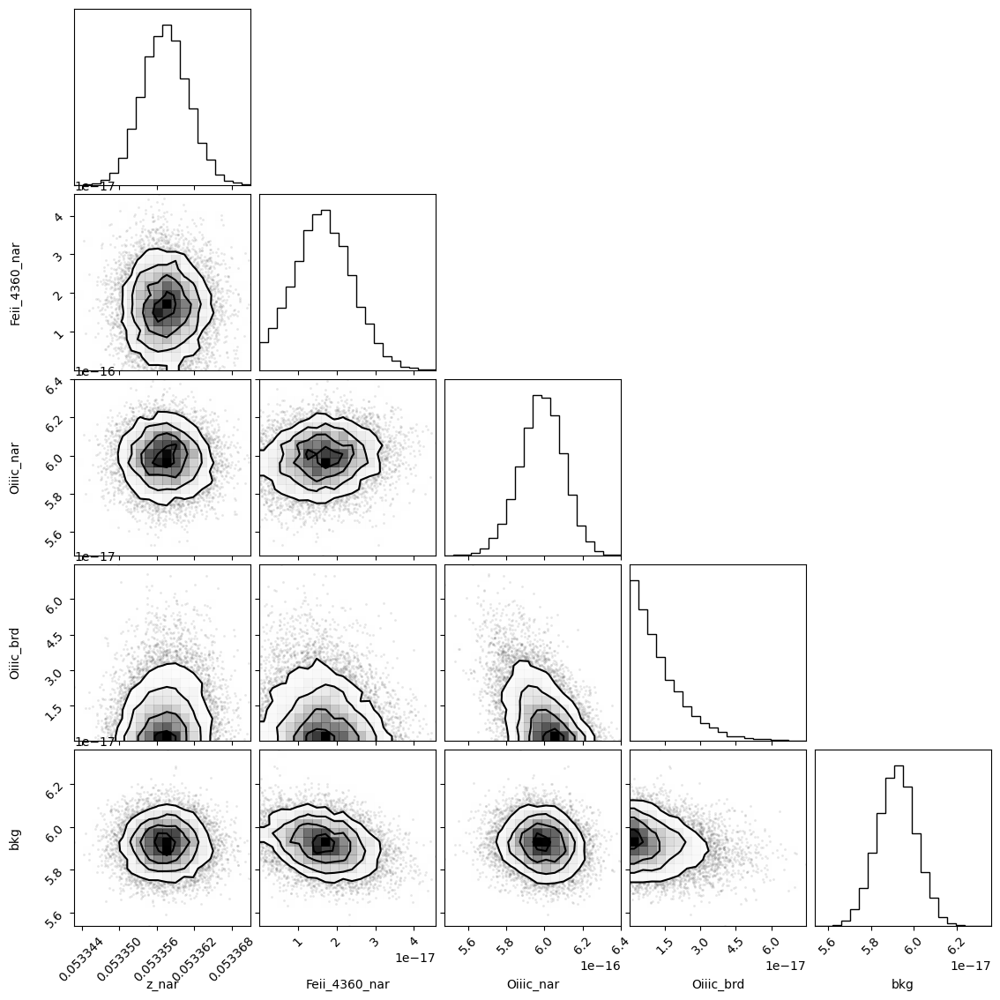

In [227]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [228]:
out_oiiic.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05335734,3.6793e-06,(0.01%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.79237118,,,0.7923711752741353,-inf,inf,False
sigma_brd,2.03404088,,,2.034040876121253,-inf,inf,False
Feii_4360_nar,1.6447e-17,7.5787e-18,(46.08%),1e-17,0.00000000,inf,True
Oiiic_nar,5.9877e-16,1.1341e-17,(1.89%),6e-16,0.00000000,inf,True
Oiiic_brd,9.4420e-18,1.0052e-17,(106.47%),1e-16,0.00000000,inf,True
bkg,5.9200e-17,9.0000e-19,(1.52%),5.5e-17,0.00000000,inf,True


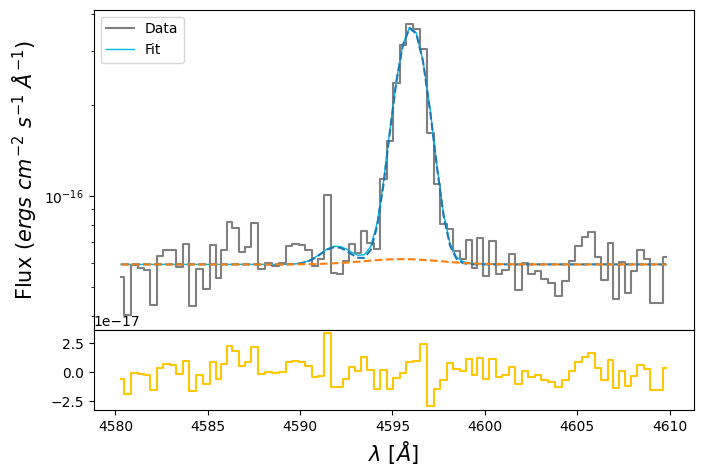

In [229]:
oiiic_nar_flux = out_oiiic.flatchain.Oiiic_nar.mean()
oiiic_nar_std = out_oiiic.flatchain.Oiiic_nar.std()

oiiic_brd_flux = out_oiiic.flatchain.Oiiic_brd.mean()
oiiic_brd_std = out_oiiic.flatchain.Oiiic_brd.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_nar.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_nar.std()

z_oiii = out_oiiic.flatchain.z_nar.mean()
z_oiii_std = out_oiiic.flatchain.z_nar.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_brd, ls='--')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [230]:
# EW
EW_OIII_4363_nar = ufloat(oiiic_nar_flux, oiiic_nar_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363_brd = ufloat(oiiic_brd_flux, oiiic_brd_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363 = (ufloat(oiiic_nar_flux, oiiic_nar_std) + ufloat(oiiic_brd_flux, oiiic_brd_std)) / ufloat(bkg_oiiic, bkg_oiiic_std)

# [NeIII]3868

### Arc lines

In [107]:
wave_cat['[NeIII]3868']*(1 + z_BN[igal])

4075.2357211999997

In [110]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3868 = [wave_cat['[NeIII]3868']*(1 + z_BN[igal])-10, wave_cat['[NeIII]3868']*(1 + z_BN[igal]) + 10]
mask_arc_3868 = (wcal_blue[6].data['wave_soln'][0] >= wlims_3868[0]) & (wcal_blue[6].data['wave_soln'][0] < wlims_3868[1])

# Arc spectra around the fitted line
x_arc_3868 = wcal_blue[6].data['wave_soln'][0][mask_arc_3868]
y_arc_3868 = wcal_blue[25].data[:, 2][mask_arc_3868]

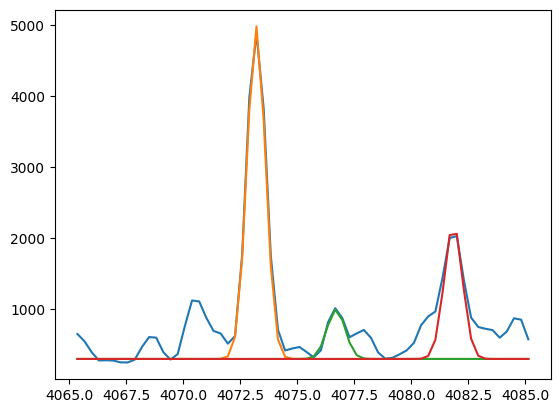

In [134]:
plt.plot(x_arc_3868, y_arc_3868)
plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868, 4700,  4073.2, 0, 0.4))
plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868,  700,  4076.7, 0, 0.4))
plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868, 1900, 4081.85, 0, 0.4))

In [135]:
params_arc_3868 = Parameters()
params_arc_3868.add('z', value=0.0, vary=False)
params_arc_3868.add('mu1', value= 4073.2, vary=False)
params_arc_3868.add('mu2', value= 4076.7, vary=False)
params_arc_3868.add('mu3', value=4081.85, vary=False)
params_arc_3868.add('arc1', value=4700, min=0.)
params_arc_3868.add('arc2', value= 700, min=0.)
params_arc_3868.add('arc3', value=1900, min=0.)
params_arc_3868.add('sigma', value=0.4, min=0.)
params_arc_3868.add('bkg', value=400, vary=False)

def residual_arc_3868(params_arc_3868, x, data, uncertainty):
    
    z = params_arc_3868['z']
    mu1 = params_arc_3868['mu1']
    mu2 = params_arc_3868['mu2']
    mu3 = params_arc_3868['mu3']
    flux1 = params_arc_3868['arc1']
    flux2 = params_arc_3868['arc2']
    flux3 = params_arc_3868['arc3']
    sigma = params_arc_3868['sigma']
    bkg = params_arc_3868['bkg']
    
    x = x_arc_3868
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_3868) / 10

np.random.seed(23)
out_arc_3868 = minimize(residual_arc_3868, params_arc_3868, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 116.94it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [46.32208648 64.49508727 44.17592826 54.97534688]


In [136]:
out_arc_3868.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4073.20000,,,4073.2,-inf,inf,False
mu2,4076.70000,,,4076.7,-inf,inf,False
mu3,4081.85000,,,4081.85,-inf,inf,False
arc1,4775.19987,8.12316973,(0.17%),4700,0.00000000,inf,True
arc2,621.666820,6.98157343,(1.12%),700,0.00000000,inf,True
arc3,1923.15870,7.12201141,(0.37%),1900,0.00000000,inf,True
sigma,0.42150181,7.9403e-04,(0.19%),0.4,0.00000000,inf,True
bkg,400.000000,,,400,-inf,inf,False


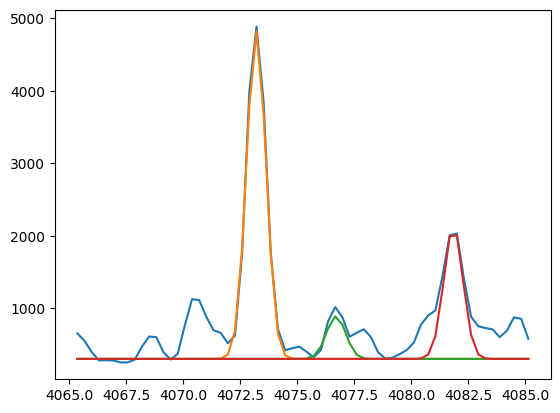

In [144]:
arc1_3868 = out_arc_3868.flatchain.arc1.mean()
arc2_3868 = out_arc_3868.flatchain.arc2.mean()
arc3_3868 = out_arc_3868.flatchain.arc3.mean()
sigma_arc_3868 = out_arc_3868.flatchain.sigma.mean()

plt.plot(x_arc_3868, y_arc_3868)

plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868, arc1_3868,  4073.2, 0, sigma_arc_3868))
plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868, arc2_3868,  4076.7, 0, sigma_arc_3868))
plt.plot(x_arc_3868, 300 + gaussian(x_arc_3868, arc3_3868, 4081.85, 0, sigma_arc_3868))

### Line fitting

In [145]:
sigma_nar_3868 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3868**2))
sigma_brd_3868 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3868**2))

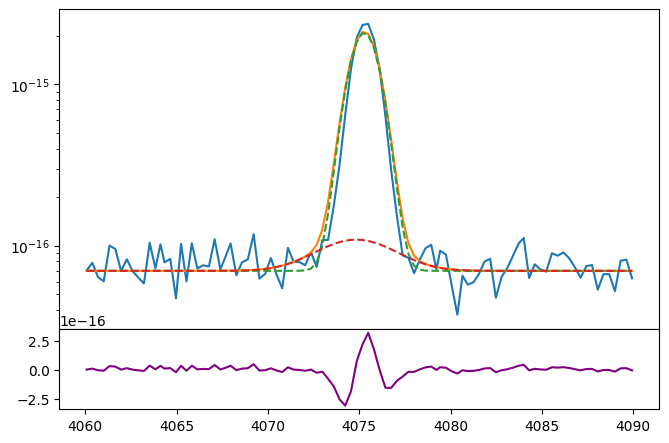

In [146]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(neiii_3868.wavelength, neiii_3868.flux)
bkg = 7e-17

neiiia_nar = gaussian(neiii_3868.wavelength, 4e-15, wave_cat['[NeIII]3868'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3868))
neiiia_brd = gaussian(neiii_3868.wavelength, 2e-16, wave_cat['[NeIII]3868'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3868))

ax.plot(neiii_3868.wavelength, bkg + neiiia_nar + neiiia_brd)
ax.plot(neiii_3868.wavelength, bkg + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg + neiiia_brd, ls='--')
ax1.plot(neiii_3868.wavelength, neiii_3868.flux - bkg - neiiia_nar - neiiia_brd, color='purple')
ax.set_yscale('log')

In [147]:
params_neiii_3868 = Parameters()
params_neiii_3868.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_neiii_3868.add('z_ratio', value=z_ratio, vary=False)
params_neiii_3868.add('sigma_nar', value=upy.nominal_values(sigma_nar_3868), vary=False)
params_neiii_3868.add('sigma_brd', value=upy.nominal_values(sigma_brd_3868), vary=False)
params_neiii_3868.add('Neiiia_nar', value=4e-15, min=0.)
params_neiii_3868.add('Neiiia_brd', value=2e-16, min=0.)
params_neiii_3868.add('bkg', value=7e-17, min=0.)


def residual_neiii_3868(params_neiii_3868, x, data, uncertainty):
    
    z_nar = params_neiii_3868['z_nar']
    z_brd = params_neiii_3868['z_nar'] * params_neiii_3868['z_ratio']
    sigma_nar = params_neiii_3868['sigma_nar']
    sigma_brd = params_neiii_3868['sigma_brd']
    neiiia_nar_flux = params_neiii_3868['Neiiia_nar']
    neiiia_brd_flux = params_neiii_3868['Neiiia_brd']
    bkg = params_neiii_3868['bkg']
    
    x = neiii_3868.wavelength
    model = gaussian(x, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_nar, sigma_nar) + \
            gaussian(x, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_brd, sigma_brd)
    
    return (model + bkg - neiii_3868.flux) / neiii_3868.noise

In [148]:
np.random.seed(23)
out_neiii_3868 = minimize(residual_neiii_3868, params_neiii_3868, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:16<00:00, 147.80it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 35.37765679  45.69038429 100.81063951  49.56213164]


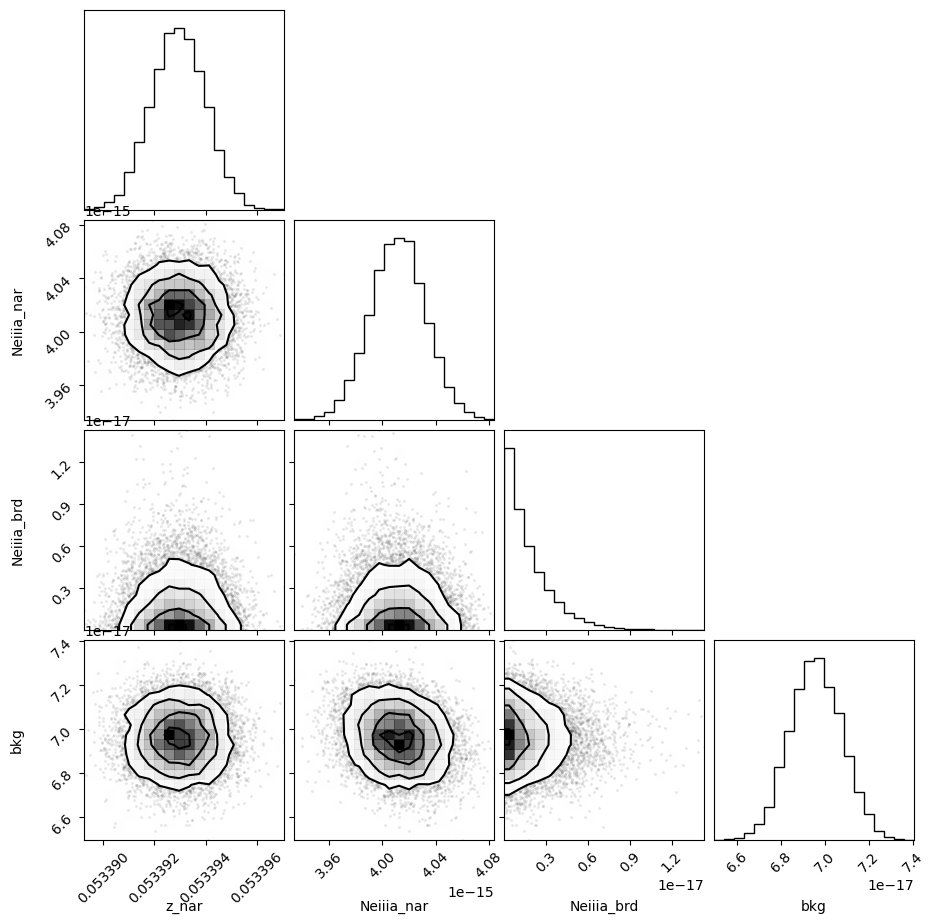

In [149]:
corner.corner(out_neiii_3868.flatchain, labels=out_neiii_3868.var_names);

In [150]:
out_neiii_3868.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05339295,1.0603e-06,(0.00%),0.05337982520594247,-inf,inf,True
z_ratio,0.99784781,,,0.9978478115050403,-inf,inf,False
sigma_nar,0.79207218,,,0.7920721778232566,-inf,inf,False
sigma_brd,2.03392442,,,2.0339244187551504,-inf,inf,False
Neiiia_nar,4.0121e-15,2.0648e-17,(0.51%),4e-15,0.00000000,inf,True
Neiiia_brd,1.2777e-18,1.5117e-18,(118.31%),2e-16,0.00000000,inf,True
bkg,6.9582e-17,1.1866e-18,(1.71%),7e-17,0.00000000,inf,True


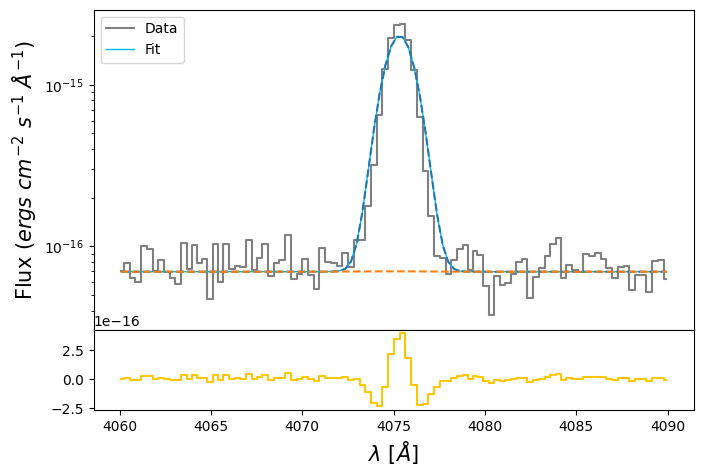

In [151]:
neiiia_nar_flux = out_neiii_3868.flatchain.Neiiia_nar.mean()
neiiia_nar_std = out_neiii_3868.flatchain.Neiiia_nar.std()

neiiia_brd_flux = out_neiii_3868.flatchain.Neiiia_brd.mean()
neiiia_brd_std = out_neiii_3868.flatchain.Neiiia_brd.std()

z_neiii = out_neiii_3868.flatchain.z_nar.mean()
z_neiii_std = out_neiii_3868.flatchain.z_nar.std()

bkg_neiiia = out_neiii_3868.flatchain.bkg.mean()
bkg_neiiia_std = out_neiii_3868.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(neiii_3868.wavelength, neiii_3868.flux,
            color='gray', label='Data', where='mid')

neiiia_nar = gaussian(neiii_3868.wavelength, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_neiii, sigma_nar_oiii_4959)
neiiia_brd = gaussian(neiii_3868.wavelength, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_neiii * z_ratio, sigma_brd_oiii_4959)
neiiia = neiiia_nar + neiiia_brd

ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia, lw=1, color=c[0], label='Fit')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_brd, ls='--')
ax1.step(neiii_3868.wavelength, neiii_3868.flux - bkg_neiiia - neiiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [152]:
# EW
EW_NeIII_3868_nar = ufloat(neiiia_nar_flux, neiiia_nar_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868_brd = ufloat(neiiia_brd_flux, neiiia_brd_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868 = (ufloat(neiiia_nar_flux, neiiia_nar_std) + ufloat(neiiia_brd_flux, neiiia_brd_std)) / ufloat(bkg_neiiia, bkg_neiiia_std)

# Saving arc data

In [231]:
sigma_arc = np.array([sigma_arc_3729,
                      sigma_arc_hd,
                      sigma_arc_hg,
                      sigma_arc_4363,
                      sigma_arc_4471,
                      sigma_arc_4685,
                      sigma_arc_hb,
                      sigma_arc_4959,
                      sigma_arc_5007,
                      sigma_arc_5875,
                      sigma_arc_6312,
                      sigma_arc_ha,
                      sigma_arc_6678,
                      sigma_arc_6730,
                      sigma_arc_7065,
                      sigma_arc_7330,
                      sigma_arc_9069,
                      sigma_arc_9532])

x_arc = np.array([np.median(x_arc_3729),
                  np.median(x_arc_hd),
                  np.median(x_arc_hg),
                  np.median(x_arc_4363),
                  np.median(x_arc_4471),
                  np.median(x_arc_4685),
                  np.median(x_arc_hb),
                  np.median(x_arc_4959),
                  np.median(x_arc_5007),
                  np.median(x_arc_5875),
                  np.median(x_arc_6312),
                  np.median(x_arc_ha),
                  np.median(x_arc_6678),
                  np.median(x_arc_6730),
                  np.median(x_arc_7065),
                  np.median(x_arc_7330),
                  np.median(x_arc_9069),
                  np.median(x_arc_9532)])

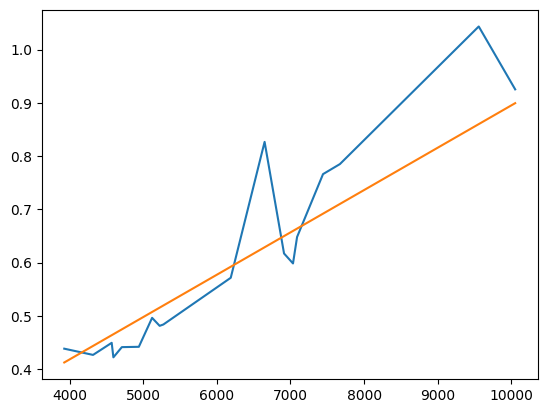

In [232]:
plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (((sigma_arc[-1] - sigma_arc[0])/(x_arc[-1] - x_arc[0])) * x_arc) + 0.1)

In [233]:
params_sigma_arc = Parameters()
params_sigma_arc.add('m', value=8.850519511761363e-05)
params_sigma_arc.add('n', value=0.1)

def residual_sigma_arc(params_sigma_arc, x, data, uncertainty):
    
    m = params_sigma_arc['m']
    n = params_sigma_arc['n']
    
    x = x_arc
    model = (m * x_arc) + n
    return (model - sigma_arc) / 0.05

np.random.seed(136)
out_sigma_arc = minimize(residual_sigma_arc, params_sigma_arc, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:10<00:00, 227.74it/s]


In [234]:
lmfit.report_fit(out_sigma_arc.params)

[[Variables]]
    m:  1.0181e-04 +/- 6.9595e-06 (6.84%) (init = 8.85052e-05)
    n: -0.02634920 +/- 0.04450977 (168.92%) (init = 0.1)
[[Correlations]] (unreported correlations are < 0.100)
    C(m, n) = -0.9642


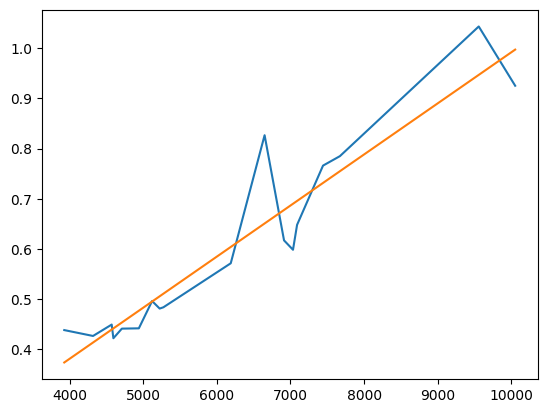

In [235]:
m = out_sigma_arc.flatchain.m.mean()
n = out_sigma_arc.flatchain.n.mean()

plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (m * x_arc) + n)

# Balmer decrements

In [236]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_nar.mean(), out_ha_nii.flatchain.Ha_nar.std()) \
            + ufloat(out_ha_nii.flatchain.Ha_brd.mean(), out_ha_nii.flatchain.Ha_brd.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_nar.mean(), out_hb.flatchain.Hb_nar.std()) \
            + ufloat(out_hb.flatchain.Hb_brd.mean(), out_hb.flatchain.Hb_brd.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_nar.mean(), out_hg.flatchain.Hg_nar.std()) \
            + ufloat(out_hg.flatchain.Hg_brd.mean(), out_hg.flatchain.Hg_brd.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_nar.mean(), out_hd.flatchain.Hd_nar.std()) \
            + ufloat(out_hd.flatchain.Hd_brd.mean(), out_hd.flatchain.Hd_brd.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

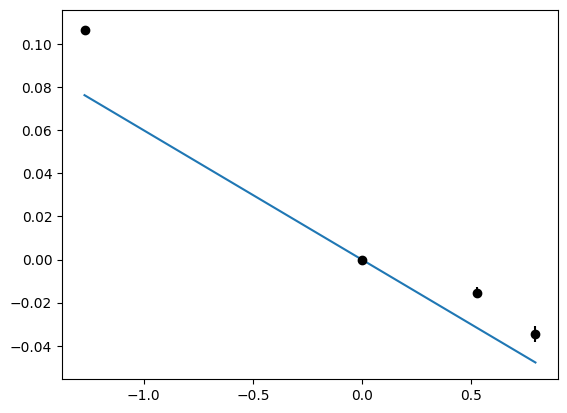

In [237]:
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, x_balmer * (-0.4 * 0.15))

In [238]:
params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.15)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer)) / 0.05

np.random.seed(950)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:11<00:00, 212.17it/s]


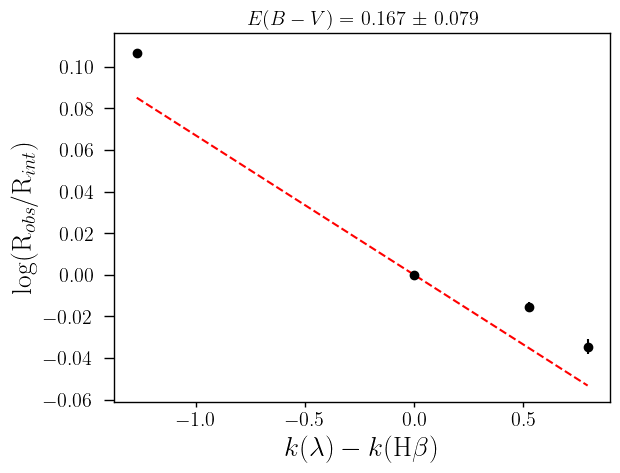

In [239]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'$E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J0023.pdf', bbox_inches='tight')

In [314]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


# Temperatures

In [315]:
heiia_nar_chain = out_heii4685.flatchain.Heii4685_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_brd_chain = out_heii4685.flatchain.Heii4685_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_tot_chain = heiia_nar_chain + heiia_brd_chain

heia_nar_chain = out_hei7065.flatchain.Hei7065_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_brd_chain = out_hei7065.flatchain.Hei7065_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_tot_chain = heia_nar_chain + heia_brd_chain

heib_nar_chain = out_hei6678.flatchain.Hei6678_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_brd_chain = out_hei6678.flatchain.Hei6678_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_tot_chain = heib_nar_chain + heib_brd_chain

heic_nar_chain = out_hei5875.flatchain.Hei5875_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_brd_chain = out_hei5875.flatchain.Hei5875_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_tot_chain = heic_nar_chain + heic_brd_chain

heid_nar_chain = out_hei4471.flatchain.Hei4471_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_brd_chain = out_hei4471.flatchain.Hei4471_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_tot_chain = heid_nar_chain + heid_brd_chain

oiiia_nar_chain = out_oiii_hei.flatchain.Oiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_brd_chain = out_oiii_hei.flatchain.Oiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_tot_chain = oiiia_nar_chain + oiiia_brd_chain

oiiib_nar_chain = out_oiii_4959.flatchain.Oiiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_brd_chain = out_oiii_4959.flatchain.Oiiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_tot_chain = oiiib_nar_chain + oiiib_brd_chain

oiiic_nar_chain = out_oiiic.flatchain.Oiiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_brd_chain = out_oiiic.flatchain.Oiiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_tot_chain = oiiic_nar_chain + oiiic_brd_chain

siia_nar_chain = out_sii.flatchain.Siia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_brd_chain = out_sii.flatchain.Siia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_tot_chain = siia_nar_chain + siia_brd_chain

siib_nar_chain = out_sii.flatchain.Siib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_brd_chain = out_sii.flatchain.Siib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_tot_chain = siib_nar_chain + siib_brd_chain

oiia_nar_chain = out_oii_7320.flatchain.Oiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_brd_chain = out_oii_7320.flatchain.Oiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_tot_chain = oiia_nar_chain + oiia_brd_chain

oiib_nar_chain = out_oii_7320.flatchain.Oiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_brd_chain = out_oii_7320.flatchain.Oiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_tot_chain = oiib_nar_chain + oiib_brd_chain

oiic_nar_chain = out_oii_3727.flatchain.Oiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_brd_chain = out_oii_3727.flatchain.Oiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_tot_chain = oiic_nar_chain + oiic_brd_chain

oiid_nar_chain = out_oii_3727.flatchain.Oiid_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_brd_chain = out_oii_3727.flatchain.Oiid_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_tot_chain = oiid_nar_chain + oiid_brd_chain

siiia_nar_chain = out_siiia.flatchain.Siiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_brd_chain = out_siiia.flatchain.Siiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_tot_chain = siiia_nar_chain + siiia_brd_chain

siiib_nar_chain = out_siiib.flatchain.Siiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_brd_chain = out_siiib.flatchain.Siiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_tot_chain = siiib_nar_chain + siiib_brd_chain

siiic_nar_chain = out_oi_siii.flatchain.Siiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_brd_chain = out_oi_siii.flatchain.Siiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_tot_chain = siiic_nar_chain + siiic_brd_chain

niia_nar_chain = out_ha_nii.flatchain.Niia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_brd_chain = out_ha_nii.flatchain.Niia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_tot_chain = niia_nar_chain + niia_brd_chain

niib_nar_chain = out_ha_nii.flatchain.Niia_nar * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_brd_chain = out_ha_nii.flatchain.Niia_brd * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_tot_chain = niib_nar_chain + niib_brd_chain

hd_nar_chain = out_hd.flatchain.Hd_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_brd_chain = out_hd.flatchain.Hd_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_tot_chain = hd_nar_chain + hd_brd_chain

hg_nar_chain = out_hg.flatchain.Hg_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_brd_chain = out_hg.flatchain.Hg_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_tot_chain = hg_nar_chain + hg_brd_chain

hb_nar_chain = out_hb.flatchain.Hb_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_brd_chain = out_hb.flatchain.Hb_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_tot_chain = hb_nar_chain + hb_brd_chain

ha_nar_chain = out_ha_nii.flatchain.Ha_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_brd_chain = out_ha_nii.flatchain.Ha_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_tot_chain = ha_nar_chain + ha_brd_chain

In [316]:
chains_dict = {'[OII]3726_nar': oiid_nar_chain.to_numpy(),
               '[OII]3726_brd': oiid_brd_chain.to_numpy(),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': oiic_nar_chain.to_numpy(),
               '[OII]3729_brd': oiic_brd_chain.to_numpy(),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               'Hd_nar': hd_nar_chain.to_numpy(),
               'Hd_brd': hd_brd_chain.to_numpy(),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': hg_nar_chain.to_numpy(),
               'Hg_brd': hg_brd_chain.to_numpy(),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': oiiic_nar_chain.to_numpy(),
               '[OIII]4363_brd': oiiic_brd_chain.to_numpy(),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': heid_nar_chain.to_numpy(),
               'HeI4471_brd': heid_brd_chain.to_numpy(),
               'HeI4471': heid_tot_chain.to_numpy(),
               
               'HeII4686_nar': heiia_nar_chain.to_numpy(),
               'HeII4686_brd': heiia_brd_chain.to_numpy(),
               'HeII4686': heiia_tot_chain.to_numpy(),
               
               'Hb_nar': hb_nar_chain.to_numpy(),
               'Hb_brd': hb_brd_chain.to_numpy(),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': oiiib_nar_chain.to_numpy(),
               '[OIII]4959_brd': oiiib_brd_chain.to_numpy(),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': oiiia_nar_chain.to_numpy(),
               '[OIII]5007_brd': oiiia_brd_chain.to_numpy(),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': np.nan * np.ones(10000),
               '[NII]5755_brd': np.nan * np.ones(10000),
               '[NII]5755': np.nan * np.ones(10000),
               
               'HeI5875_nar': heic_nar_chain.to_numpy(),
               'HeI5875_brd': heic_brd_chain.to_numpy(),
               'HeI5875': heic_tot_chain.to_numpy(),
               
               '[SIII]6312_nar': siiic_nar_chain.to_numpy(),
               '[SIII]6312_brd': siiic_brd_chain.to_numpy(),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': niib_nar_chain.to_numpy(),
               '[NII]6548_brd': niib_brd_chain.to_numpy(),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': ha_nar_chain.to_numpy(),
               'Ha_brd': ha_brd_chain.to_numpy(),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': niia_nar_chain.to_numpy(),
               '[NII]6584_brd': niia_brd_chain.to_numpy(),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': heib_nar_chain.to_numpy(),
               'HeI6678_brd': heib_brd_chain.to_numpy(),
               'HeI6678': heib_tot_chain.to_numpy(),
               
               '[SII]6716_nar': siib_nar_chain.to_numpy(),
               '[SII]6716_brd': siib_brd_chain.to_numpy(),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': siia_nar_chain.to_numpy(),
               '[SII]6730_brd': siia_brd_chain.to_numpy(),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': heia_nar_chain.to_numpy(),
               'HeI7065_brd': heia_brd_chain.to_numpy(),
               'HeI7065': heia_tot_chain.to_numpy(),
               
               '[OII]7319_nar': oiib_nar_chain.to_numpy(),
               '[OII]7319_brd': oiib_brd_chain.to_numpy(),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': oiia_nar_chain.to_numpy(),
               '[OII]7330_brd': oiia_brd_chain.to_numpy(),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': siiib_nar_chain.to_numpy(),
               '[SIII]9069_brd': siiib_brd_chain.to_numpy(),
               '[SIII]9069': siiib_tot_chain.to_numpy(),
               
               '[SIII]9532_nar': siiia_nar_chain.to_numpy(),
               '[SIII]9532_brd': siiia_brd_chain.to_numpy(),
               '[SIII]9532': siiia_tot_chain.to_numpy()
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J0023.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J0021.csv')

In [317]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': heid_tot_chain.mean(),
              'HeI4471_err': heid_tot_chain.std(),
              'HeII4686': heiia_tot_chain.mean(),
              'HeII4686_err': heiia_tot_chain.std(),
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5575': None,
              '[NII]5575_err': None,
              'HeI5875': heic_tot_chain.mean(),
              'HeI5875_err': heic_tot_chain.std(),
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': heib_tot_chain.mean(),
              'HeI6678_err': heib_tot_chain.std(),
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': heia_tot_chain.mean(),
              'HeI7065_err': heia_tot_chain.std(),
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': siiib_tot_chain.mean(),
              '[SIII]9069_err': siiib_tot_chain.std(),
              '[SIII]9532': siiia_tot_chain.mean(),
              '[SIII]9532_err': siiia_tot_chain.std()
              
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal

galname = 'J0023'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]

if E_BV < 0:
    E_BV = 0

In [3]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J0023.csv')

In [4]:
t_OIII_nar = TO3(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['[OIII]4363_nar'].to_numpy())
t_OIII_brd = TO3(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['[OIII]4363_brd'].to_numpy())
t_OIII_tot = TO3(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['[OIII]4363'].to_numpy())

O2_H_nar = 10**(double_log_OH(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OIII_nar) - 12)
O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
O2_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['Hb'].to_numpy()    , t_OIII_tot) - 12)

IO2_R_nar = 9.36 * (t_OIII_nar**0.44) * O2_H_nar * chains['Hb_nar'].to_numpy()
IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
IO2_R_tot = 9.36 * (t_OIII_tot**0.44) * O2_H_tot * chains['Hb'].to_numpy()    

den_nar = ne(chains['[SII]6730_nar'].to_numpy(), chains['[SII]6716_nar'].to_numpy(), t_OIII_nar)
den_brd = ne(chains['[SII]6730_brd'].to_numpy(), chains['[SII]6716_brd'].to_numpy(), t_OIII_brd)
den_tot = ne(chains['[SII]6730'].to_numpy()    , chains['[SII]6716'].to_numpy()    , t_OIII_tot)

t_OII_nar = TO2(chains['[OII]7330_nar'].to_numpy(), chains['[OII]7319_nar'].to_numpy(), chains['[OII]3729_nar'].to_numpy(), chains['[OII]3726_nar'].to_numpy(), den_nar, IO2_R_nar)
t_OII_brd = TO2(chains['[OII]7330_brd'].to_numpy(), chains['[OII]7319_brd'].to_numpy(), chains['[OII]3729_brd'].to_numpy(), chains['[OII]3726_brd'].to_numpy(), den_brd, IO2_R_brd)
t_OII_tot = TO2(chains['[OII]7330'].to_numpy()    , chains['[OII]7319'].to_numpy()    , chains['[OII]3729'].to_numpy()    , chains['[OII]3726'].to_numpy()    , den_tot, IO2_R_tot)

# Garnett
t_OII_tot_garnett = ((0.7 * (t_OIII_tot * 10)) + 0.3) / 10

# PM17 DENSITY DEPENDENT
#t_OII_tot_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_tot_lin = (slope_o3o2 * t_OIII_tot) + intercept_o3o2

# Non-linear
#t_OII_tot_nlin = (2.4 / ((t_OIII_tot**-1) + 1.5))

# Polynomial
#t_OII_tot_poly = (-6.6 * t_OIII_tot) + (15.1 * (t_OIII_tot**2)) + (-8.3 * (t_OIII_tot**3)) + (0.69 * (t_OIII_tot**5))

# Square root
#t_OII_tot_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot))

t_SIII_nar = TS3(chains['[SIII]9532_nar'].to_numpy(), chains['[SIII]9069_nar'].to_numpy(), chains['[SIII]6312_nar'].to_numpy())
t_SIII_brd = TS3(chains['[SIII]9532_brd'].to_numpy(), chains['[SIII]9069_brd'].to_numpy(), chains['[SIII]6312_brd'].to_numpy())
t_SIII_tot = TS3(chains['[SIII]9532'].to_numpy()    , chains['[SIII]9069'].to_numpy()    , chains['[SIII]6312'].to_numpy()    )

/home/benjamin/Documents/analogs/magE/functions.py:807: RuntimeWarning: invalid value encountered in log10
  s1 = 6.1868 + (1.2491 / th) - (0.5816 * np.log10(th))
/tmp/ipykernel_327751/1394997360.py:6: RuntimeWarning: overflow encountered in power
  O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
/tmp/ipykernel_327751/1394997360.py:10: RuntimeWarning: invalid value encountered in power
  IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
/home/benjamin/Documents/analogs/magE/functions.py:754: RuntimeWarning: divide by zero encountered in divide
  return a0_n(n) + (a1_n(n) * RO2) + (a2_n(n) / RO2)


(0.0, 1.0, 0.0, 1.0)

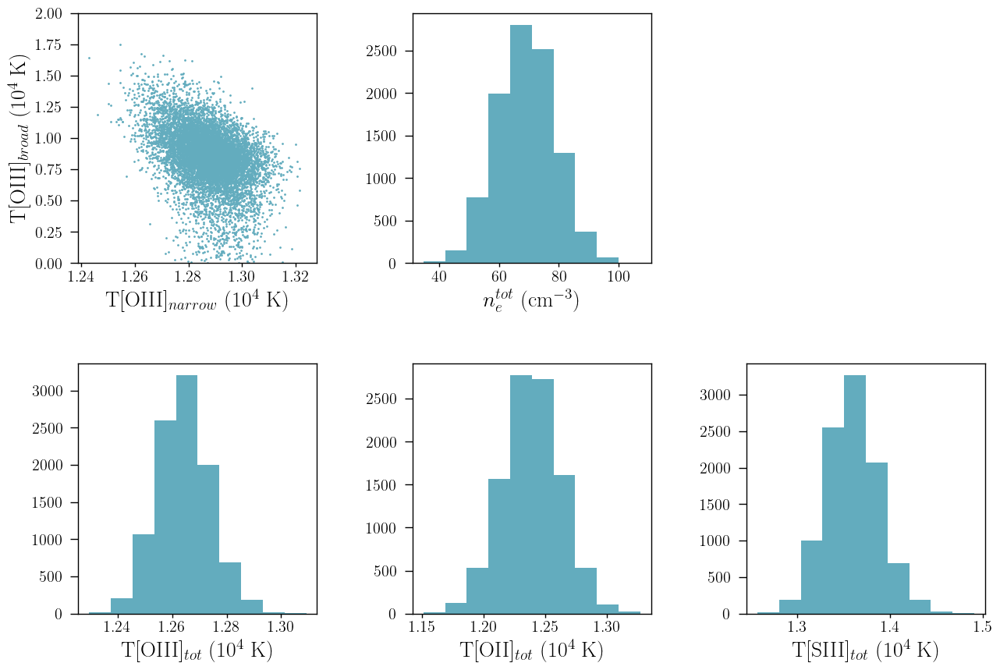

In [5]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')
axs[0, 0].set_ylim(0, 2)

axs[1, 0].hist(t_OIII_tot, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(den_tot, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(t_OII_tot, color=cr[2])
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

axs[1, 2].hist(t_SIII_tot, color=cr[2])
axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 2].axis('off')

In [6]:
t_OIII_nar_mean = np.nanpercentile(t_OIII_nar, 50)
t_OIII_nar_16 = np.nanpercentile(t_OIII_nar, 16)
t_OIII_nar_84 = np.nanpercentile(t_OIII_nar, 84)

t_OIII_brd_mean = np.nanpercentile(t_OIII_brd, 50)
t_OIII_brd_16 = np.nanpercentile(t_OIII_brd, 16)
t_OIII_brd_84 = np.nanpercentile(t_OIII_brd, 84)

t_OIII_tot_mean = np.nanpercentile(t_OIII_tot, 50)
t_OIII_tot_16 = np.nanpercentile(t_OIII_tot, 16)
t_OIII_tot_84 = np.nanpercentile(t_OIII_tot, 84)

# Measured by me
t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Photoionization models
t_OII_garnett = ((0.7 * (t_OIII_tot_mean * 10)) + 0.3) / 10
t_OII_garnett_16 = ((0.7 * (t_OIII_tot_16 * 10)) + 0.3) / 10
t_OII_garnett_84 = ((0.7 * (t_OIII_tot_84 * 10)) + 0.3) / 10

# Using PM
#t_OII_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_mean**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_16 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_16**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_84 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_84**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_lin = (slope_o3o2 * t_OIII_tot_mean) + intercept_o3o2
t_OII_lin_16 = (slope_o3o2 * t_OIII_tot_16) + intercept_o3o2
t_OII_lin_84 = (slope_o3o2 * t_OIII_tot_84) + intercept_o3o2

# Non-linear
#t_OII_nlin = (2.4 / ((t_OIII_tot_mean**-1) + 1.5))
#t_OII_nlin_16 = (2.4 / ((t_OIII_tot_16**-1) + 1.5))
#t_OII_nlin_84 = (2.4 / ((t_OIII_tot_84**-1) + 1.5))

# Polynomial
#t_OII_poly = (-6.6 * t_OIII_tot_mean) + (15.1 * (t_OIII_tot_mean**2)) + (-8.3 * (t_OIII_tot_mean**3)) + (0.69 * (t_OIII_tot_mean**5))
#t_OII_poly_16 = (-6.6 * t_OIII_tot_16) + (15.1 * (t_OIII_tot_16**2)) + (-8.3 * (t_OIII_tot_16**3)) + (0.69 * (t_OIII_tot_16**5))
#t_OII_poly_84 = (-6.6 * t_OIII_tot_84) + (15.1 * (t_OIII_tot_84**2)) + (-8.3 * (t_OIII_tot_84**3)) + (0.69 * (t_OIII_tot_84**5))

# Square-root
#t_OII_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot_mean))
#t_OII_sqrt_16 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_16))
#t_OII_sqrt_84 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_84))

density = np.nanpercentile(den_tot, 50)
density_16 = np.nanpercentile(den_tot, 16)
density_84 = np.nanpercentile(den_tot, 84)

t_SIII = np.nanpercentile(t_SIII_tot, 50)
t_SIII_16 = np.nanpercentile(t_SIII_tot, 16)
t_SIII_84 = np.nanpercentile(t_SIII_tot, 84)

In [322]:
temden_dict = {'galname': galname,
               'tOIII_nar': t_OIII_nar_mean,
               'tOIII_nar_16': t_OIII_nar_16,
               'tOIII_nar_84': t_OIII_nar_84,
               'tOIII_brd': t_OIII_brd_mean,
               'tOIII_brd_16': t_OIII_brd_16,
               'tOIII_brd_84': t_OIII_brd_84,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               #'tOII_PM': t_OII_PM,
               #'tOII_PM_16': t_OII_PM_16,
               #'tOII_PM_84': t_OII_PM_84,
               #'tOII_lin': t_OII_lin,
               #'tOII_lin_16': t_OII_lin_16,
               #'tOII_lin_84': t_OII_lin_84,
               #'tOII_nlin': t_OII_nlin,
               #'tOII_nlin_16': t_OII_nlin_16,
               #'tOII_nlin_84': t_OII_nlin_84,
               #'tOII_poly': t_OII_poly,
               #'tOII_poly_16': t_OII_poly_16,
               #'tOII_poly_84': t_OII_poly_84,
               #'tOII_sqrt': t_OII_sqrt,
               #'tOII_sqrt_16': t_OII_sqrt_16,
               #'tOII_sqrt_84': t_OII_sqrt_84,
               'ne': density,
               'ne_16': density_16,
               'ne_84': density_84,
               'tNII': None,
               'tNII_16': None,
               'tNII_84': None,
               'tSIII': t_SIII,
               'tSIII_16': t_SIII_16,
               'tSIII_84': t_SIII_84,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


In [7]:
temden_dict = {'galname': galname,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               'tOII_lin': t_OII_lin,
               'tOII_lin_16': t_OII_lin_16,
               'tOII_lin_84': t_OII_lin_84
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


# Abundances

In [8]:
# HELIUM

tau_4471 = 0.921 * E_BV * k_cal(wave_cat['HeI4471'])
tau_5875 = 0.921 * E_BV * k_cal(wave_cat['HeI5875'])
tau_6678 = 0.921 * E_BV * k_cal(wave_cat['HeI6678'])
tau_7065 = 0.921 * E_BV * k_cal(wave_cat['HeI7065'])

f_4471 = optical_depth_function(t_OIII_tot, den_tot, tau_4471, line='4471')
f_5875 = optical_depth_function(t_OIII_tot, den_tot, tau_5875, line='5875')
f_6678 = optical_depth_function(t_OIII_tot, den_tot, tau_6678, line='6678')
f_7065 = optical_depth_function(t_OIII_tot, den_tot, tau_7065, line='7065')

F4471, F5875, F6678, F7065 = emissivities(t_OIII_tot, den_tot)

y_plus_F4471 = yplus(chains['HeI4471'].to_numpy(), chains['Hb'].to_numpy(), F4471, f_4471)
y_plus_F5875 = yplus(chains['HeI5875'].to_numpy(), chains['Hb'].to_numpy(), F5875, f_5875)
y_plus_F6678 = yplus(chains['HeI6678'].to_numpy(), chains['Hb'].to_numpy(), F6678, f_6678)
y_plus_F7065 = yplus(chains['HeI7065'].to_numpy(), chains['Hb'].to_numpy(), F7065, f_7065)

y_plus = np.nanmean(np.array([y_plus_F4471,
                              y_plus_F5875,
                              y_plus_F6678,
                              y_plus_F7065]), axis=0)

y2_plus = y2plus(chains['HeII4686'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
y = y_plus + y2_plus

In [9]:
# OXYGEN MEASURED

log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_tot = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot)

O2plus_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) * ICF_Oxygen
log_OH_tot = np.log10(O_H_tot) + 12

In [10]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot)

O2plus_H_G92 = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_G92 = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) * ICF_Oxygen
log_OH_G92 = np.log10(O_H_G92) + 12

In [11]:
# OXYGEN lin

log_O2plus_H_lin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_lin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot)

O2plus_H_lin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_lin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_lin = (O2plus_H_lin + Oplus_H_lin) * ICF_Oxygen
log_OH_lin = np.log10(O_H_lin) + 12

In [18]:
# OXYGEN PM

#log_O2plus_H_PM = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_PM = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot)
#
#O2plus_H_PM = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_PM = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_PM = (O2plus_H_PM + Oplus_H_PM) * ICF_Oxygen
#log_OH_PM = np.log10(O_H_PM) + 12

In [20]:
# OXYGEN nlin

#log_O2plus_H_nlin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_nlin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot)
#
#O2plus_H_nlin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_nlin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_nlin = (O2plus_H_nlin + Oplus_H_nlin) * ICF_Oxygen
#log_OH_nlin = np.log10(O_H_nlin) + 12

In [21]:
# OXYGEN poly

#log_O2plus_H_poly = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_poly = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot)
#
#O2plus_H_poly = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_poly = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_poly = (O2plus_H_poly + Oplus_H_poly) * ICF_Oxygen
#log_OH_poly = np.log10(O_H_poly) + 12

In [22]:
# OXYGEN sqrt

#log_O2plus_H_sqrt = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_sqrt = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot)
#
#O2plus_H_sqrt = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_sqrt = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_sqrt = (O2plus_H_sqrt + Oplus_H_sqrt) * ICF_Oxygen
#log_OH_sqrt = np.log10(O_H_sqrt) + 12

In [12]:
# SULFUR

log_S2plus_H_tot = double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot)
log_Splus_H_tot = single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

S2plus_H_tot = 10**(double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot) - 12)
Splus_H_tot = 10**(single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot) - 12)

ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)

S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
log_SH_tot = np.log10(S_H_tot) + 12

In [13]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'].to_numpy(), chains['[NII]6548'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = np.log10(N_H_tot) + 12

In [14]:
# Nitrogen-to-Oxygen ratio
log_NO_tot = log_NO(chains['[NII]6584'].to_numpy(), chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), t_OII_tot)

(0.0, 1.0, 0.0, 1.0)

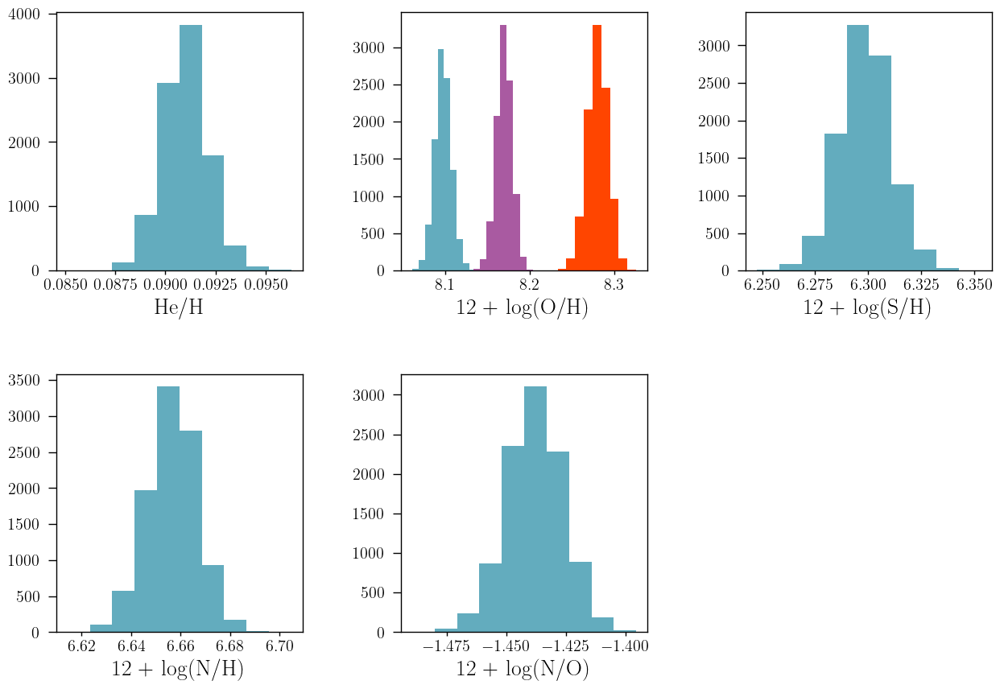

In [15]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(y, color=cr[2])
axs[0, 0].set_xlabel(r'He/H')

axs[0, 1].hist(log_OH_tot, color=cr[2])
axs[0, 1].hist(log_OH_G92, color='Orangered')
#axs[0, 1].hist(log_OH_PM, color='Pink')
axs[0, 1].hist(log_OH_lin, color=cz[1])
#axs[0, 1].hist(log_OH_nlin, color='Green')
#axs[0, 1].hist(log_OH_poly, color='Blue')
#axs[0, 1].hist(log_OH_sqrt, color='Gray')

axs[0, 1].set_xlabel(r'12 + log(O/H)')

axs[0, 2].hist(log_SH_tot, color=cr[2])
axs[0, 2].set_xlabel(r'12 + log(S/H)')

axs[1, 0].hist(log_NH_tot, color=cr[2])
axs[1, 0].set_xlabel(r'12 + log(N/H)')

axs[1, 1].hist(log_NO_tot, color=cr[2])
axs[1, 1].set_xlabel(r'12 + log(N/O)')

axs[1, 2].axis('off')

In [16]:
He_tot_mean = np.nanpercentile(y, 50)
He_tot_16 = np.nanpercentile(y, 16)
He_tot_84 = np.nanpercentile(y, 84)

log_OH_tot_mean = np.nanpercentile(log_OH_tot, 50)
log_OH_tot_16 = np.nanpercentile(log_OH_tot, 16)
log_OH_tot_84 = np.nanpercentile(log_OH_tot, 84)

log_OH_G92_mean = np.nanpercentile(log_OH_G92, 50)
log_OH_G92_16 = np.nanpercentile(log_OH_G92, 16)
log_OH_G92_84 = np.nanpercentile(log_OH_G92, 84)

#log_OH_PM_mean = np.nanpercentile(log_OH_PM, 50)
#log_OH_PM_16 = np.nanpercentile(log_OH_PM, 16)
#log_OH_PM_84 = np.nanpercentile(log_OH_PM, 84)

log_OH_lin_mean = np.nanpercentile(log_OH_lin, 50)
log_OH_lin_16 = np.nanpercentile(log_OH_lin, 16)
log_OH_lin_84 = np.nanpercentile(log_OH_lin, 84)

#log_OH_nlin_mean = np.nanpercentile(log_OH_nlin, 50)
#log_OH_nlin_16 = np.nanpercentile(log_OH_nlin, 16)
#log_OH_nlin_84 = np.nanpercentile(log_OH_nlin, 84)

#log_OH_poly_mean = np.nanpercentile(log_OH_poly, 50)
#log_OH_poly_16 = np.nanpercentile(log_OH_poly, 16)
#log_OH_poly_84 = np.nanpercentile(log_OH_poly, 84)

#log_OH_sqrt_mean = np.nanpercentile(log_OH_sqrt, 50)
#log_OH_sqrt_16 = np.nanpercentile(log_OH_sqrt, 16)
#log_OH_sqrt_84 = np.nanpercentile(log_OH_sqrt, 84)

log_SH_tot_mean = np.nanpercentile(log_SH_tot, 50)
log_SH_tot_16 = np.nanpercentile(log_SH_tot, 16)
log_SH_tot_84 = np.nanpercentile(log_SH_tot, 84)

log_NH_tot_mean = np.nanpercentile(log_NH_tot, 50)
log_NH_tot_16 = np.nanpercentile(log_NH_tot, 16)
log_NH_tot_84 = np.nanpercentile(log_NH_tot, 84)

log_NO_tot_mean = np.nanpercentile(log_NO_tot, 50)
log_NO_tot_16 = np.nanpercentile(log_NO_tot, 16)
log_NO_tot_84 = np.nanpercentile(log_NO_tot, 84)

In [331]:
abundance_dict = {'galname': galname,
               'He/H': He_tot_mean,
               'He/H_16': He_tot_16,
               'He/H_84': He_tot_84,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               #'log_OH_PM': log_OH_PM_mean,
               #'log_OH_PM_16': log_OH_PM_16,
               #'log_OH_PM_84': log_OH_PM_84,
               #'log_OH_lin': log_OH_lin_mean,
               #'log_OH_lin_16': log_OH_lin_16,
               #'log_OH_lin_84': log_OH_lin_84,
               #'log_OH_nlin': log_OH_nlin_mean,
               #'log_OH_nlin_16': log_OH_nlin_16,
               #'log_OH_nlin_84': log_OH_nlin_84,
               #'log_OH_poly': log_OH_poly_mean,
               #'log_OH_poly_16': log_OH_poly_16,
               #'log_OH_poly_84': log_OH_poly_84,
               #'log_OH_sqrt': log_OH_sqrt_mean,
               #'log_OH_sqrt_16': log_OH_sqrt_16,
               #'log_OH_sqrt_84': log_OH_sqrt_84,
               'log_SH': log_SH_tot_mean,
               'log_SH_16': log_SH_tot_16,
               'log_SH_84': log_SH_tot_84,
               'log_NH': log_NH_tot_mean,
               'log_NH_16': log_NH_tot_16,
               'log_NH_84': log_NH_tot_84,
               'log_NO': log_NO_tot_mean,
               'log_NO_16': log_NO_tot_16,
               'log_NO_84': log_NO_tot_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


In [17]:
abundance_dict = {'galname': galname,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               'log_OH_lin': log_OH_lin_mean,
               'log_OH_lin_16': log_OH_lin_16,
               'log_OH_lin_84': log_OH_lin_84
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0023, adding new data...
Done.


# Test for Starlight

(0.0, 1e-15)

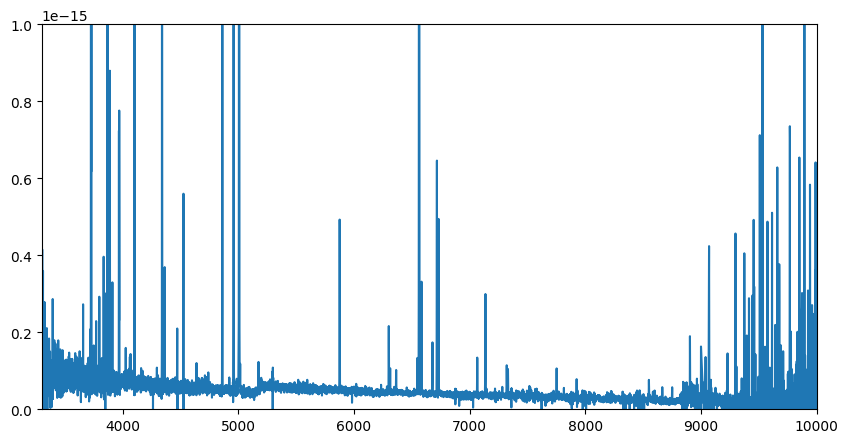

In [30]:
rf_wave = wave / (1 + z_nar_oiii_4959)
plt.figure(figsize=(10, 5))
plt.plot(rf_wave, flux)
plt.xlim(3300, 10000)
plt.ylim(0.0, 0.1e-14)

In [31]:
import spectres

rf_new_wave = np.arange(3300, 10000, 1)
new_flux, new_err = spectres.spectres(rf_new_wave, rf_wave, flux, err)

mask_flux = (new_flux > 0)

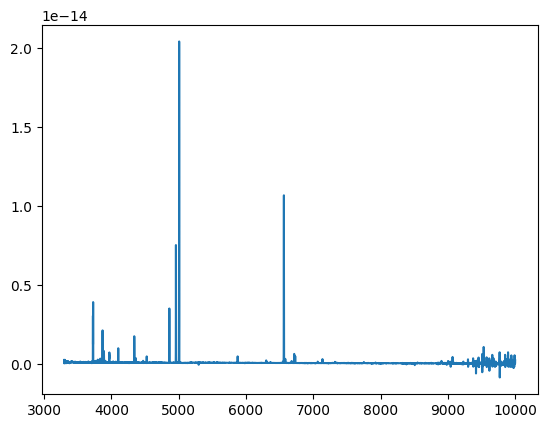

In [33]:
plt.plot(rf_new_wave, new_flux)

In [34]:
mask = False
mask_count = 0
mask_list = []
for line in wave_cat:
    if (wave_cat[line] > 3300) & (wave_cat[line] < 10000):
        sigma_line = (1.0675e-04 * (wave_cat[line] * (1 + z_nar_oiii_4959))) - 0.03523902
        sigma3 = 3 * np.sqrt(((upy.nominal_values(sigma_brd_intrinsic)**2) + (sigma_line**2)))
        lim_sup = wave_cat[line] + sigma3
        lim_inf = wave_cat[line] - sigma3
        mask_list.append([round(lim_inf), round(lim_sup)])
        mask_count += 1
        mask += (rf_new_wave > lim_inf) & (rf_new_wave < lim_sup)

In [35]:
with open('J0023_mask.cxt', 'a', newline='\n') as f:
    f.write(str(mask_count)+'\n')
    for masks in mask_list:
        f.write(str(masks[0])+' '+str(masks[1])+' '+'0\n')

In [36]:
from scipy.signal import medfilt
gpixs = np.where(abs(new_flux[~mask]-medfilt(new_flux[~mask],31))<0.7e-16)[0]

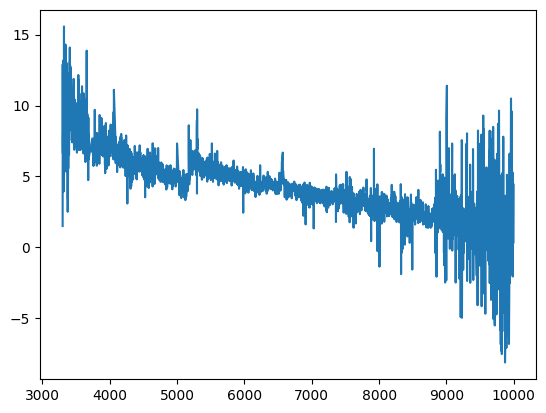

In [37]:
plt.plot(rf_new_wave[~mask][gpixs], new_flux[~mask][gpixs]/1e-17)
#plt.xlim(6500, 7000)
#plt.ylim(1e-16, 3e-16)

In [38]:
from astropy.io import ascii
for i in range(len(rf_new_wave)):
    if i in gpixs:
        flag = 0
    else:
        flag = 99
    spec_str = str(rf_new_wave[i])+' '+str(new_flux[i]/1e-17)+' '+str(new_err[i]/1e-17)+' '+str(flag)+'\n'
    with open('J0023.cxt', 'a', newline='\n') as f:
        f.write(spec_str)

# After fitting

In [56]:
with open('/home/benjamin/Documents/STARLIGHTv04/J0023/J0023.cxt.sc4.C99.im.CAL.BS', 'r') as bf:
    # limits of lines to read
    line_lims = [531, 7231]
    # To store lines
    lines = []
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 7231:
            # don't read after line 7 to save time
            break
print(lines)

['3300.00    4.30113   1.53468   -2.000', '3301.00    0.27305   1.52826    0.800', '3302.00    2.35429   1.52437    0.859', '3303.00    1.32680   1.52291    0.866', '3304.00    4.22249   1.52259   -2.000', '3305.00    1.20753   1.52258    0.962', '3306.00    1.46019   1.52262    1.040', '3307.00    3.86218   1.52266   -2.000', '3308.00    3.98630   1.52270   -2.000', '3309.00    1.48301   1.52274    1.190', '3310.00    2.86435   1.52278   -2.000', '3311.00    4.04746   1.52281   -2.000', '3312.00    2.08268   1.52280    1.358', '3313.00    1.59308   1.52251    1.516', '3314.00    2.40700   1.52117    1.448', '3315.00    1.41989   1.51761    1.560', '3316.00    1.78110   1.51177    1.627', '3317.00    0.96761   1.50593    1.789', '3318.00    0.71908   1.50237    1.740', '3319.00    1.53085   1.50100    1.807', '3320.00    1.83292   1.50058    1.944', '3321.00    2.84216   1.50003    2.019', '3322.00    3.22812   1.49879   -2.000', '3323.00    1.04162   1.49707    2.064', '3324.00    2.3

In [57]:
wl = []
input_flux = []
best_model = []
for element in lines:
    wl.append(float(element.split()[0]))
    input_flux.append(float(element.split()[1]))
    best_model.append(float(element.split()[2]))

(0.0, 5.0)

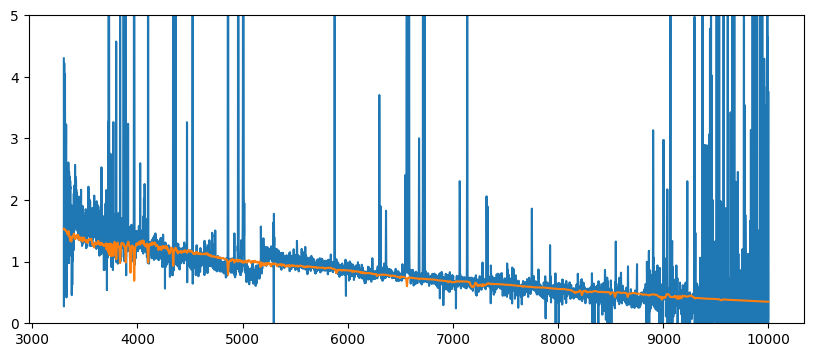

In [63]:
plt.figure(figsize=(10, 4))
plt.plot(wl, input_flux)
plt.plot(wl, best_model)
#plt.xlim(6000, 7000)
plt.ylim(0, 5)

(-1e-16, 5e-17)

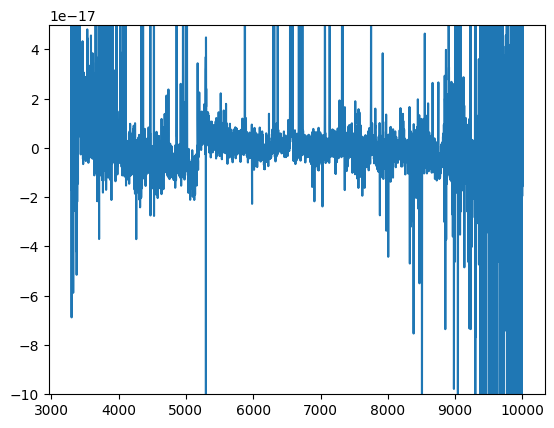

In [71]:
plt.plot(np.array(wl), (np.array(input_flux) - np.array(best_model)) * 5.480447E+00 * 1e-17)
plt.ylim(-0.1e-15, 0.5e-16)

In [65]:
np.log10(2.31317E+04 * 1e-17 * (1/3.826e33) * 4 * np.pi * ((7.38711e+26)**2))

8.617621581665665

In [20]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

117.46443239198206

In [19]:
z_nar_oiii_4959

0.05337982520594247